# Examining E7.25 data with Seurat (with Cell Cycle correction)

### Methods

In [1]:
library(grid)

heatMapDimRange <- function(dimm){
    options(repr.plot.res=400)
    options(repr.plot.height=NULL)
   
    seu_ob <- tsnes_dim[[dimm]]
    mar_ob <- marker_list[[dimm]]
    mar_10 <- marker_list[[dimm]] %>% group_by(cluster) %>% top_n(15, avg_logFC)
    
    p0 <- TSNEPlot(object= seu_ob, do.plot = F, do.return = T)
    
    p1 <- DoHeatmap(
        object = seu_ob, 
        genes.use = mar_ob$gene,
        remove.key = TRUE,
        title = paste("Dims 1:", dimm, " [Full Gene List]", sep=""),
        cex.row = 0,
        do.plot = F,
        slim.col.label = T
    )

    p2 <- DoHeatmap(
        object = seu_ob, 
        genes.use = mar_10$gene,
        remove.key = TRUE,
        title = paste("Dims 1:", dimm, " [Top 15 Gene List]", sep=""),
        cex.row = 5,
        do.plot = F,
        slim.col.label = T
    )
    
    lay <- rbind(
        c(1,2),
        c(3,3),
        c(3,3)
    )
    grid.arrange(p0,p1,p2, layout_matrix = lay)
}

genexprDimRange <- function(dimm){
    options(repr.plot.res=200)
    options(repr.plot.height=3)
    
    seu_ob <- tsnes_dim[[dimm]]
    mar_ob <- marker_list[[dimm]]
    mar_10 <- marker_list[[dimm]] %>% group_by(cluster) %>% top_n(15, avg_logFC)
    
    # Subclusters
    clusters <- sort(unique(seu_ob@ident))
    colours <- unlist(lapply(clusters, function(x) "grey"))

    i <- 0

    for (r in clusters){
        i <- i + 1
        highlight_cluster <- colours
        highlight_cluster[i] <- "red"
       
        TSNEPlot(object= seu_ob,
            colors.use = highlight_cluster
            #do.plot = F,
            #do.return = T
        )
        cat("Cluster", r)
        #options(repr.plot.height=NULL)
        
        list_of_genes <- head(mar_10[mar_10$cluster == r,]$gene)
        
        if (sum(c("T") %in% mar_ob[mar_ob$cluster == r,]$gene) > 0){
            list_of_genes <- c(list_of_genes, "T")
        }
        
        if (sum(c("Eomes") %in% mar_ob[mar_ob$cluster == r,]$gene) > 0){
            list_of_genes <- c(list_of_genes, "Eomes")
        }
        
        list_of_genes <- unique(sort(list_of_genes))
        
        FeaturePlot(
            seu_ob, 
            list_of_genes,
            cols.use = c("lightgrey", "blue"),
            no.axes = T,
            nCol = 3
        )
        
        #print(t1,t2, cols=2)
    }
}

exploreDimRange <- function(dimm){
    heatMapDimRange(dimm)
    genexprDimRange(dimm)
}

In [607]:
multiplot <- function(..., plotlist=NULL, file, cols=1, layout=NULL) {
  library(grid)

  # Make a list from the ... arguments and plotlist
  plots <- c(list(...), plotlist)

  numPlots = length(plots)

  # If layout is NULL, then use 'cols' to determine layout
  if (is.null(layout)){
    # Make the panel
    # ncol: Number of columns of plots
    # nrow: Number of rows needed, calculated from # of cols
    layout <- t(matrix(seq(1, cols * ceiling(numPlots/cols)),
                    ncol = ceiling(numPlots/cols), nrow = cols))
  }

 if (numPlots==1) {
    print(plots[[1]])

  } else {
    # Set up the page
    grid.newpage()
    pushViewport(viewport(layout = grid.layout(nrow(layout), ncol(layout))))

    # Make each plot, in the correct location
    for (i in 1:numPlots) {
      # Get the i,j matrix positions of the regions that contain this subplot
      matchidx <- as.data.frame(which(layout == i, arr.ind = TRUE))

      print(plots[[i]], vp = viewport(layout.pos.row = matchidx$row,
                                      layout.pos.col = matchidx$col))
    }
  }
}

### Load libs and source matrix

In [2]:
# Load libs and source matrix
packages <- c("SingleCellExperiment", "Seurat", "mclust", "dplyr")
zzz<-lapply(packages, function(xxx) 
    suppressMessages(require(xxx, character.only = TRUE,quietly=TRUE,warn.conflicts = T))
)
pdata <- readRDS("source/E725.quantif.matrix")

## Create initial Seurat object with filteirng 

 * Genes must exist in > 3 cells
 * Each cell must have > 200 genes

In [3]:
seuset <- CreateSeuratObject(raw.data = pdata, min.cells = 3, min.genes = 200)

In [4]:
# help("FilterCells")
seuset_f <- FilterCells(
    object = seuset, 
    subset.names = c("nUMI"), 
    high.thresholds = c(2e7),
    low.thresholds = c(3000)
)

### Distribution of counts per cell, and genes per cell before and after filter

Cells with counts above 2e7 and less than 3000 are discarded as being over or under expressive

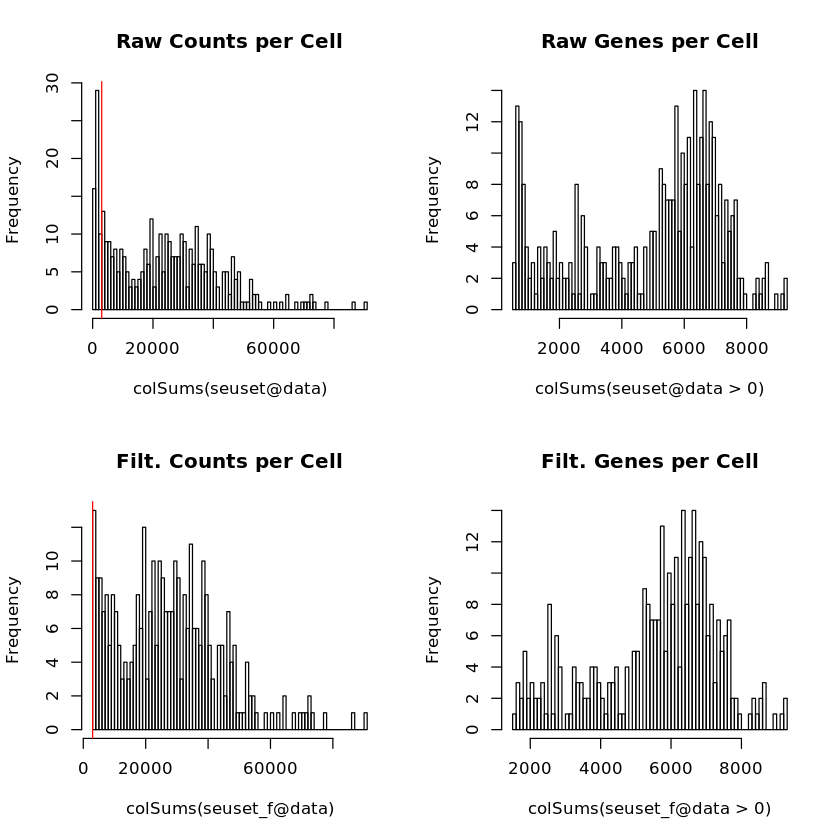

In [5]:
par(mfrow=c(2,2))
hist(colSums(seuset@data), breaks = 100, main = "Raw Counts per Cell")
abline(v=3000, col = 'red')
hist(colSums(seuset@data > 0), breaks = 100, main = "Raw Genes per Cell")

hist(colSums(seuset_f@data), breaks = 100, main = "Filt. Counts per Cell")
abline(v=3000, col = 'red')
hist(colSums(seuset_f@data > 0), breaks = 100, main = "Filt. Genes per Cell")

Raw

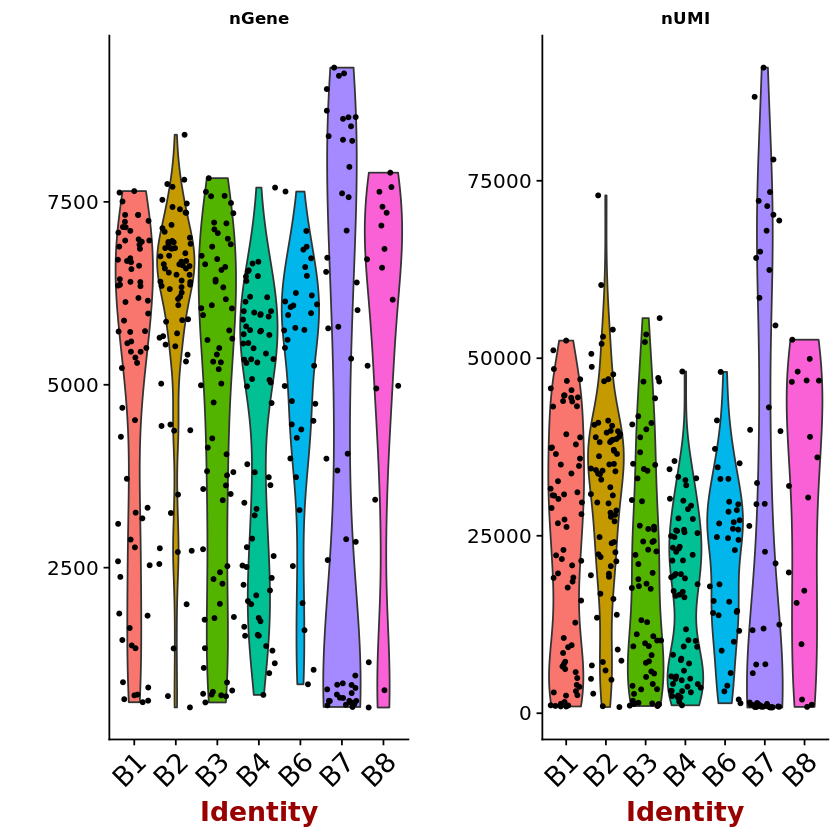

Filtered

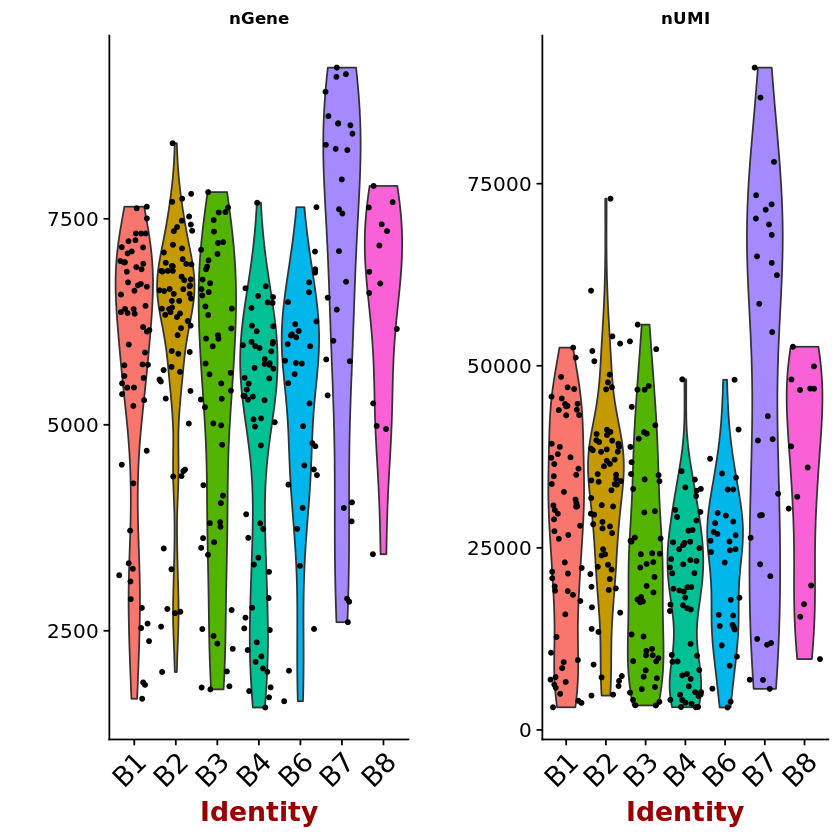

In [6]:
#par(mfrow=c(2,1))
VlnPlot(
    object = seuset, 
    features.plot = c("nGene", "nUMI"),
    x.lab.rot = 90,
    use.raw = T,
    nCol = 2, size.title.use = 10
)
cat("Raw")
VlnPlot(
    object = seuset_f, 
    features.plot = c("nGene", "nUMI"),
    x.lab.rot = 90,
    nCol = 2, size.title.use = 10
)
cat("Filtered")

Most counts are 0 except in Batch 6 where it's more spread. 

Batch 7 has a lot of variability in it's cells -- very high and very low.
 * The low we can balance out by simply discarding low counts as low quality cells
 * The high we should not remove since it is likely informative to the analysis, but we can reduce the effect of this batch by normalisation


integer(0)

integer(0)

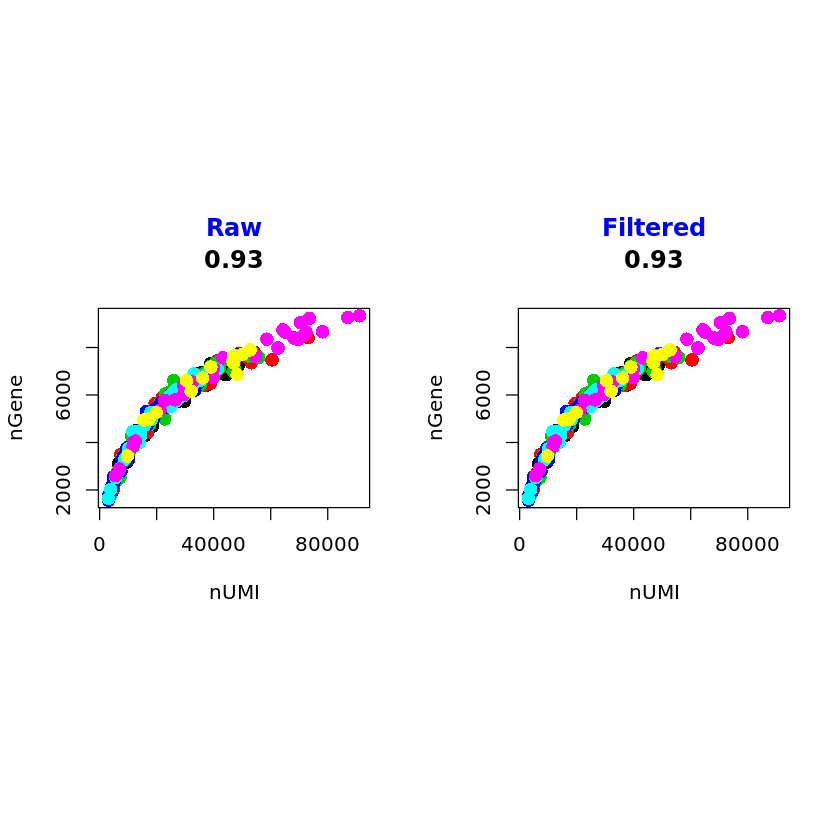

In [138]:
layout(matrix(c(1,2), ncol = 2), widths=c(1,1), heights=c(1,1), T)
#par(mar = c(0,0,0,0))
GenePlot(
    object = seuset, 
    gene1 = "nUMI", 
    gene2 = "nGene",
    use.raw = T,
) + title("Raw", col.main = 4, line = 3)
GenePlot(
    object = seuset_f, 
    gene1 = "nUMI", 
    gene2 = "nGene"
) + title("Filtered", col.main = 4, line = 3)

Umi scales logarithmically with Genes as expected, and this is reflected in the filtered data too

In [7]:
tab <- rbind(
    dim(seuset@data),
    dim(seuset_f@data)
)
rownames(tab) <- c("Raw", "Filt.")
colnames(tab) <- c("Genes", "Cells")
tab

,Genes,Cells
Raw,16185,381
Filt.,16185,326


## Normalise the data

In [9]:
seuset_n <- NormalizeData(
    object = seuset_f, 
    normalization.method = "LogNormalize", 
    scale.factor = 10000
)

### Quick examination of normalisation affect upon the data
(answer: Vlnplot and GenePlot doesn't seem to show the effect)

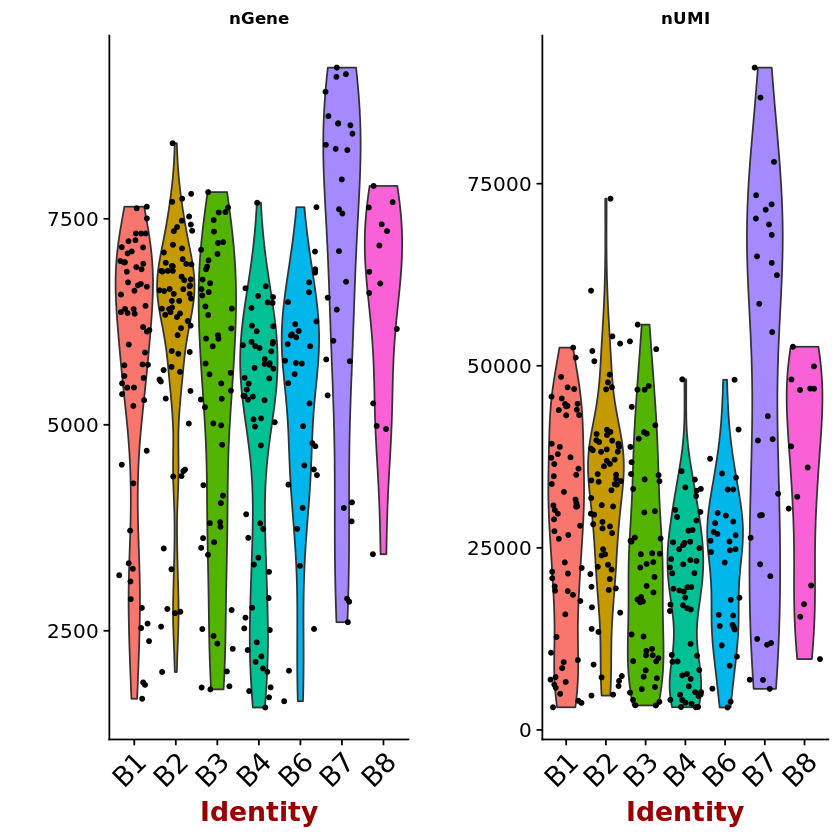

integer(0)

integer(0)

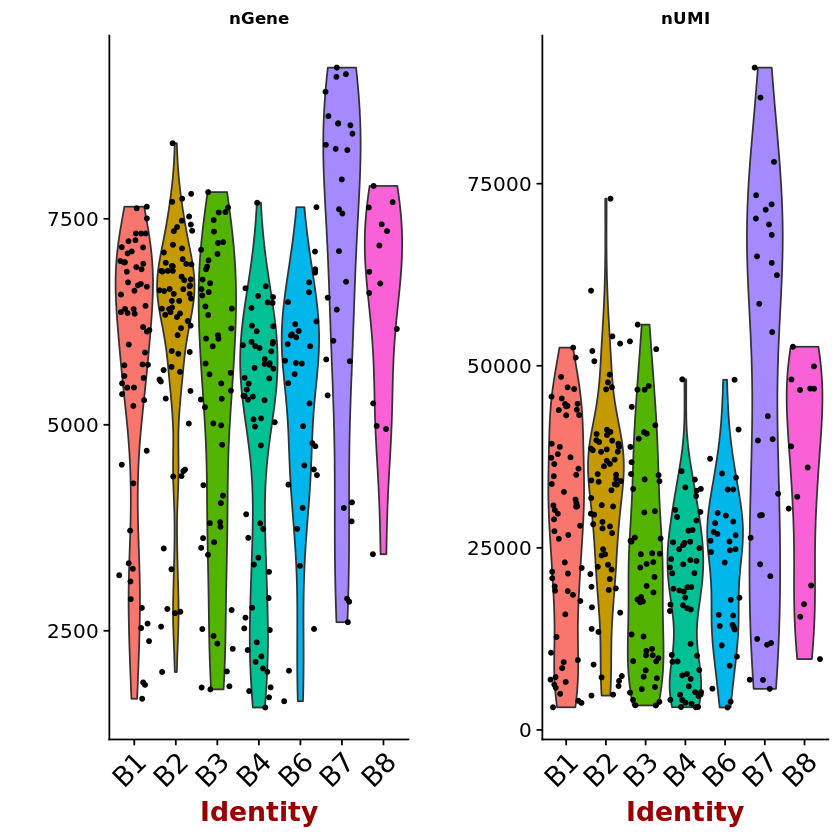

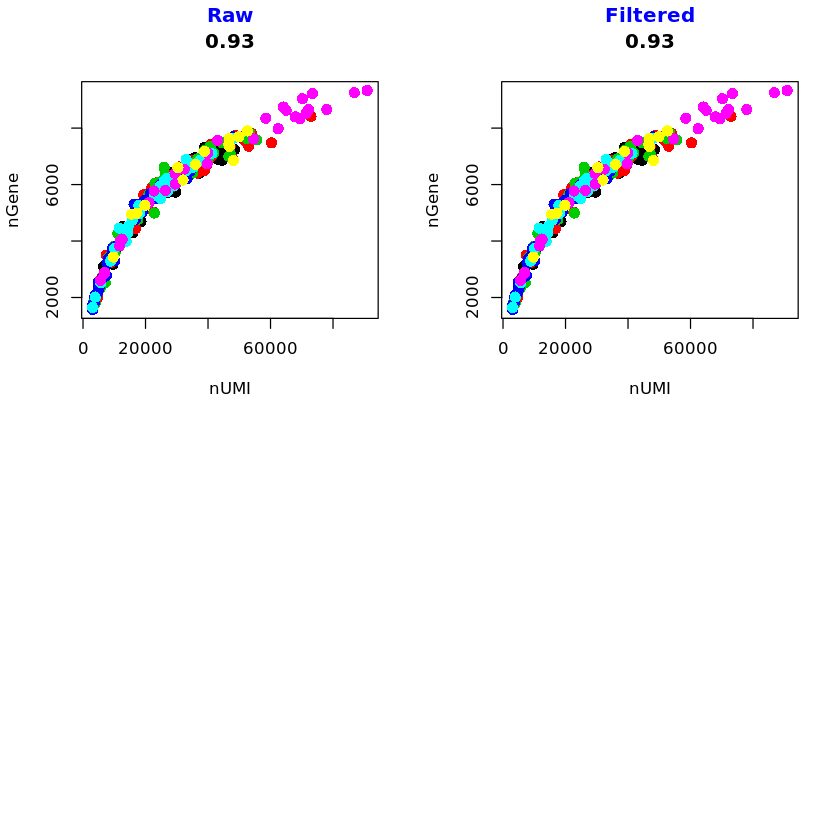

In [10]:
VlnPlot(
    object = seuset_f, 
    features.plot = c("nGene", "nUMI"),
    x.lab.rot = 90,
    use.scaled = FALSE,
    nCol = 2, size.title.use = 10
)
VlnPlot(
    object = seuset_n, 
    features.plot = c("nGene", "nUMI"),
    x.lab.rot = 90,
    #use.imputed = TRUE,
    nCol = 2, size.title.use = 10
)
par(mfrow=c(2,2))
GenePlot(
    object = seuset_f, 
    gene1 = "nUMI", 
    gene2 = "nGene",
    use.raw = F,
) + title("Raw", col.main = 4, line = 3)
GenePlot(
    object = seuset_n, 
    gene1 = "nUMI", 
    gene2 = "nGene",
    use.raw = T,
) + title("Filtered", col.main = 4, line = 3)

## Confounder Removal

We need to scale the data based upon our normalisation and also on any unwanted genes that could affect the analysis

### Find Highly Variable Genes

Number of variable genes: 3452


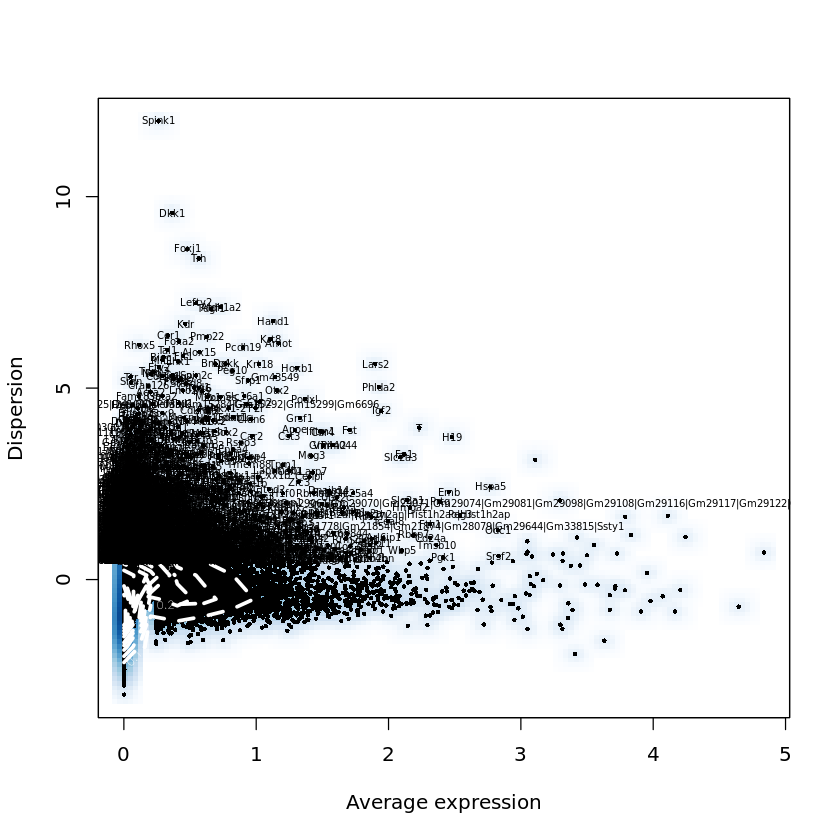

In [156]:
seu_fvg <- FindVariableGenes(
    object = seuset_n,
    mean.function = ExpMean, 
    dispersion.function = LogVMR, 
    x.low.cutoff = 0.0125, 
    x.high.cutoff = 3, 
    y.cutoff = 0.5,
    do.plot = T
)

message("Number of variable genes: ", length(x = seu_fvg@var.genes))

### Scale data based on factors we want to regress

#### Number of UMIs

In [157]:
seu_sd <- ScaleData(
    object = seu_fvg, 
    vars.to.regress = c("nUMI")
)

[1] "Regressing out nUMI"
  |======================================================================| 100%
Time Elapsed:  36.4841561317444 secs
[1] "Scaling data matrix"
  |======================================================================| 100%


In [207]:
#seu_sd@var.genes

#### Cell Cycle Genes

Let us look at the first 9 components of a PCA and print the top 10 genes from each, which may allow us to see genes known for cell variability

In [211]:
seu_pca <- RunPCA(
    object = seu_sd,
    pc.genes = seu_sd@var.genes,
    #pc.genes = c("T","Eomes"),
    do.print = TRUE,
    pcs.print = 1:9,
    genes.print = 10
)

[1] "PC1"
 [1] "Srsf2"  "Srm"    "Rrm2"   "Snhg1"  "H19"    "Odc1"   "Id3"    "Cdk1"  
 [9] "Igf2"   "Tmem88"
[1] ""
 [1] "Dnajb13"       "Fam183b"       "Pifo"          "Cfap126"      
 [5] "1110017D15Rik" "Tppp3"         "Cfap206"       "Cfap44"       
 [9] "Ttc25"         "Rsph4a"       
[1] ""
[1] ""
[1] "PC2"
 [1] "Igf2"    "H19"     "Rbms1"   "Peg10"   "Ppic"    "Slc25a4" "Polg"   
 [8] "Vim"     "Fn1"     "Stard8" 
[1] ""
 [1] "Pim2"     "Sox2"     "Cdh1"     "Pou5f1"   "Zic5"     "Slc7a3"  
 [7] "L1td1"    "Phc1"     "Nipsnap1" "Utf1"    
[1] ""
[1] ""
[1] "PC3"
 [1] "Hoxb1" "Meis2" "Tbx6"  "Fst"   "Dll3"  "Dll1"  "Gas1"  "T"     "Epha4"
[10] "Rbp1" 
[1] ""
 [1] "Podxl"  "Slc2a3" "Cgnl1"  "Car4"   "Cldn6"  "Ddah1"  "Pkp2"   "Krt18" 
 [9] "Etl4"   "Krt8"  
[1] ""
[1] ""
[1] "PC4"
 [1] "Slc2a3"  "Meg3"    "Vangl1"  "Iqgap1"  "B3gnt7"  "Agrn"    "Dst"    
 [8] "Zmynd8"  "Platr15" "Bex1"   
[1] ""
 [1] "Foxc2"  "Rps27l" "Twist1" "Crabp1" "Irx1"   "Foxc1"  "Tmsb10" "Ifitm1"
 [9] "Co

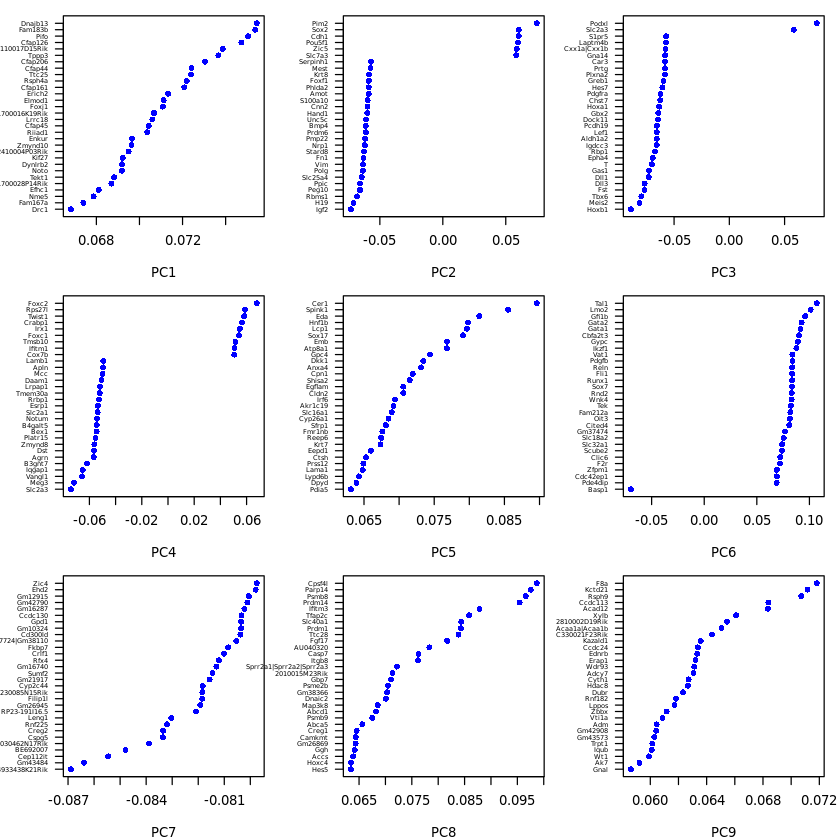

In [205]:
par(mar=c(4,4,1,1))
VizPCA(object = seu_pca, pcs.use = 1:9)

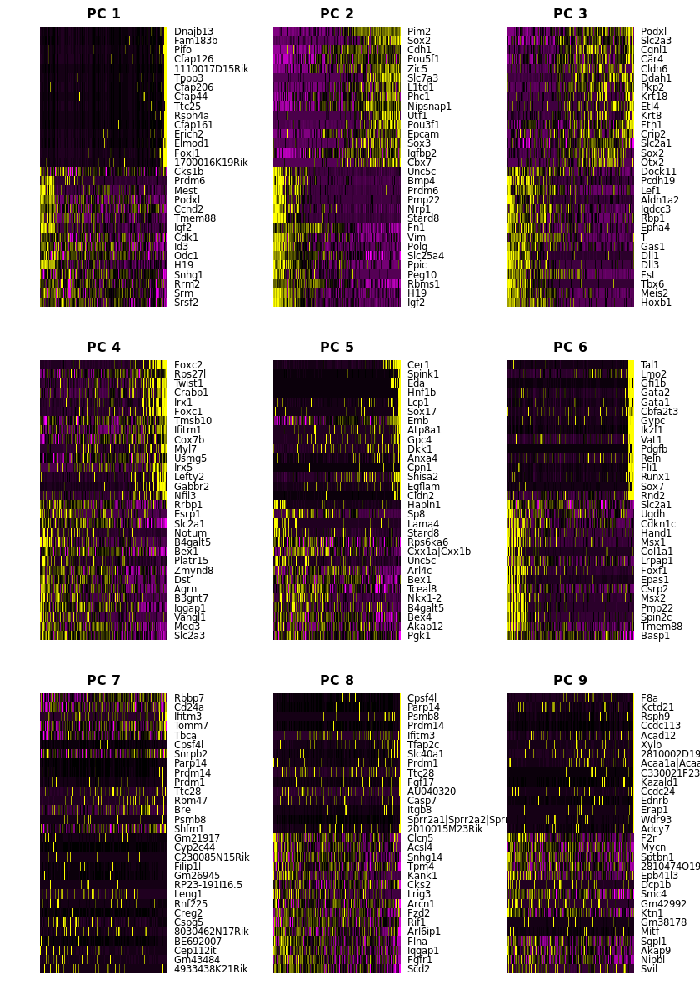

In [245]:
#layout(matrix(c(1,2,3), ncol=1), heights=c(0.5,))
options(repr.plot.height=10)
PCHeatmap(
    object = seu_pca, 
    pc.use = 1:9,
    #cells.use = 200, 
    do.balanced = TRUE, 
    label.columns = FALSE,
    use.full = FALSE,
)
options(repr.plot.height=NULL)

In [277]:
data(cc.genes)  # Load list of CC genes -- Provides: s.genes, g2m.genes

ccs <- CellCycleScoring(
    object = seu_pca, 
    s.genes = cc.genes$s.genes, 
    g2m.genes = cc.genes$g2m.genes, 
    set.ident = T
)

Warning message in AddModuleScore(object = object, genes.list = genes.list, enrich.name = enrich.name, :
“Could not find enough genes in the object from the following gene lists: S.Score Attempting to match case...Could not find enough genes in the object from the following gene lists: G2M.Score Attempting to match case...”

,nGene,nUMI,orig.ident,S.Score,G2M.Score,Phase,old.ident
SAE725FACS1_1_1,4685,18583.45,SAE725FACS1,0.10492615,-0.27563602,S,SAE725FACS1
SAE725FACS1_1_2,6709,36583.07,SAE725FACS1,0.12888174,-0.04405302,S,SAE725FACS1
SAE725FACS1_1_3,6348,32748.76,SAE725FACS1,-0.20874737,0.14750793,G2M,SAE725FACS1
SAE725FACS1_1_4,6404,37443.39,SAE725FACS1,0.03477357,-0.02710555,S,SAE725FACS1
SAE725FACS1_1_6,5592,23045.96,SAE725FACS1,-0.22177744,0.30568984,G2M,SAE725FACS1
SAE725FACS1_1_10,6581,31688.82,SAE725FACS1,0.14016118,-0.21572341,S,SAE725FACS1


Picking joint bandwidth of 0.186
Picking joint bandwidth of 0.0161
Picking joint bandwidth of 0.174
Picking joint bandwidth of 0.502
Picking joint bandwidth of 0.159
Picking joint bandwidth of 5.27e-06


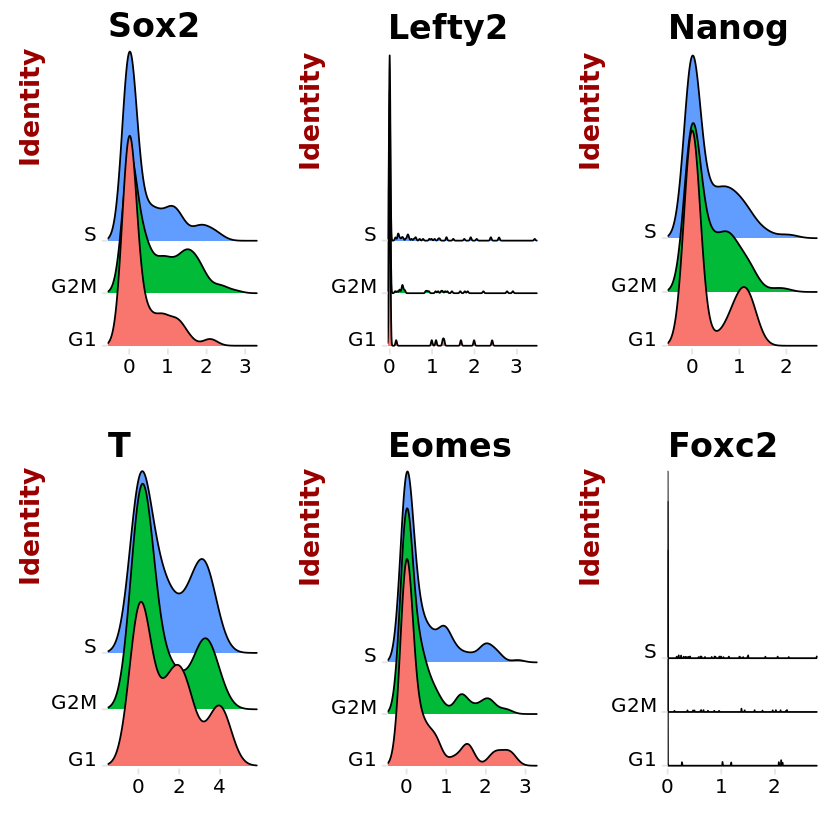

In [278]:
head(x = ccs@meta.data)

RidgePlot(
    object = ccs, 
    features.plot = c("Sox2", "Lefty2", "Nanog", "T", "Eomes", "Foxc2"),
    nCol = 3
)

[1] "PC1"
 [1] "Srsf2"  "Srm"    "Rrm2"   "Snhg1"  "H19"    "Odc1"   "Id3"    "Cdk1"  
 [9] "Igf2"   "Tmem88" "Ccnd2"  "Podxl"  "Mest"   "Prdm6"  "Cks1b"  "Tubb6" 
[17] "Igfbp4" "Slc6a6" "Pcgf5"  "Dut"    "Polg"   "Stard8" "Frmd6"  "Hand1" 
[25] "Wdr12"  "Phlda2" "Tbx20"  "Snhg5"  "Dusp9"  "Morc4" 
[1] ""
 [1] "Dnajb13"       "Fam183b"       "Pifo"          "Cfap126"      
 [5] "1110017D15Rik" "Tppp3"         "Cfap206"       "Cfap44"       
 [9] "Ttc25"         "Rsph4a"        "Cfap161"       "Erich2"       
[13] "Elmod1"        "Foxj1"         "1700016K19Rik" "Lrrc18"       
[17] "Cfap45"        "Riiad1"        "Enkur"         "Zmynd10"      
[21] "2410004P03Rik" "Kif27"         "Dynlrb2"       "Noto"         
[25] "Tekt1"         "1700028P14Rik" "Efhc1"         "Nme5"         
[29] "Fam167a"       "Drc1"         
[1] ""
[1] ""
[1] "PC2"
 [1] "Igf2"     "H19"      "Rbms1"    "Peg10"    "Ppic"     "Slc25a4" 
 [7] "Polg"     "Vim"      "Fn1"      "Stard8"   "Nrp1"     "Pmp22"   
[13] "P

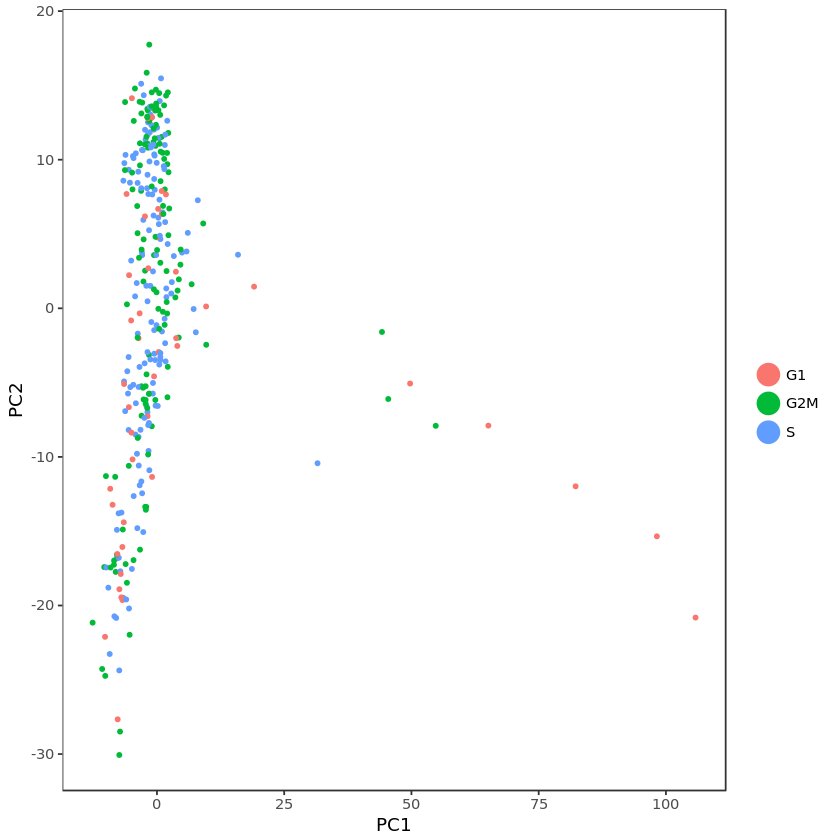

In [279]:
ccs <- RunPCA(object = ccs)
PCAPlot(object = ccs)

# does not plot...

In [280]:
ccs <- ScaleData(object = ccs, vars.to.regress = c("S.Score", "G2M.Score"))

[1] "Regressing out S.Score"   "Regressing out G2M.Score"
  |======================================================================| 100%
Time Elapsed:  38.9137895107269 secs
[1] "Scaling data matrix"
  |======================================================================| 100%


[1] "PC1"
 [1] "H19"     "Igf2"    "Prdm6"   "Stard8"  "Polg"    "Ppic"    "Nrp1"   
 [8] "Pmp22"   "Unc5c"   "Mest"    "S100a10" "Hand1"   "Tbx20"   "Frmd6"  
[15] "Bmp4"    "Gata6"   "Spin2c"  "Vim"     "Rbms1"   "Morc4"   "Phlda2" 
[22] "Foxf1"   "Adgra2"  "Cnn2"    "Igfbp4"  "Capn6"   "Dusp9"   "Msx2"   
[29] "Peg10"   "Pcgf5"  
[1] ""
 [1] "Pifo"          "Dnajb13"       "Fam183b"       "Cfap126"      
 [5] "1110017D15Rik" "Cfap44"        "Tppp3"         "Cfap206"      
 [9] "Ttc25"         "Rsph4a"        "Cfap161"       "Elmod1"       
[13] "Foxj1"         "Noto"          "Lrrc18"        "Dynlrb2"      
[17] "Riiad1"        "1700016K19Rik" "Erich2"        "Cfap45"       
[21] "2410004P03Rik" "Kif27"         "Zmynd10"       "Nme5"         
[25] "Tekt1"         "Efhc1"         "1700028P14Rik" "Enkur"        
[29] "Fam167a"       "Cfap54"       
[1] ""
[1] ""
[1] "PC2"
 [1] "Pim2"          "Sox2"          "Slc7a3"        "Utf1"         
 [5] "Otx2"          "Cbx7"          "1700019

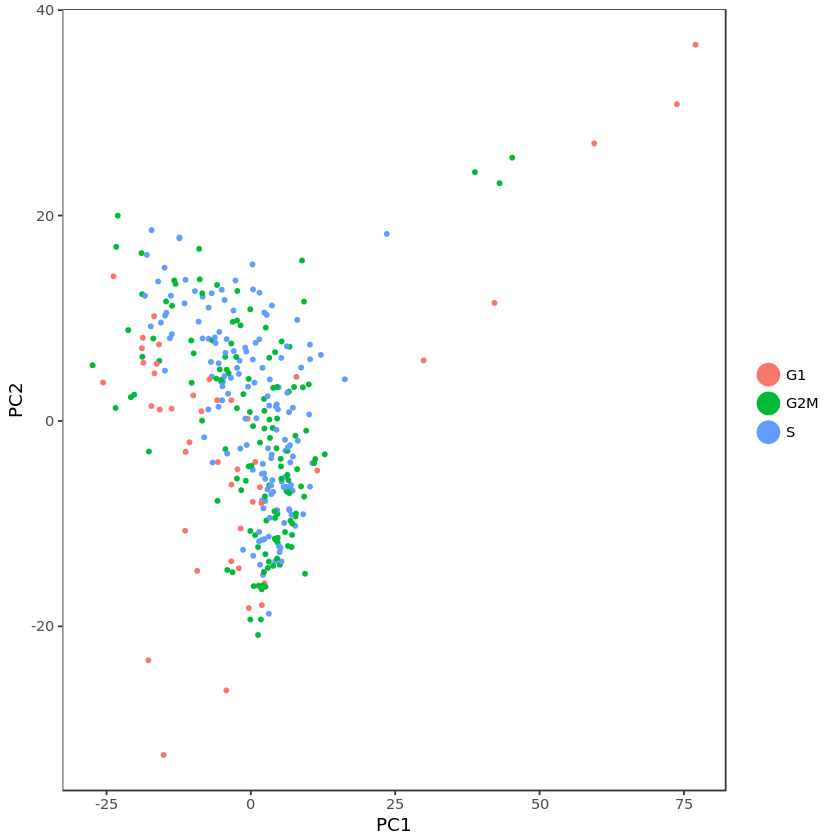

In [281]:
ccs <- RunPCA(object = ccs)
PCAPlot(ccs)

Picking joint bandwidth of 0.186
Picking joint bandwidth of 0.0161
Picking joint bandwidth of 0.174
Picking joint bandwidth of 0.502
Picking joint bandwidth of 0.159
Picking joint bandwidth of 5.27e-06


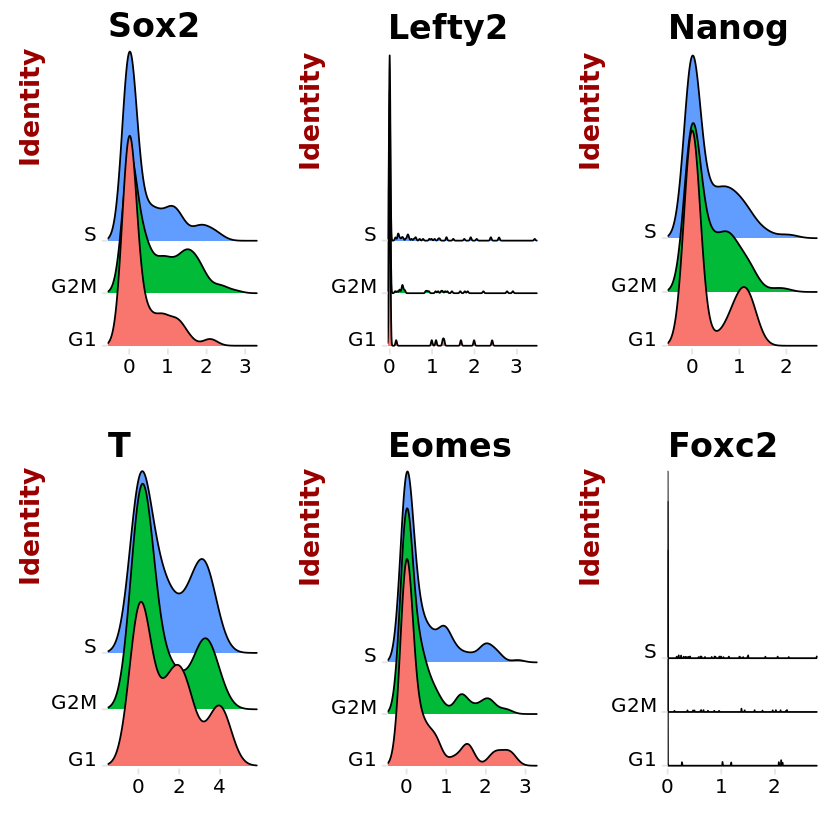

In [282]:
RidgePlot(
    object = ccs, 
    features.plot = c("Sox2", "Lefty2", "Nanog", "T", "Eomes", "Foxc2"),
    nCol = 3
)

No real noticeable effect upon the data, and the initial PCA did not show must clustering due to this cell-cycle variability.

## Detecting Statistically Significant PCs

We will do Jack Straw plot that compares the distribution of p-values for each PC against a uniform distribution (dashed).

In [283]:
seu_js <- JackStraw(
    object = ccs,
    num.replicate = 100, 
)

  |======================================================================| 100%
Time Elapsed:  1.2527069568634 mins 



Warning message:
“Removed 22152 rows containing missing values (geom_point).”

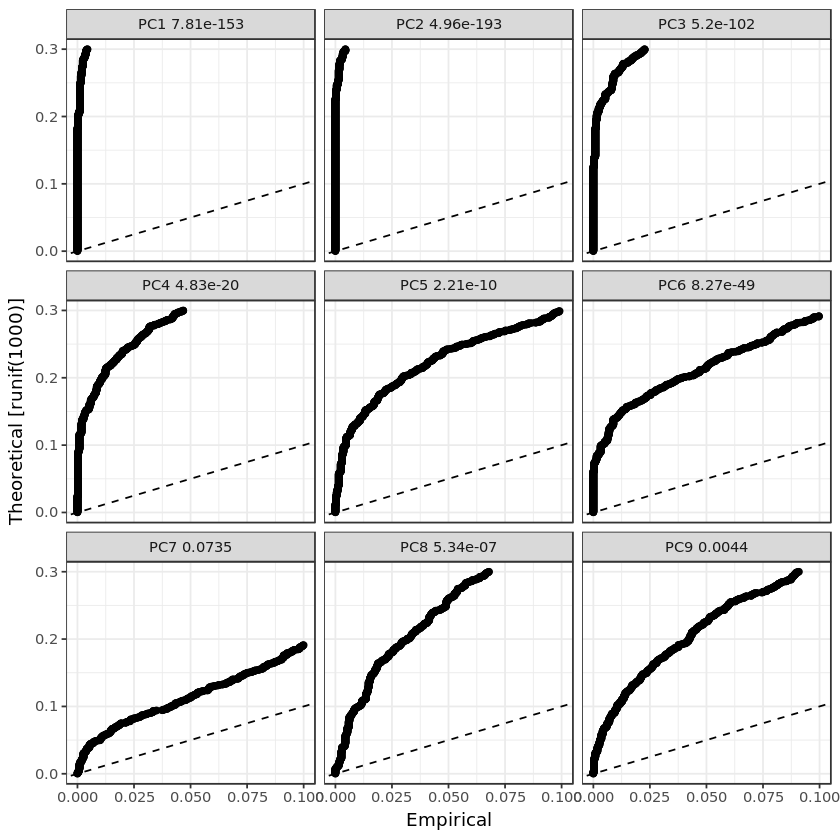

In [290]:
par(mfrow=c(2,1))
JackStrawPlot(object = seu_js, PCs = 1:9)

Here we can see that PCs 1, 2, 3 are very significant and PC 6 might also have some useful biological signal.

We can get a better estimate of PCs to use for our analysis by looking at an Elbow plot which shows the stdev in the PCs.

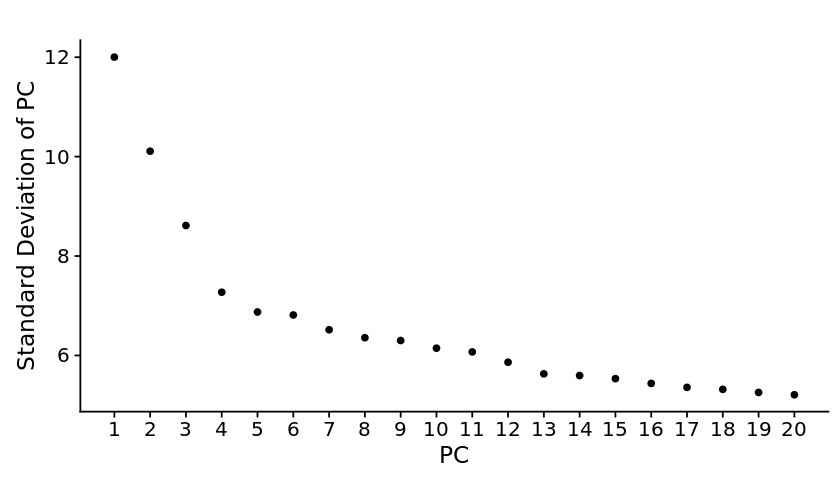

In [302]:
options(repr.plot.height=4)
PCElbowPlot(object = seu_js, num.pc = 20) + scale_x_continuous(breaks = seq(1, 20, by = 1))

From here we can see that the elbow is around the PC 4 - 6 range.

### Look for clusters using progressive PC ranges (1:2, 1:3, 1:4, etc.)

In [304]:
limrange=2:6

seu_filts <- list()
tab_filts <- list()

for (lim in limrange){
    seu_filts[[lim]] <- FindClusters(
        object = seu_js, 
        reduction.type = "pca", 
        dims.use = 1:lim, 
        resolution = 1.0, 
        print.output = 0, 
        save.SNN = TRUE
    )
    print(lim)
}

for (lim in limrange){
    seu <- seu_filts[[lim]]
    tab_filts[[lim]] <- table(seu@ident)
}


[1] 2
[1] 3
[1] 4
[1] 5
[1] 6


In [312]:
tab <- rbind(
    rbind(lapply(tab_filts, function(x) length(names(x)))),
    rbind(tab_filts)
)
          
colnames(tab) <- lapply(c(1,limrange), function(x) paste("1:", x, sep=""))
rownames(tab) <- c("Num. of clusts", "Freq. clusters")
t(tab)

,Num. of clusts,Freq. clusters
1:1,0,NULL
1:2,5,"76, 75, 63, 59, 53"
1:3,4,"98, 97, 80, 51"
1:4,4,"105, 86, 83, 52"
1:5,4,"105, 85, 78, 58"
1:6,4,"106, 87, 75, 58"


If we consider the first two PCs we get 5 ~ even clusters. For higher PC considerations the number of clusters drops to 4 with relatively good stability in numbers of cells within clusters.

In [313]:
generateTSNEs <- function(){
    seu_tsnes <- list()

    for (lim in limrange){
        seu <- seu_filts[[lim]]
        seu_tsnes[[lim]] <- RunTSNE(
            object = seu,
            dims.use = 1:lim,
            do.fast = TRUE
        )
    }
    return(seu_tsnes)
}

In [314]:
tsnes_dim <- generateTSNEs()

## Examining Clusters

### Checkpoint, save or load

In [315]:
save_sets <- TRUE

names_seu <- "seu_filts.4.rds"
names_tab <- "tab_filts.4.rds"
names_tsn <- "tsnes_dim.4.rds"

if (save_sets){
    # Save here and checkpoint
    saveRDS(seu_filts, names_seu)
    saveRDS(tab_filts, names_tab)
    saveRDS(tsnes_dim, names_tsn)
} else {
    # Or reload
    packages <- c("Seurat", "dplyr")
    zzz<-lapply(packages, function(xxx) 
        suppressMessages(require(xxx, character.only = TRUE,quietly=TRUE,warn.conflicts = T))
    )
    seu_filts <- readRDS(names_seu)
    tab_filts <- readRDS(names_tab)
    tsnes_dim <- readRDS(names_tsn)
}

### TSNE Plots for different Dim ranges

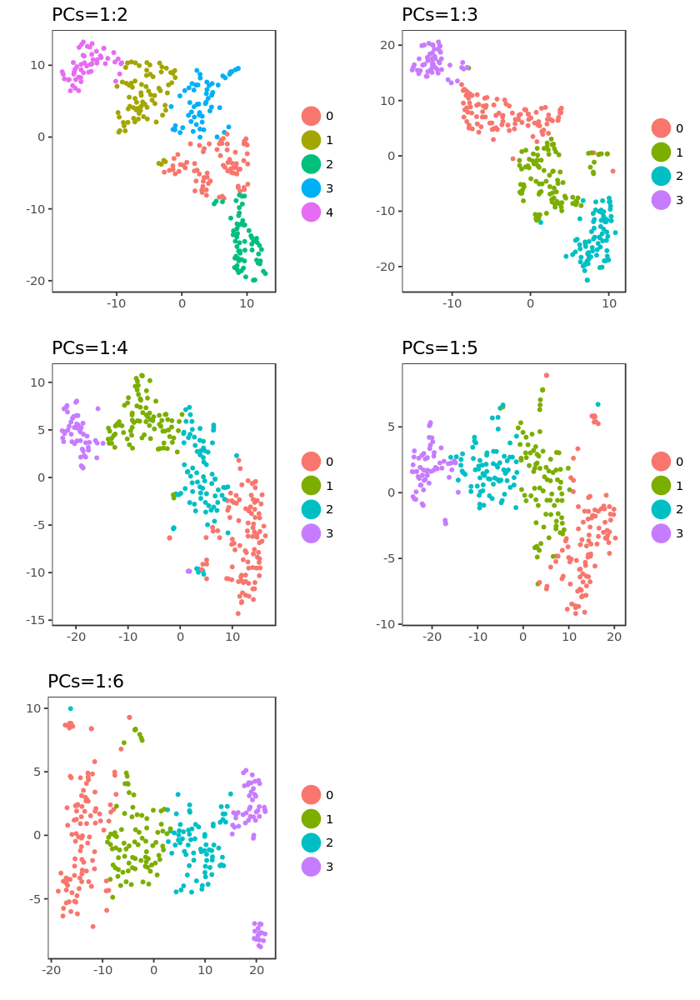

In [318]:
printInteresting <- function(seu_list, range){

    multiplot(plotlist = (
        lapply(range, function(x){
            seu <- seu_list[[x]]
            return(TSNEPlot(
                object = seu, 
                do.return = T,
                label.size = 0.1
            ) + ggtitle(paste("PCs=1:",x, sep="")) + xlab("") + ylab(""))
        })
    ), cols=2
    )
}

options(repr.plot.height=10)
printInteresting(tsnes_dim, 2:6)
#printInteresting(tsnes_dim, 6:9)
#printInteresting(tsnes_dim, c(10,NULL))

PC 1:2 easily looks the best with very few outliers seen in other clusters, but we will still consider the heatmaps for all PC ranges.

### HeatMaps for different Dim ranges

In [ ]:
marker_list <- list()

for (lim in limrange){
    marker_list[[lim]] <- FindAllMarkers(
        object = tsnes_dim[[lim]], 
        only.pos = TRUE, 
        min.pct = 0.25, 
        thresh.use = 0.25
    )
}

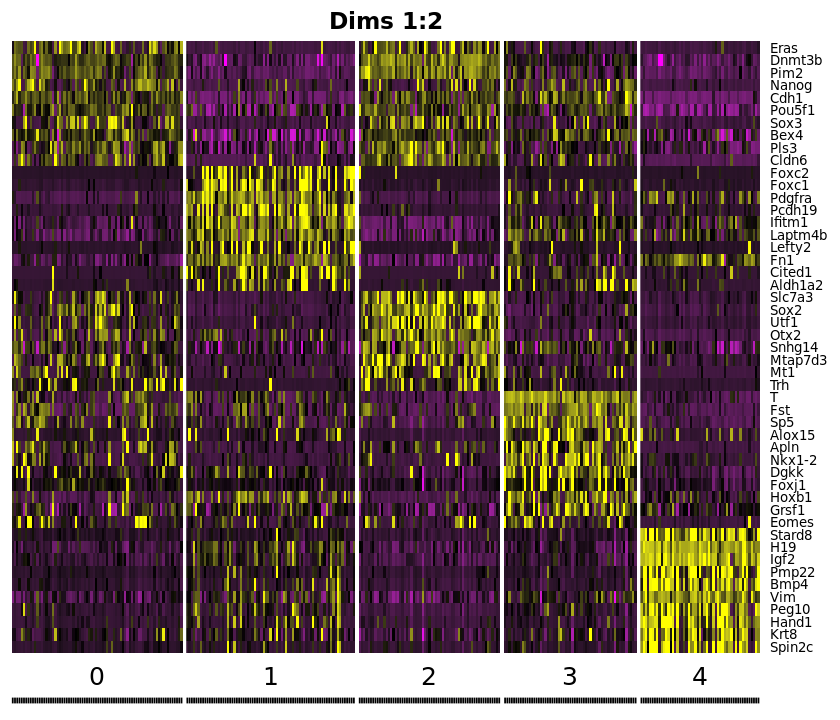

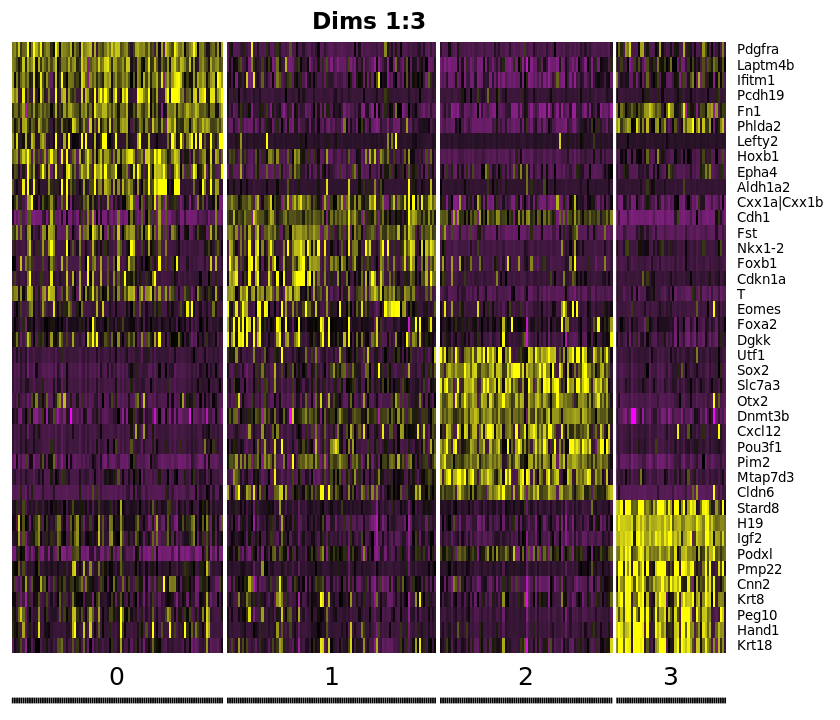

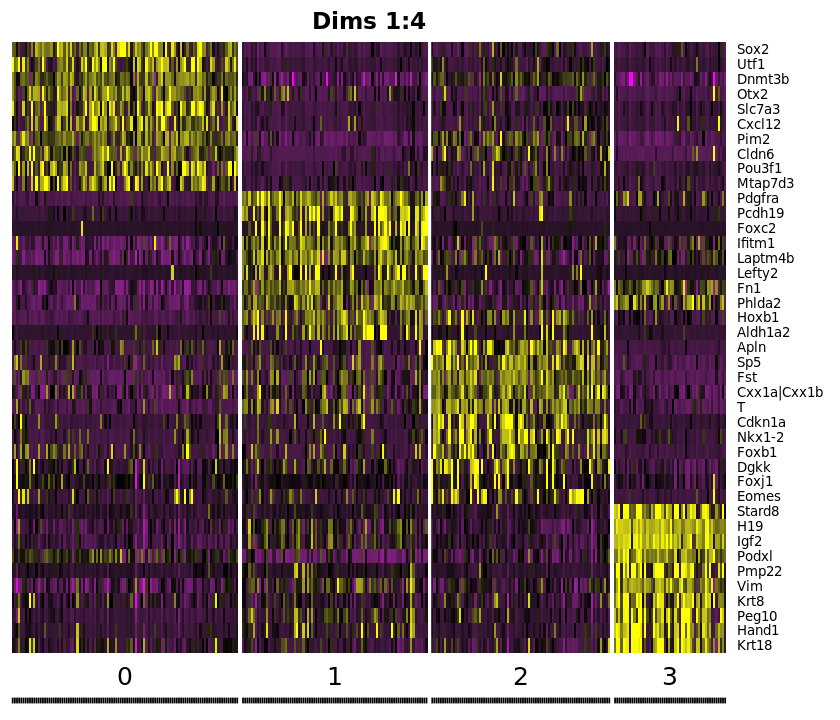

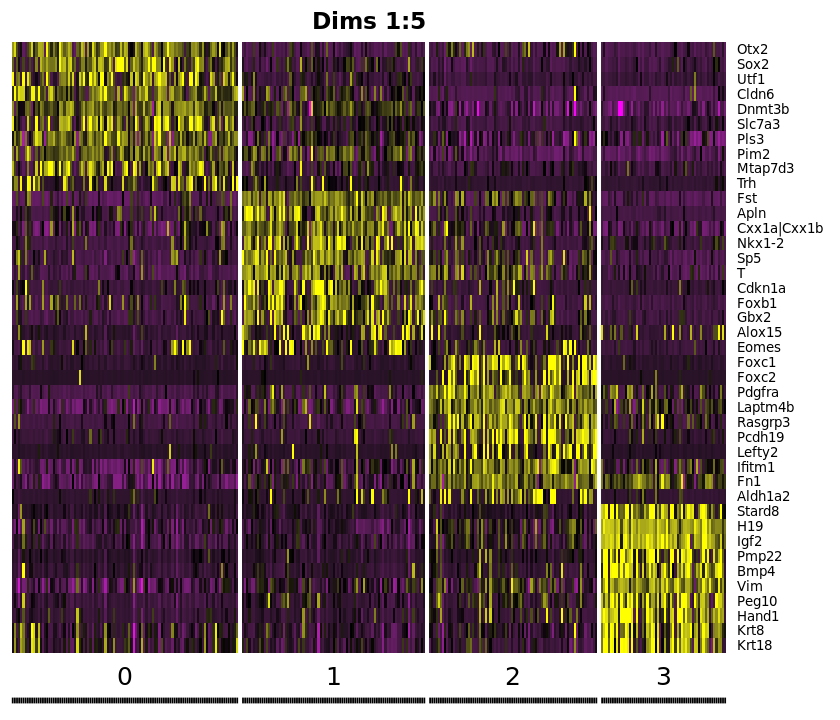

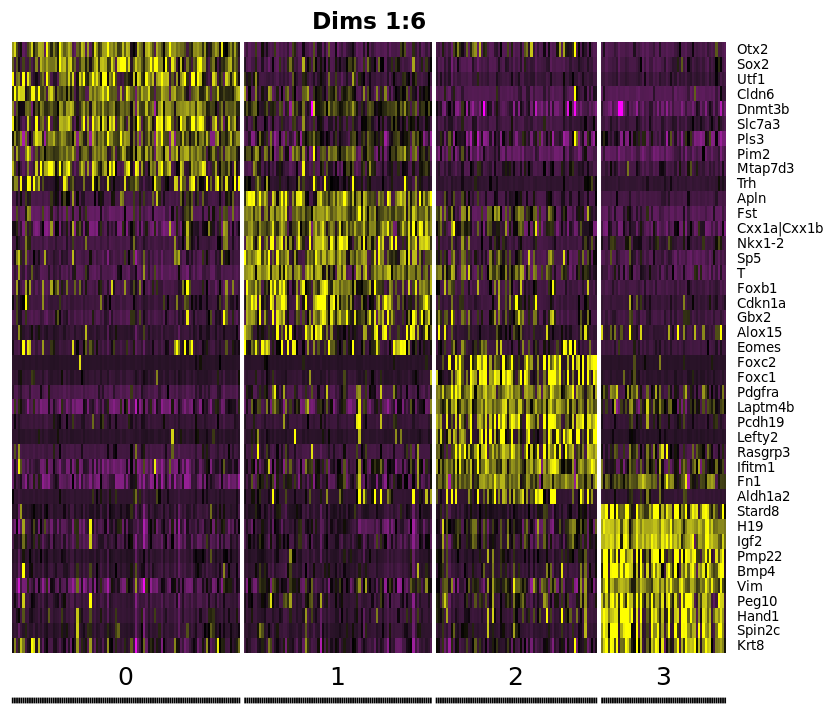

In [403]:
options(repr.plot.height=6)
for (lim in limrange){
    def <- marker_list[[lim]]
    #top10 <- markers %>% group_by(cluster) %>% top_n(10, avg_logFC)
    
    top10_with <- rbind(
       (def %>% group_by(cluster) %>% top_n(10, avg_logFC)),
        def %>% group_by(cluster) %>% filter(gene == "Eomes")
    ) %>% arrange(cluster)
    
    print(DoHeatmap(
        object = tsnes_dim[[lim]], 
        genes.use = top10_with$gene,
        remove.key = TRUE,
        title = paste("Dims 1:", lim, sep=""),
        cex.col = 0,
        cex.row = 8
    ))
}


T and Eomes always seem to appear in the same cluster, which is good(?) but Eomes seems to be weak in most PCs except PC1:3.

PC1:2 looks noisy, with lots of genes appearing in other clusters. PCs1:3 and so on give more distinct profiles.

#### Dim1:2

Cluster 0

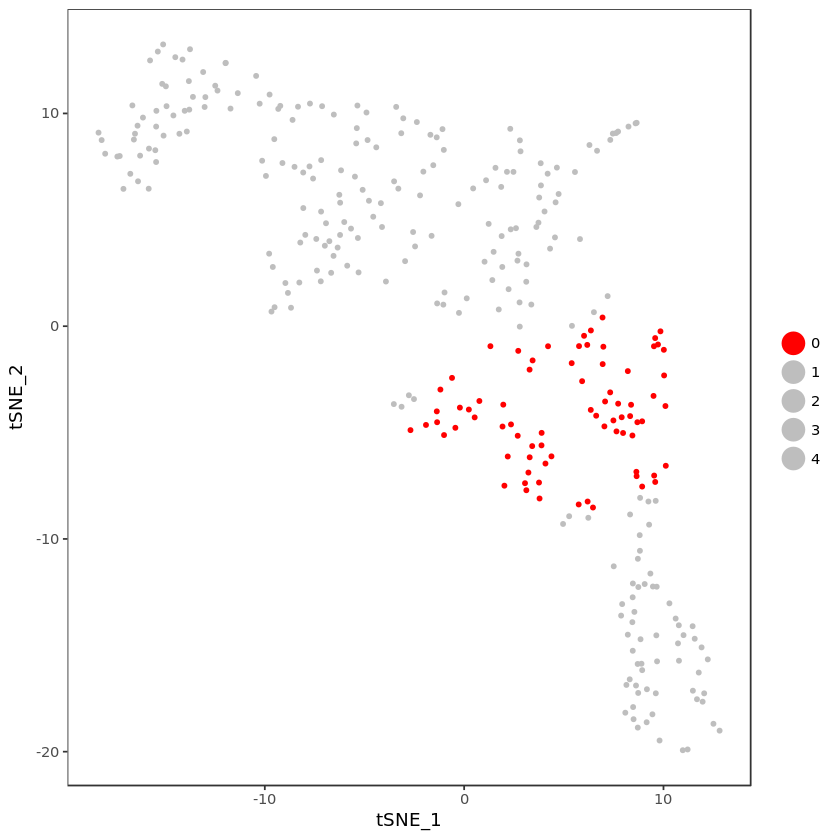

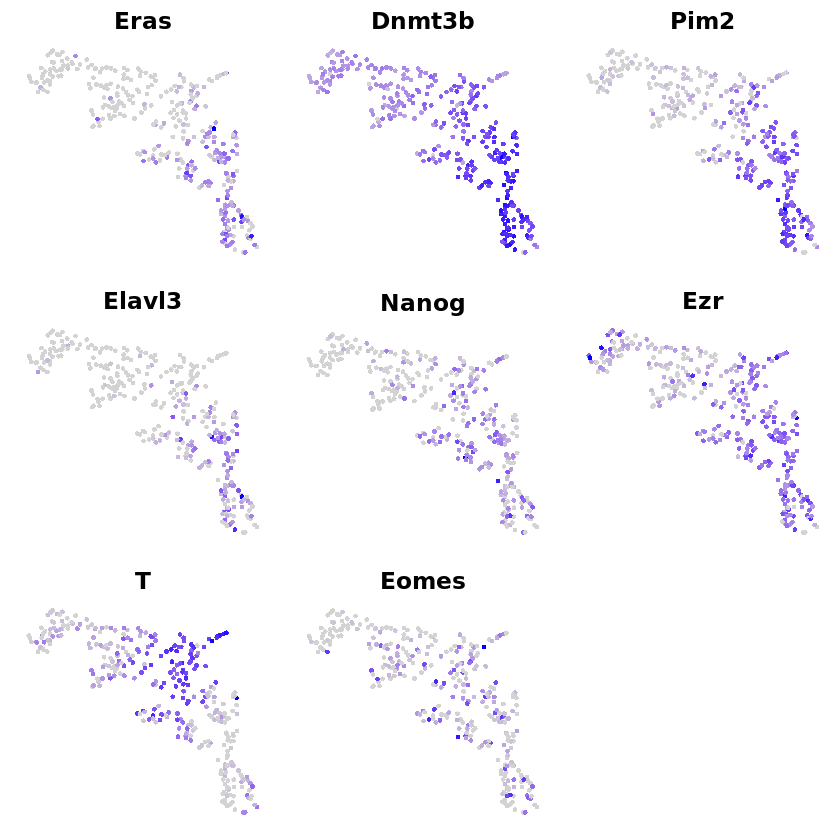

Cluster 1

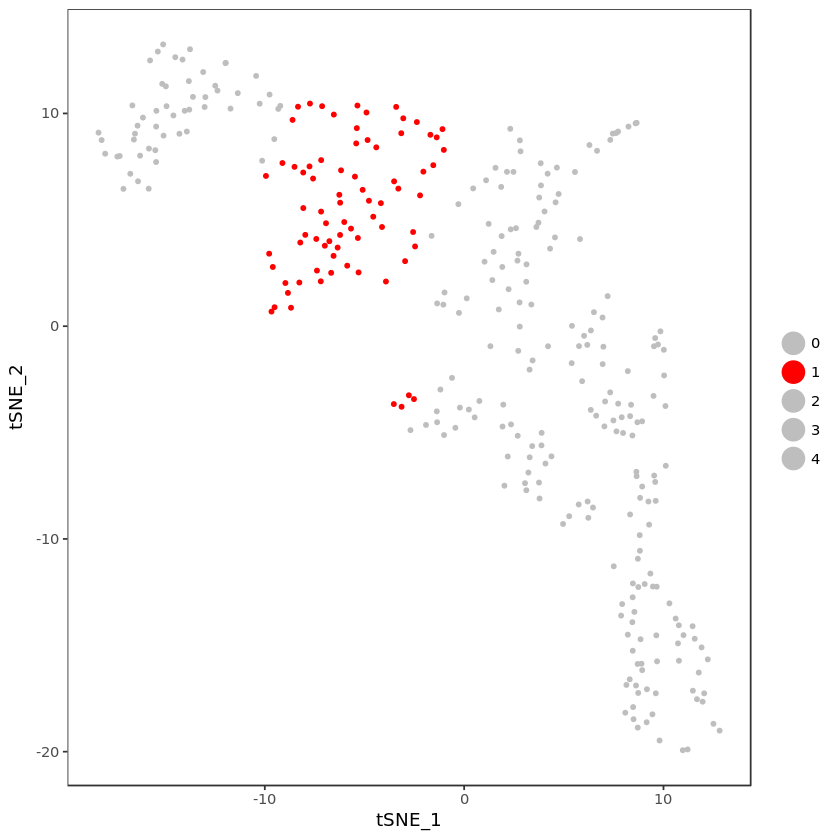

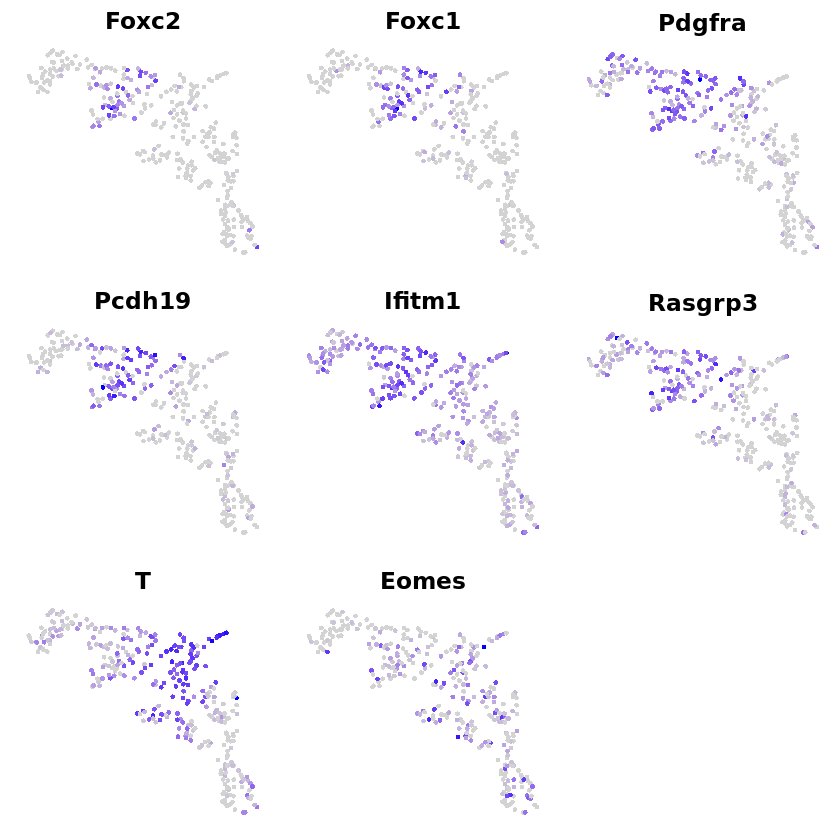

In [476]:
exploreDimRange(2)

#### Dim1:3

Cluster 0

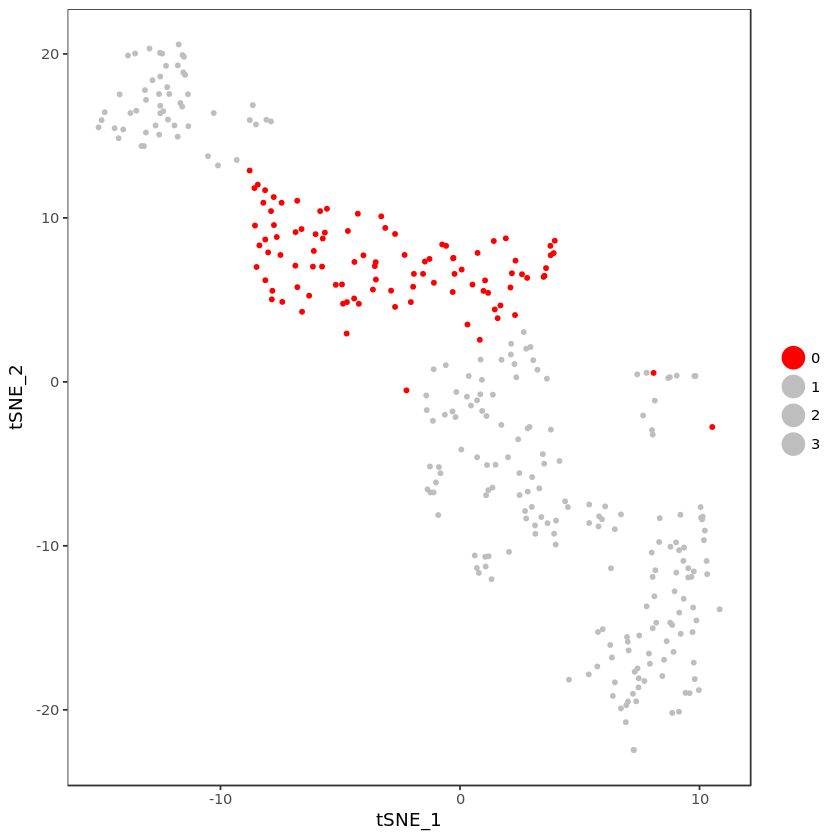

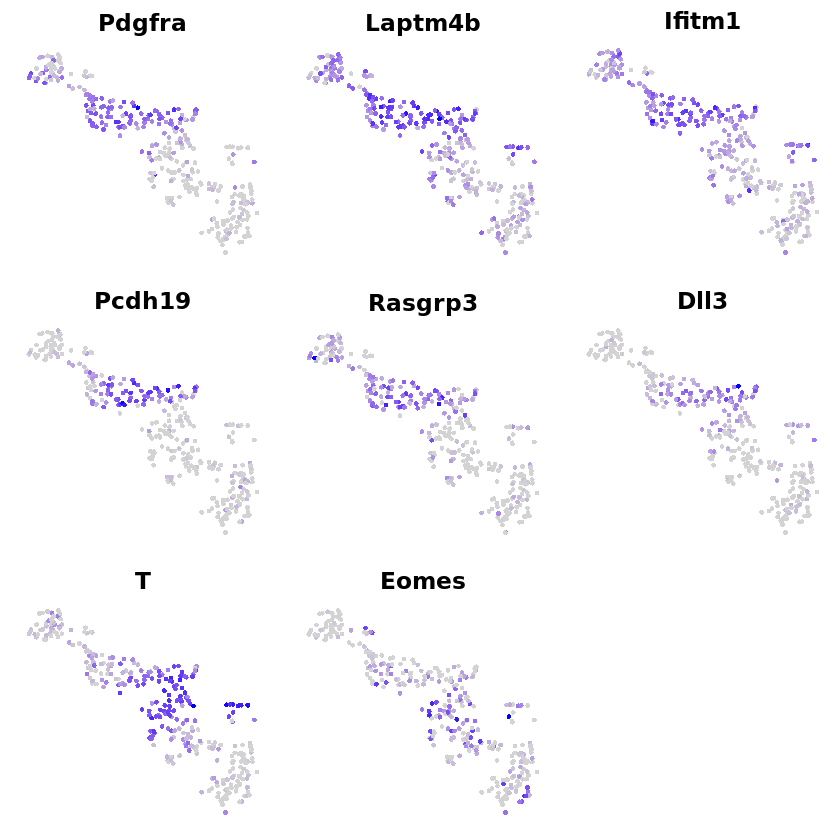

Cluster 1

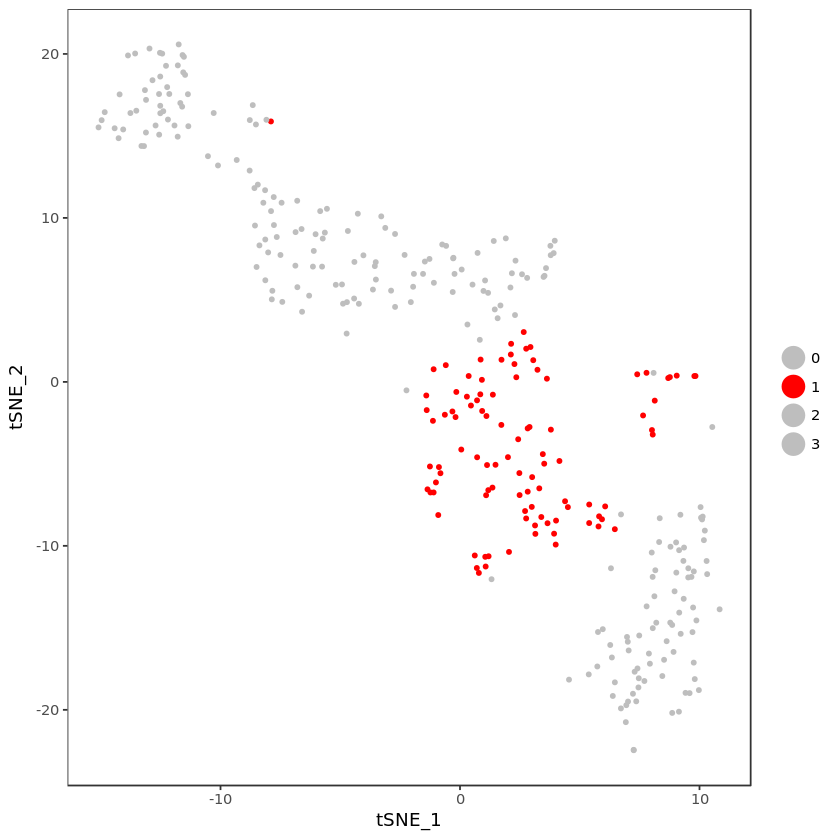

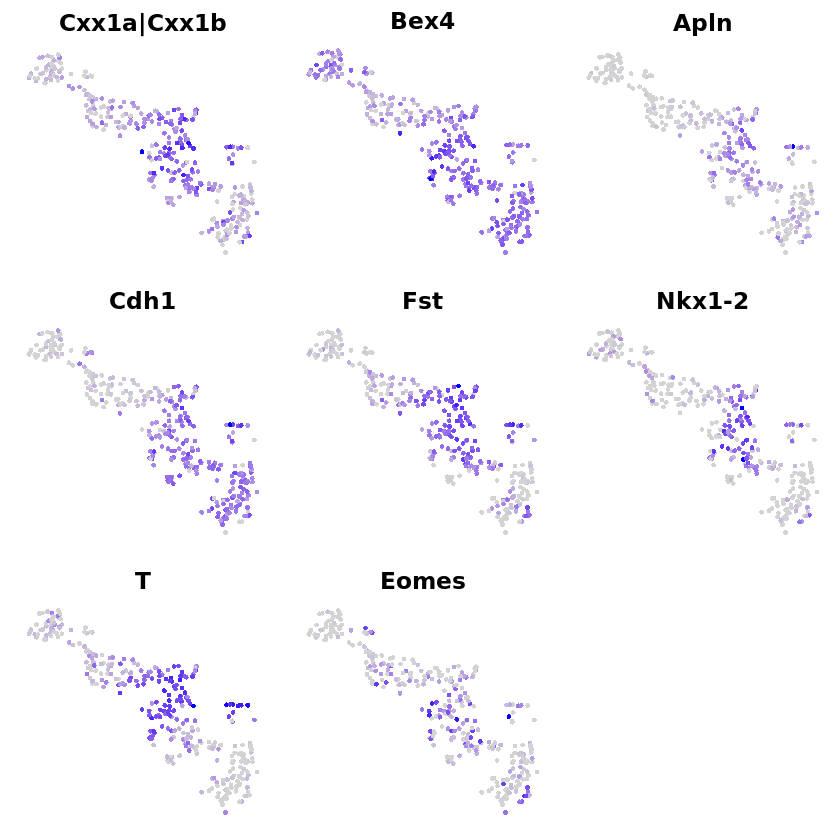

In [477]:
exploreDimRange(3)

#### Dim1:4

Cluster 0

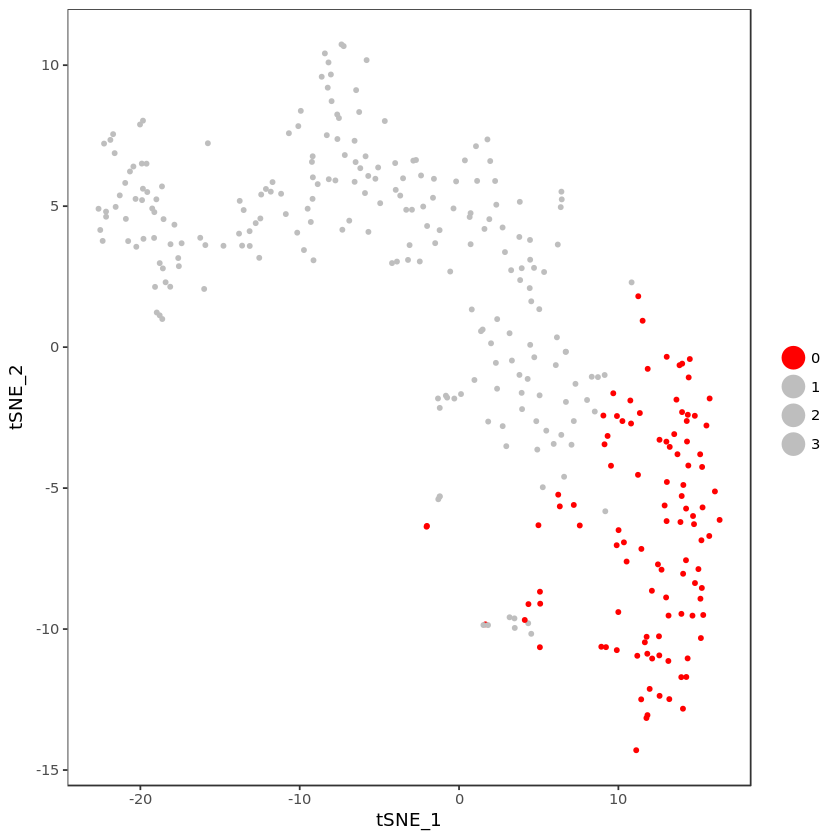

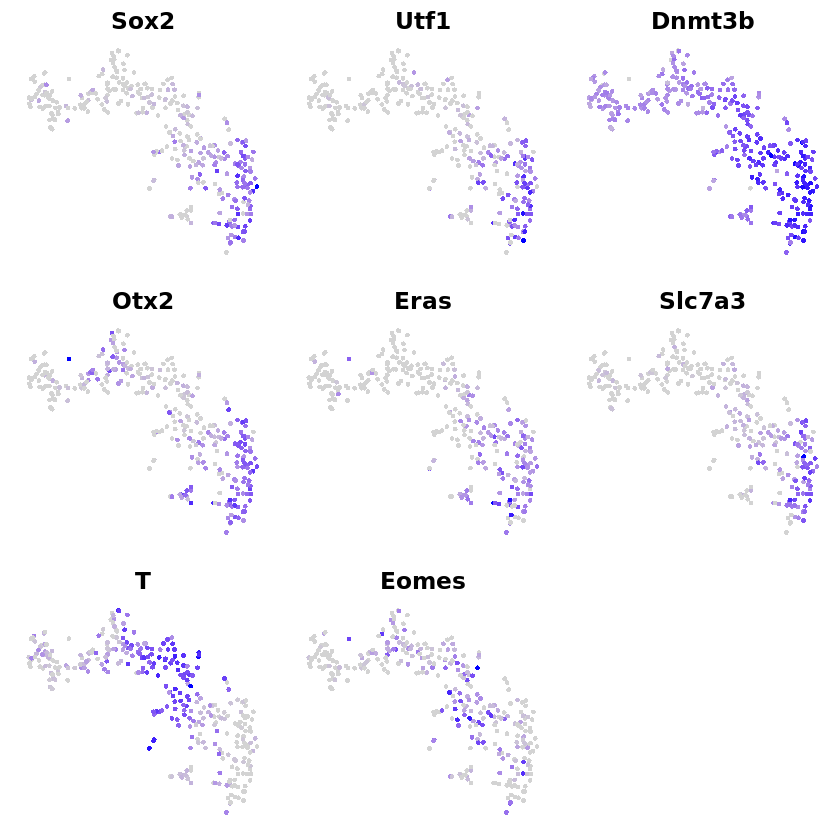

Cluster 1

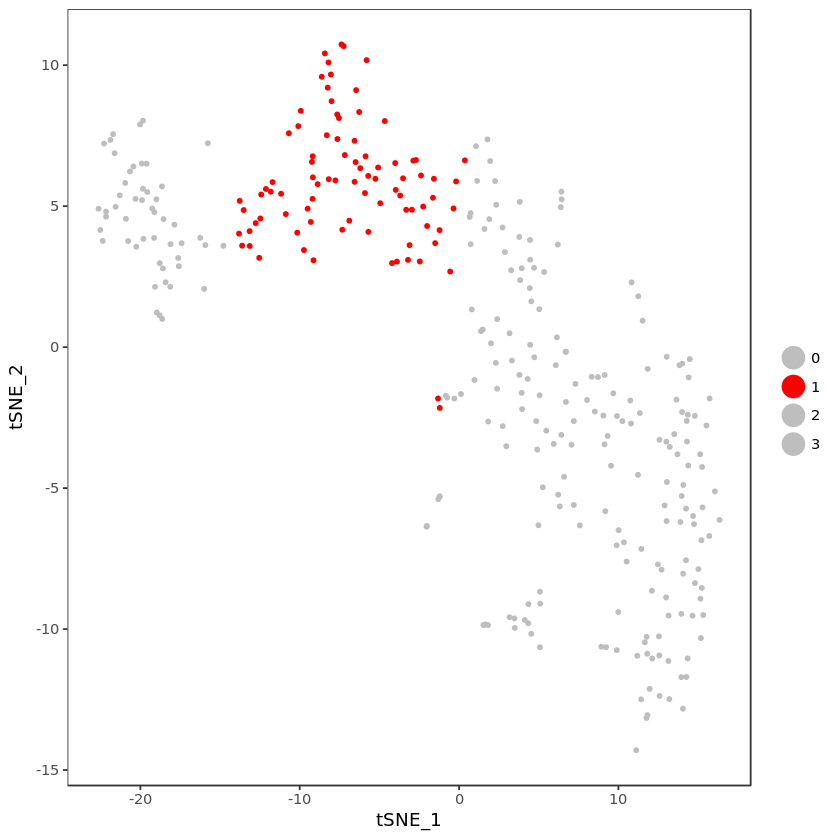

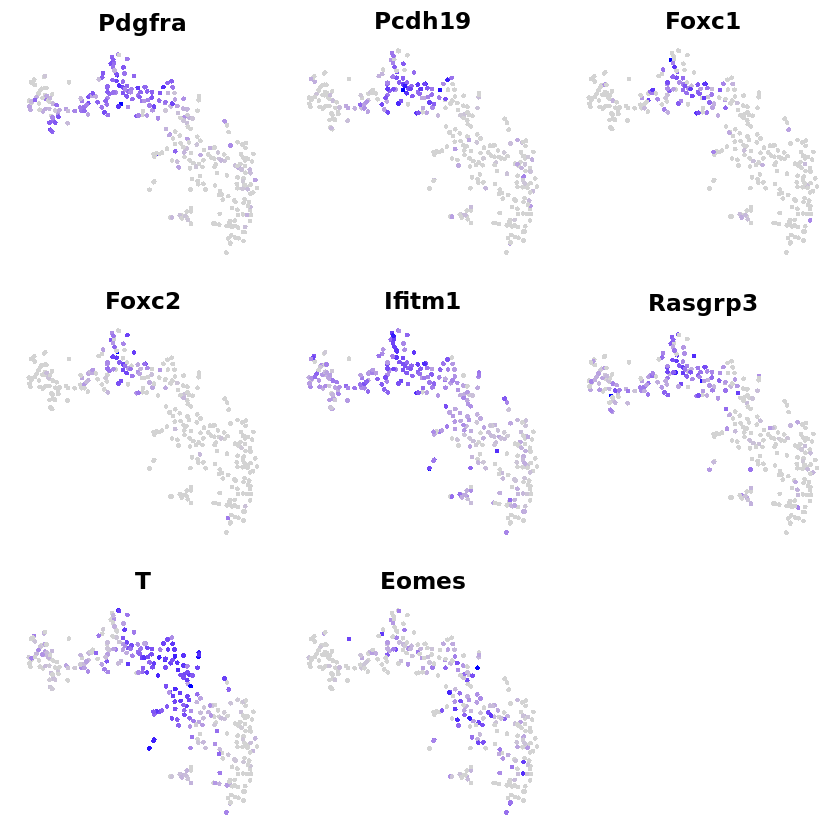

In [478]:
exploreDimRange(4)

#### Dim1:5

Cluster 0

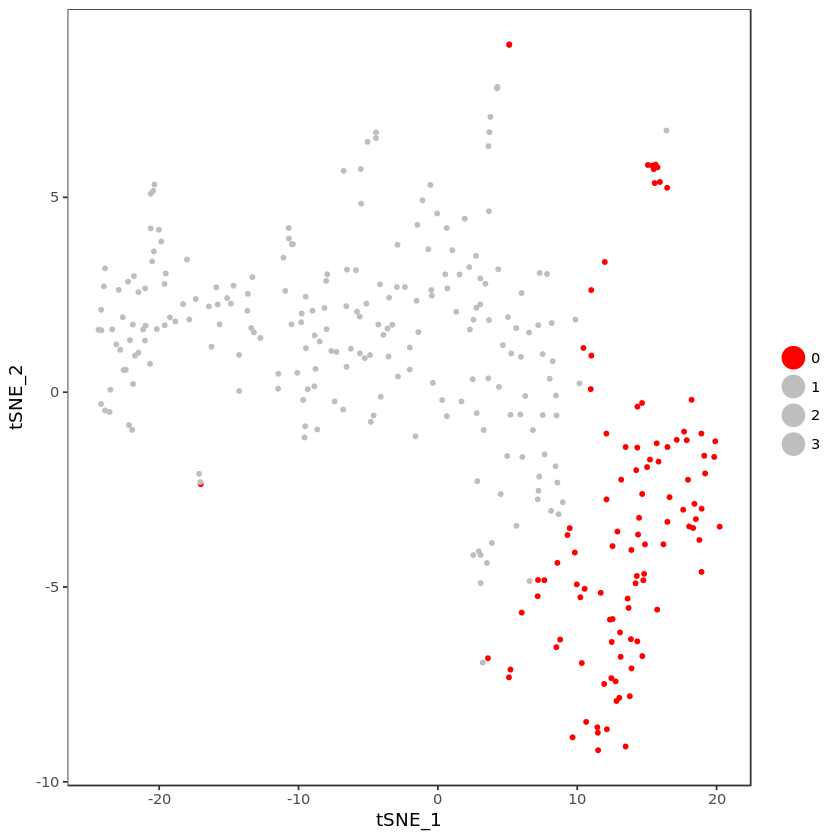

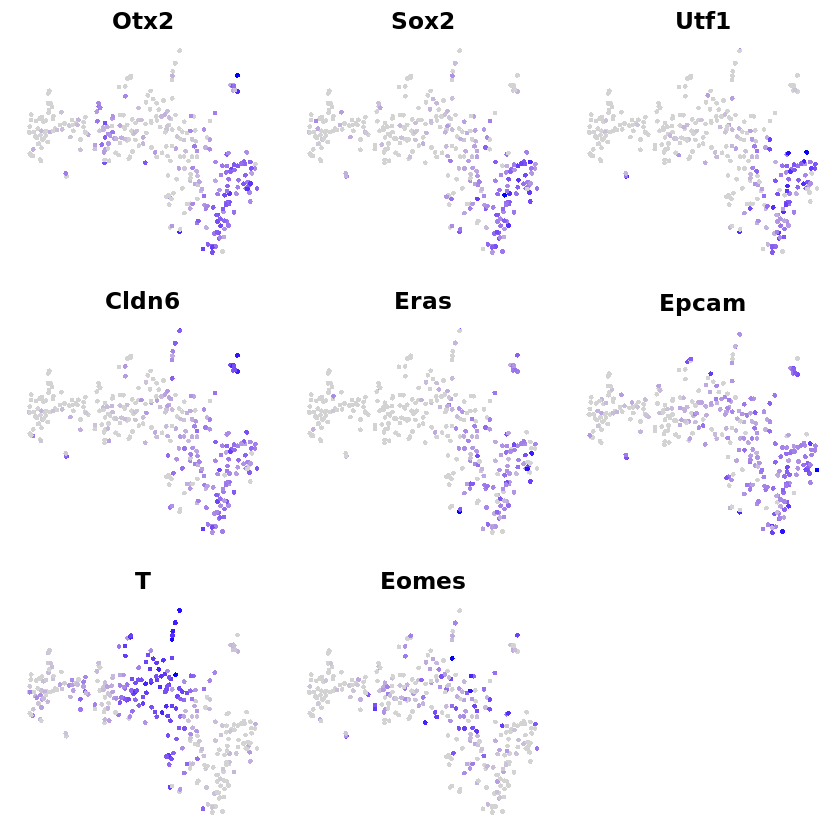

Cluster 1

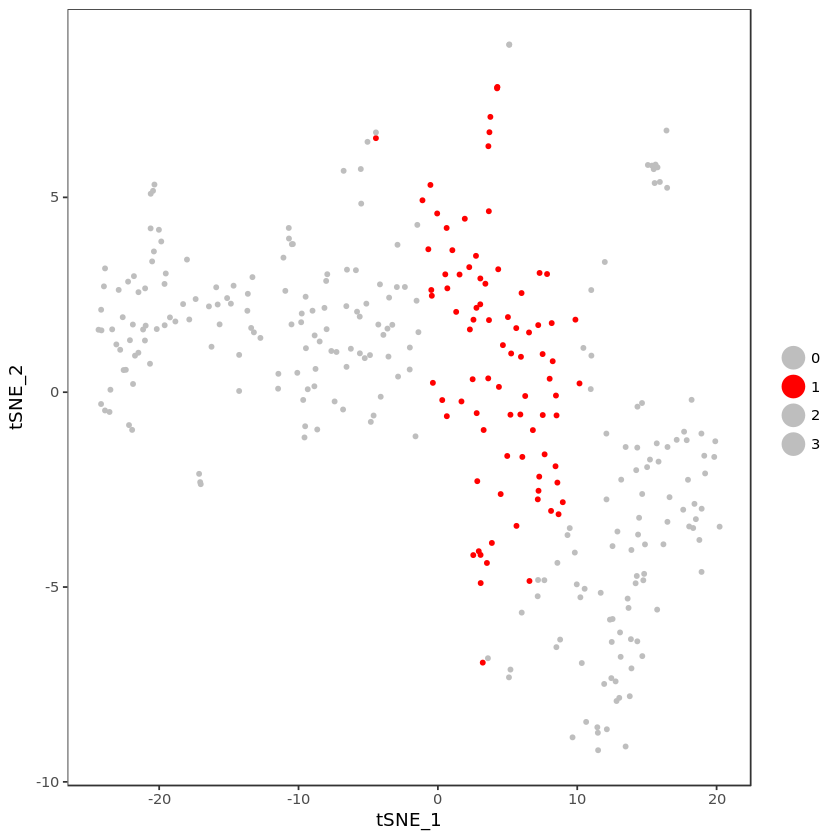

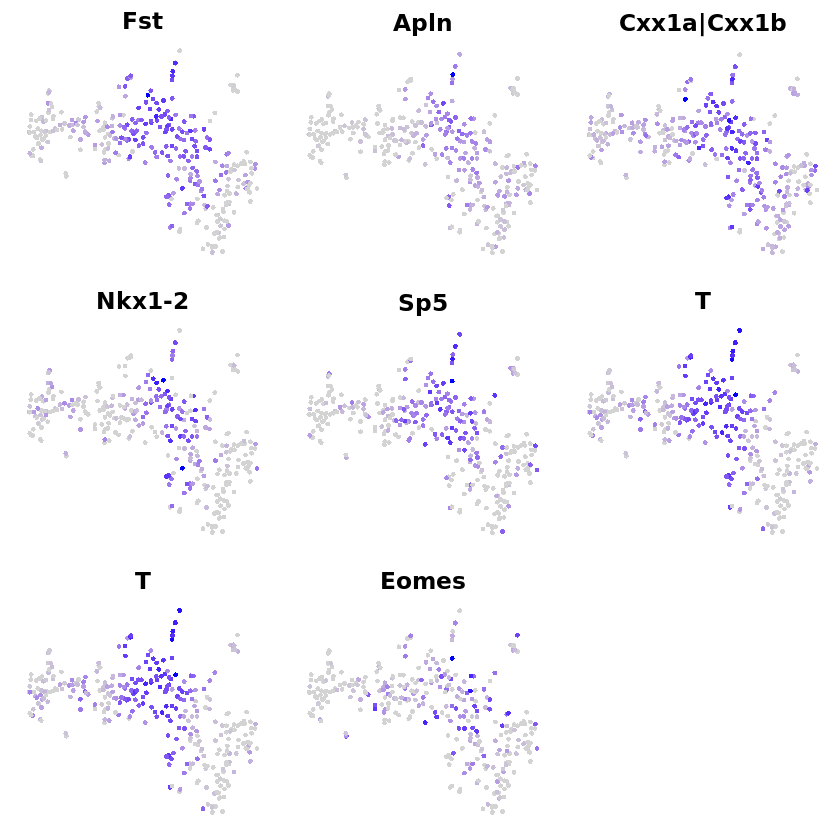

In [479]:
exploreDimRange(5)

#### Dim1:6

Cluster 0

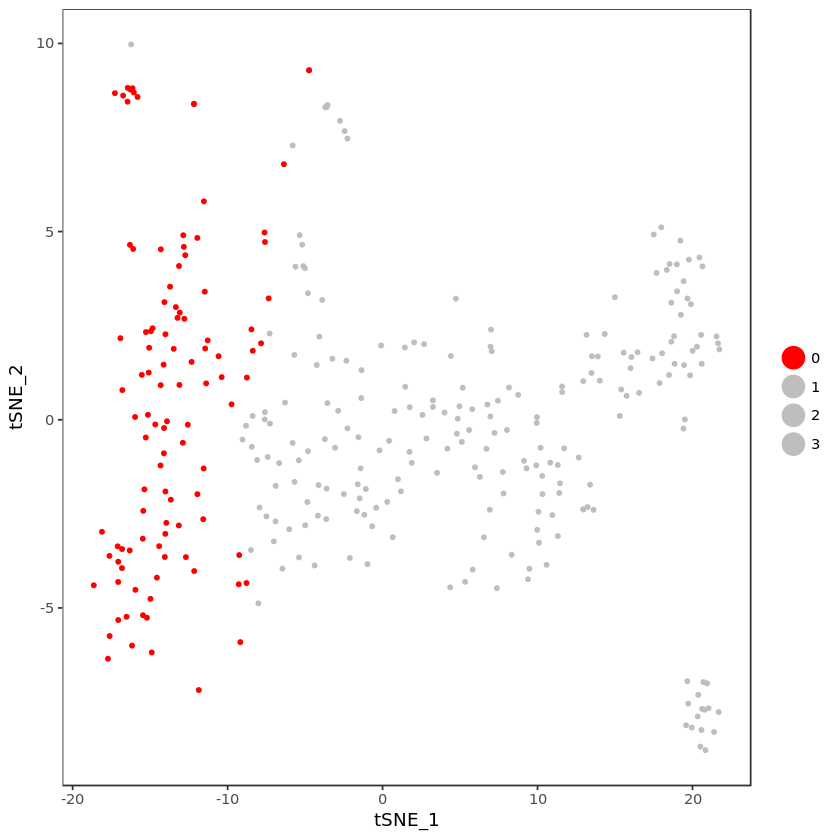

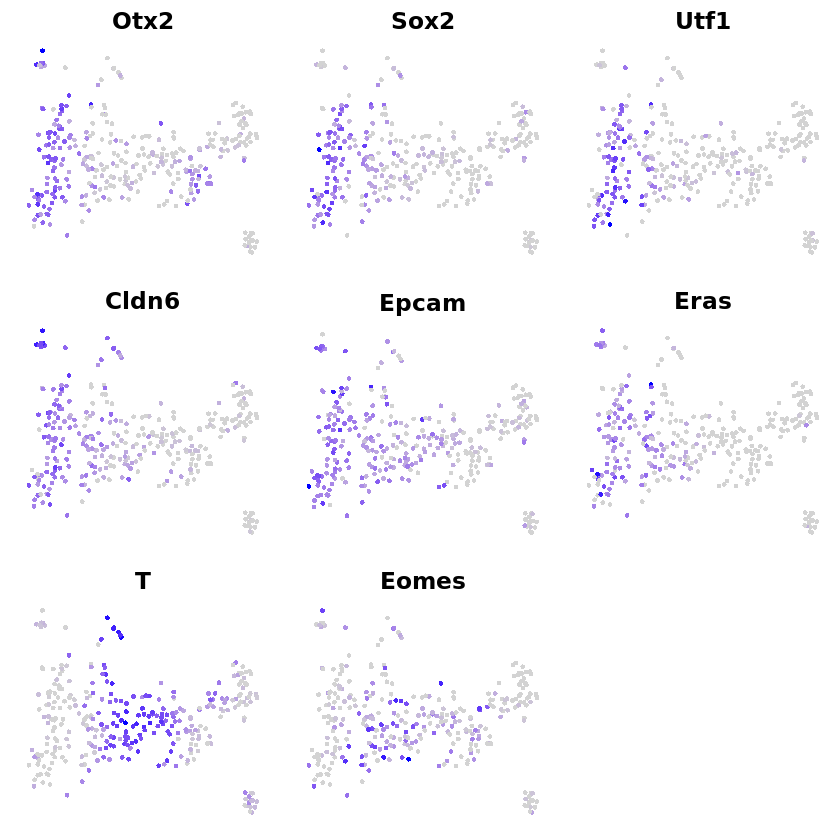

Cluster 1

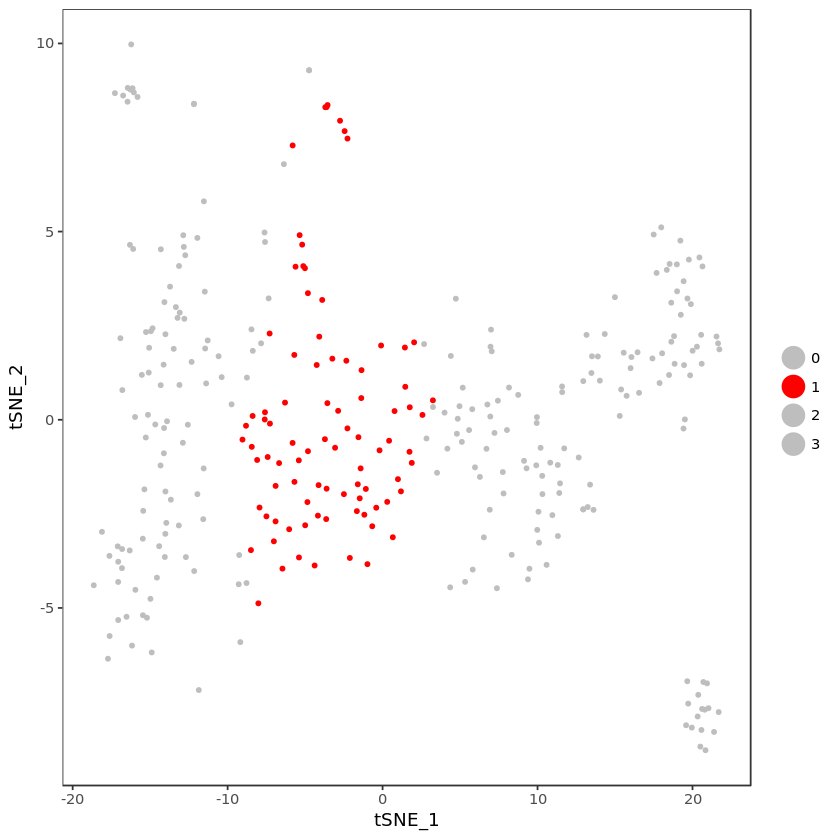

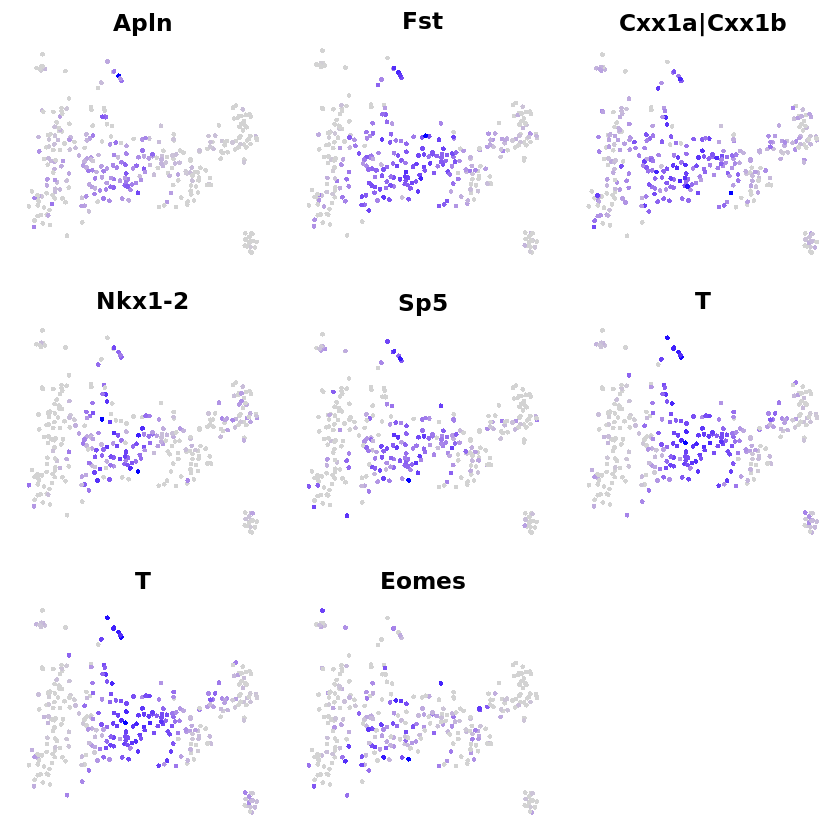

In [481]:
exploreDimRange(6)

#### Summary

A lot of the gene profiles seem very messy.

I will repeat the analysis but without the cell-cycle removal stage just in case we lost some biological variability.

# Repeat (without cell Cell Cycle variation) (from 1.4)

  |======================================================================| 100%
Time Elapsed:  1.24787159363429 mins 



Warning message:
“Removed 22221 rows containing missing values (geom_point).”

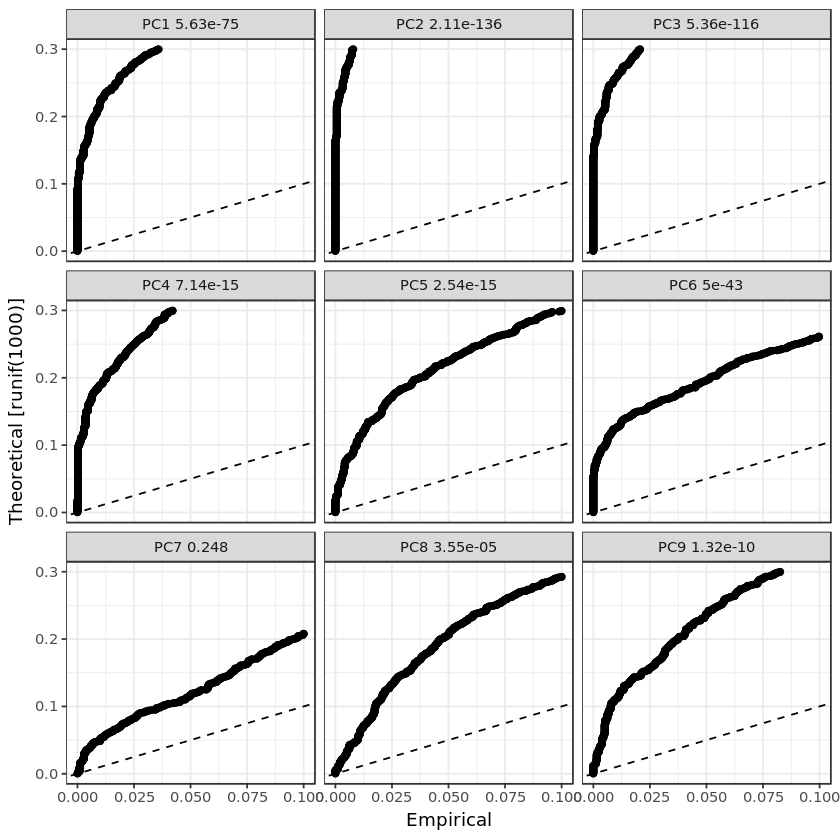

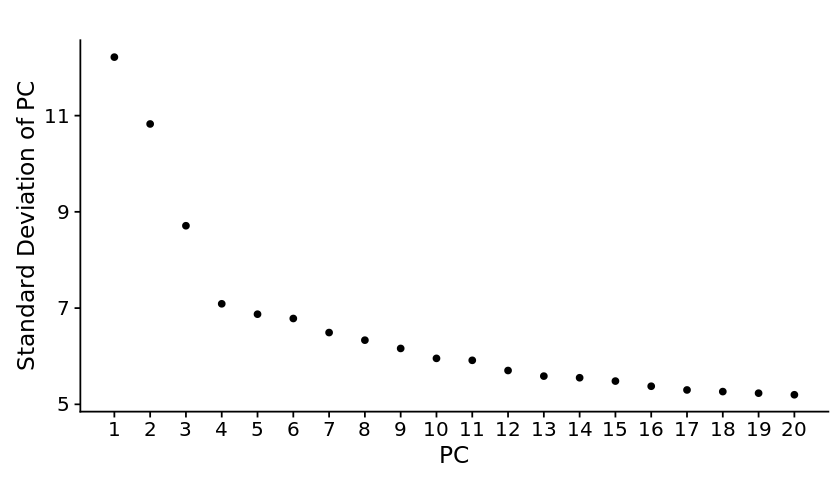

In [484]:
# Seurat object before CellCycle regressed out
seu_new <- seu_pca

seu_js <- JackStraw(
    object = seu_new,
    num.replicate = 100, 
)

par(mfrow=c(2,1))
JackStrawPlot(object = seu_js, PCs = 1:9)

options(repr.plot.height=4)
PCElbowPlot(object = seu_js, num.pc = 20) + scale_x_continuous(breaks = seq(1, 20, by = 1))



In [ ]:
limrange=2:6

seu_filts <- list()
tab_filts <- list()

for (lim in limrange){
    seu_filts[[lim]] <- FindClusters(
        object = seu_js, 
        reduction.type = "pca", 
        dims.use = 1:lim, 
        resolution = 1.0, 
        print.output = 0, 
        save.SNN = TRUE
    )
}

for (lim in limrange){
    seu <- seu_filts[[lim]]
    tab_filts[[lim]] <- table(seu@ident)
}


In [486]:
tab <- rbind(
    rbind(lapply(tab_filts, function(x) length(names(x)))),
    rbind(tab_filts)
)
          
colnames(tab) <- lapply(c(1,limrange), function(x) paste("1:", x, sep=""))
rownames(tab) <- c("Num. of clusts", "Freq. clusters")
t(tab)

,Num. of clusts,Freq. clusters
1:1,0,NULL
1:2,5,"81, 72, 66, 59, 48"
1:3,7,"59, 53, 50, 49, 49, 43, 23"
1:4,4,"110, 85, 76, 55"
1:5,5,"98, 83, 72, 58, 15"
1:6,5,"100, 80, 72, 57, 17"


### Difference
We now seem to be getting more clusters in the Dim1:3 range than the previous analysis.

In [487]:
tsnes_dim <- generateTSNEs()

### TSNE Plots for different Dim Ranges

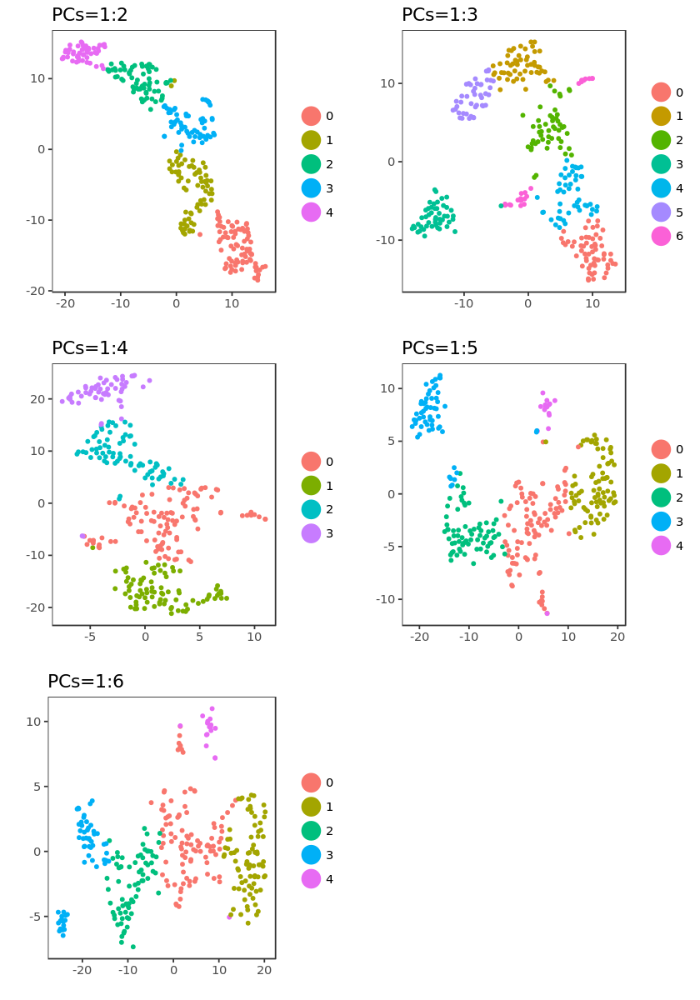

In [489]:
options(repr.plot.height=10)
printInteresting(tsnes_dim, 2:6)

In [490]:
marker_list <- list()

for (lim in limrange){
    marker_list[[lim]] <- FindAllMarkers(
        object = tsnes_dim[[lim]], 
        only.pos = TRUE, 
        min.pct = 0.25, 
        thresh.use = 0.25
    )
}

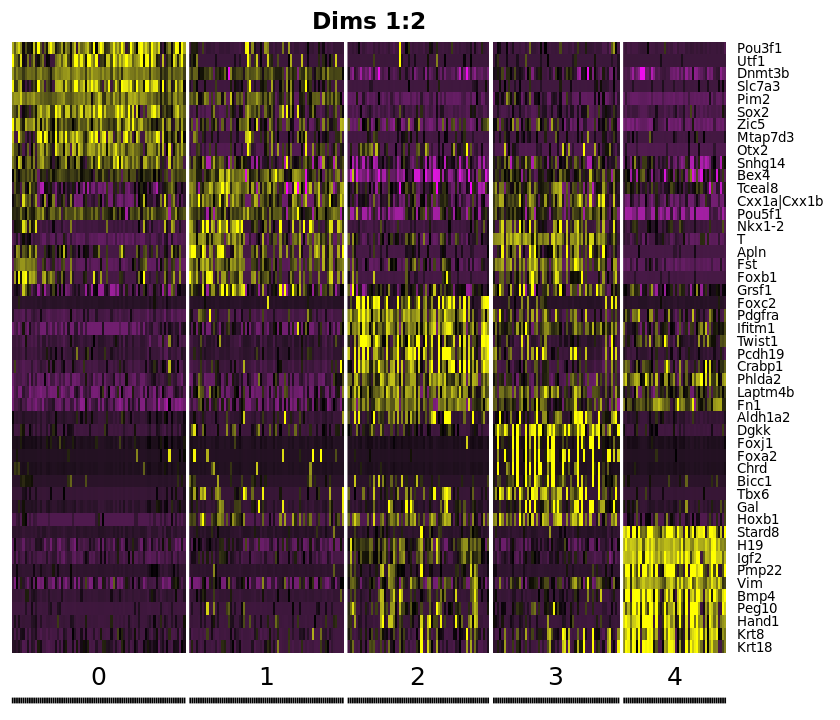

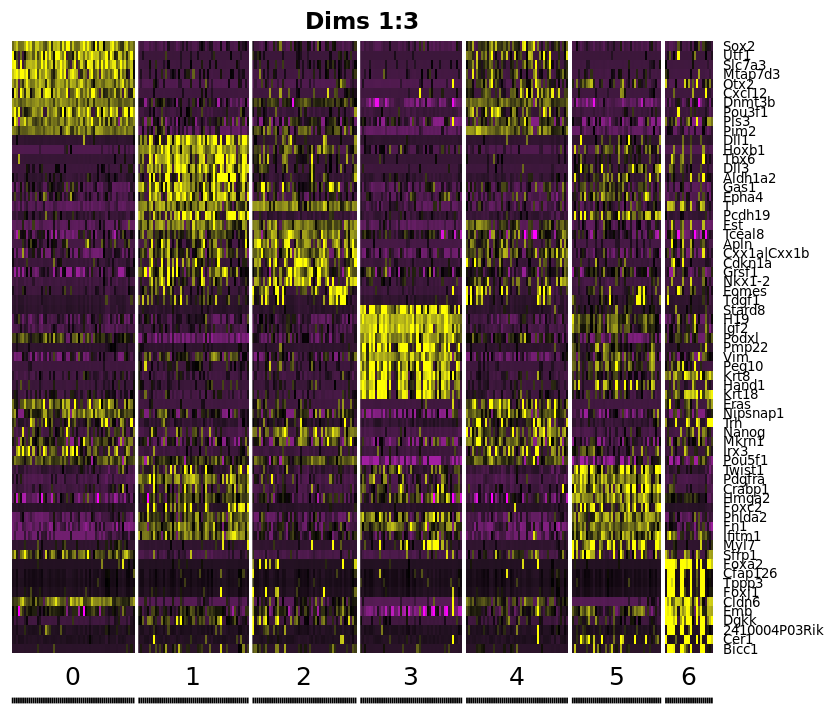

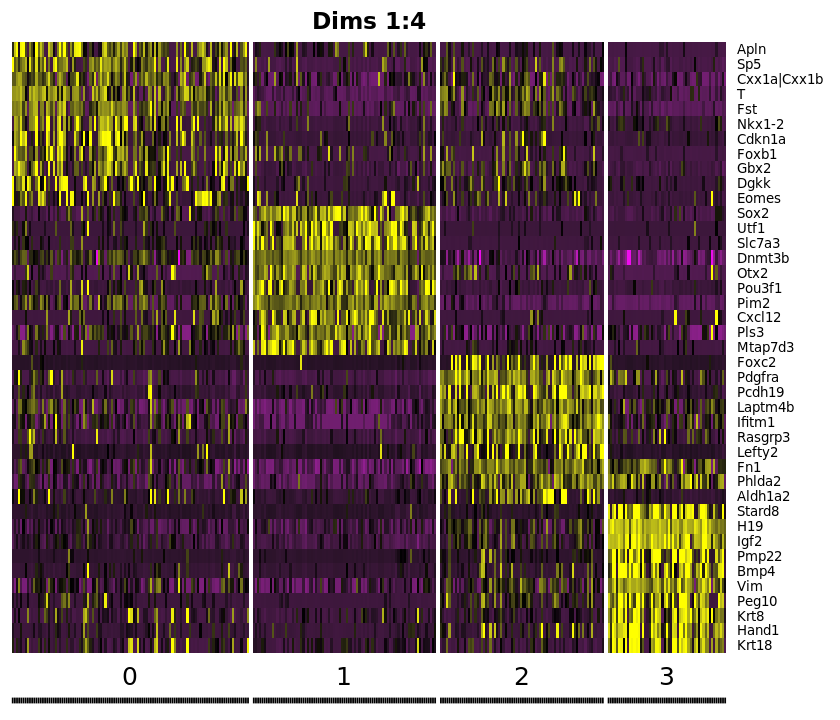

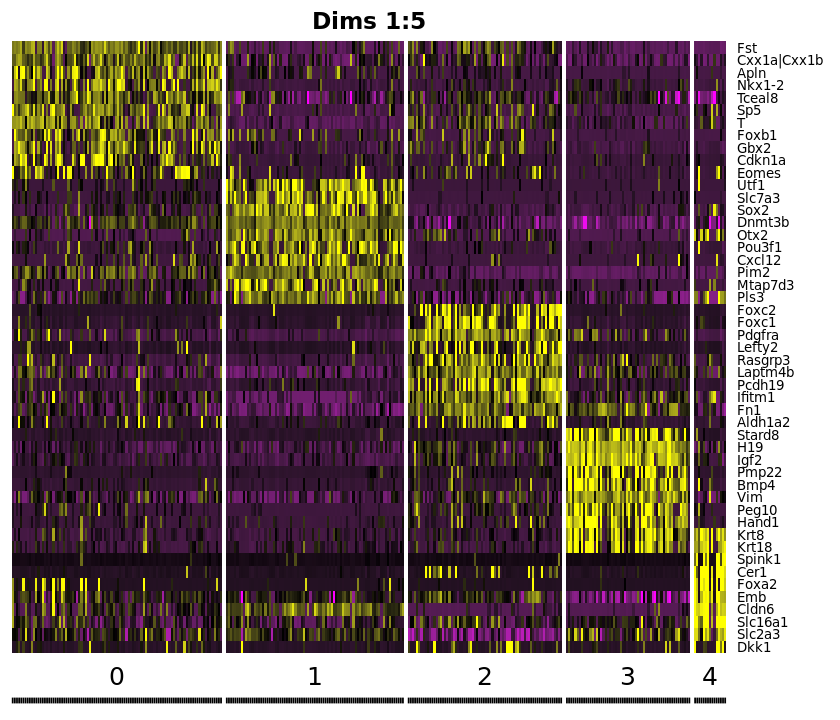

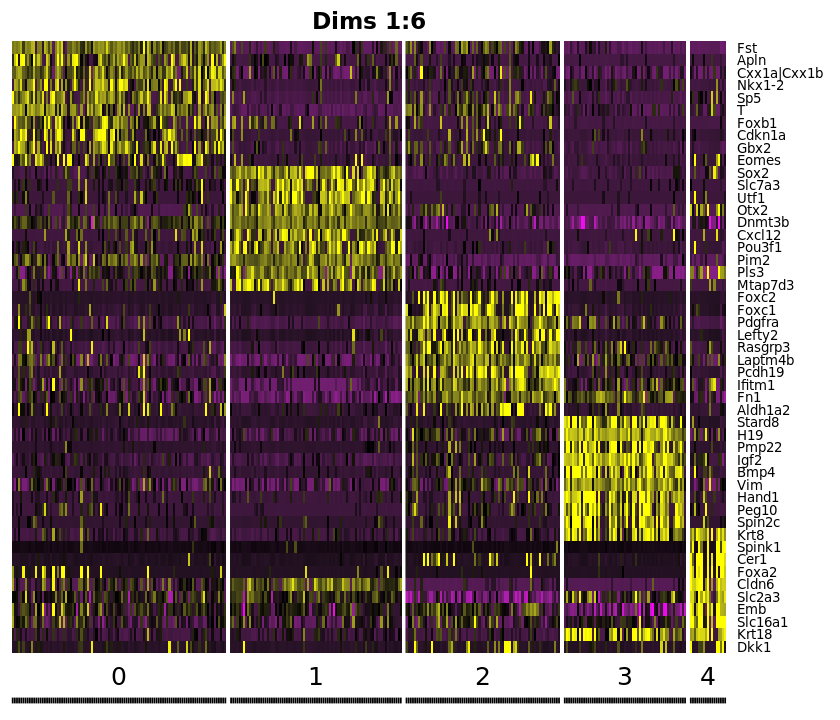

In [492]:
options(repr.plot.height=6)
for (lim in limrange){
    def <- marker_list[[lim]]
    #top10 <- markers %>% group_by(cluster) %>% top_n(10, avg_logFC)
    
    top10_with <- rbind(
       (def %>% group_by(cluster) %>% top_n(10, avg_logFC)),
        def %>% group_by(cluster) %>% filter(gene == "Eomes")
    ) %>% arrange(cluster)
    
    print(DoHeatmap(
        object = tsnes_dim[[lim]], 
        genes.use = top10_with$gene,
        remove.key = TRUE,
        title = paste("Dims 1:", lim, sep=""),
        cex.col = 0,
        cex.row = 8
    ))
}


In Dim1:3 we Eomes and T in two different clusters. These clusters are slightly inter-related and are combined into one cluster in higher PC plots. 

#### Dim 1:2

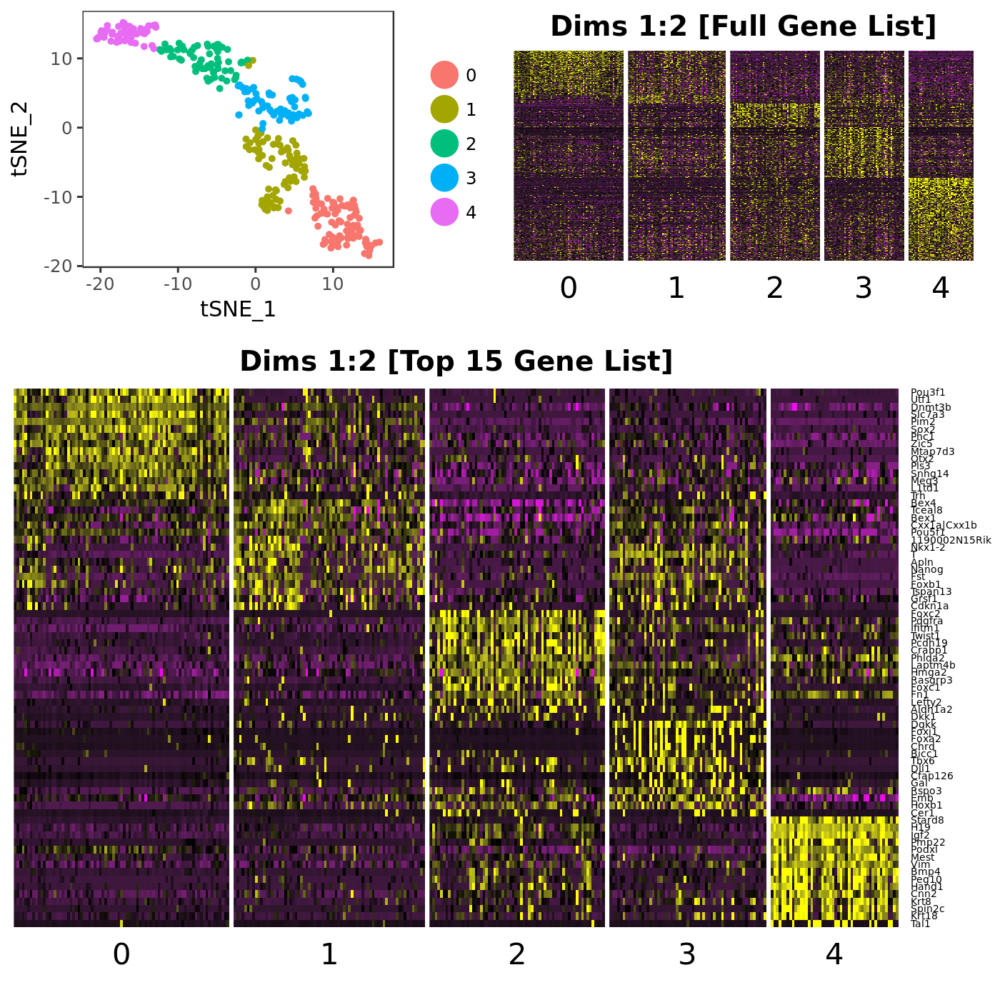

Cluster 0

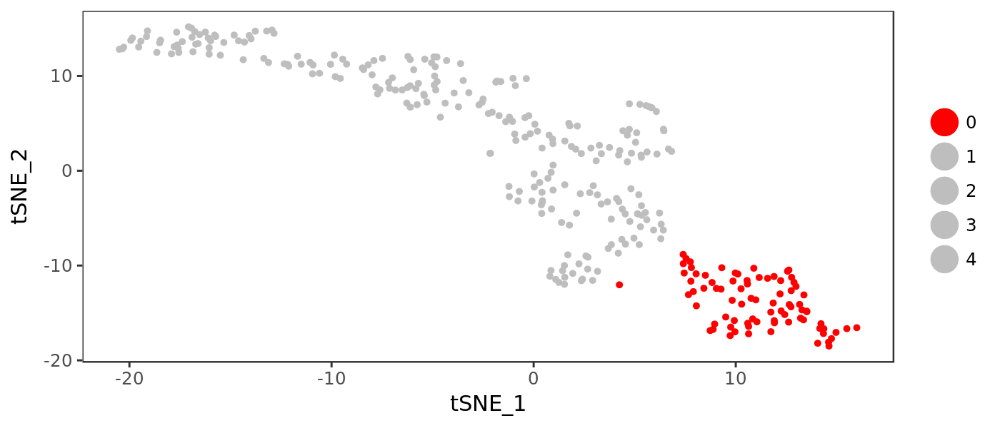

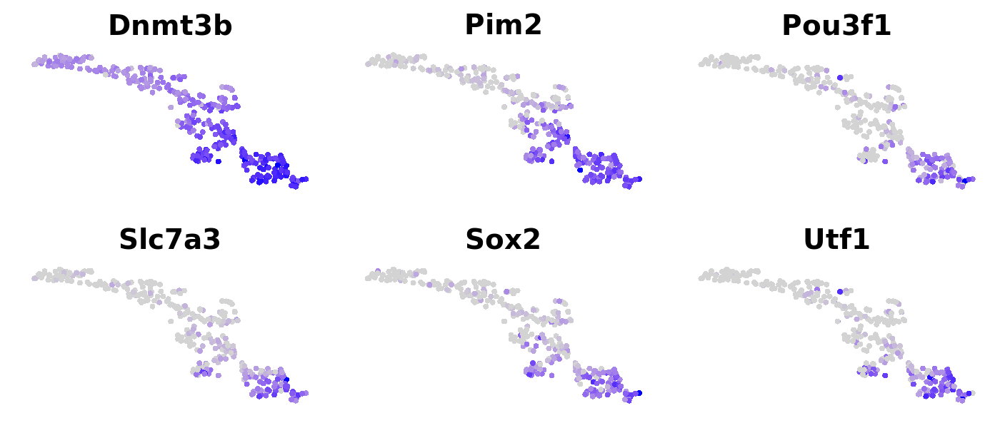

Cluster 1

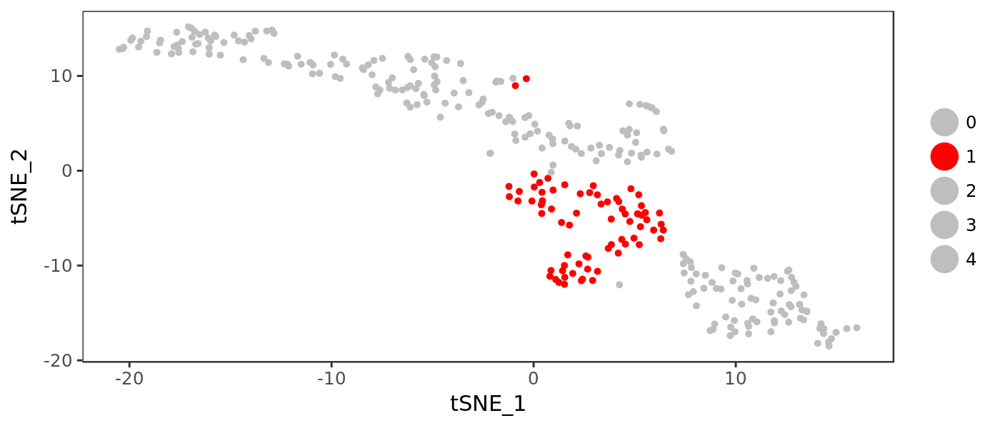

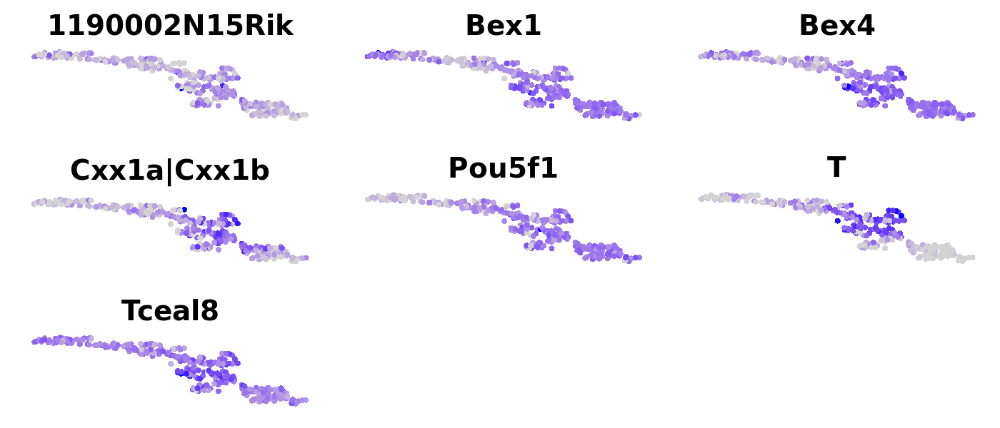

Cluster 2

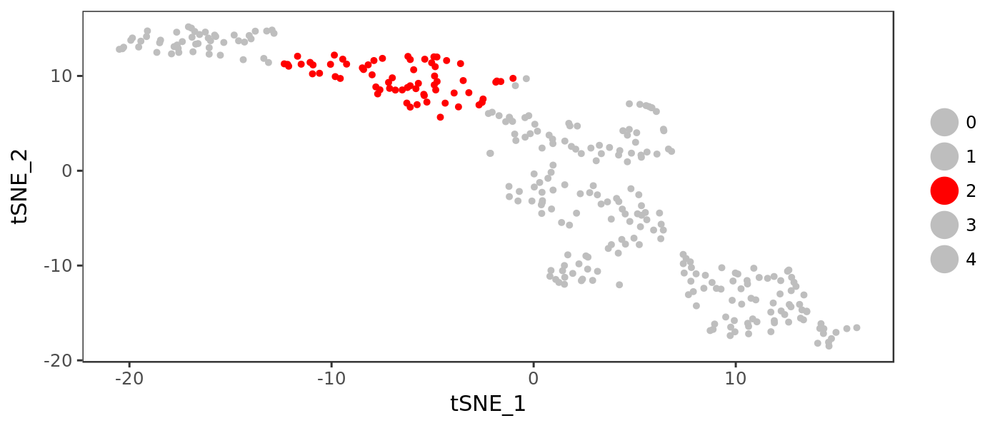

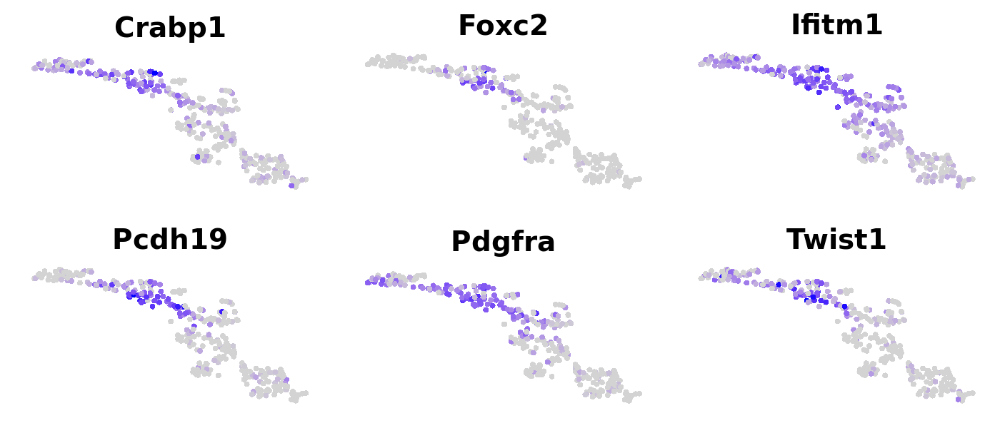

Cluster 3

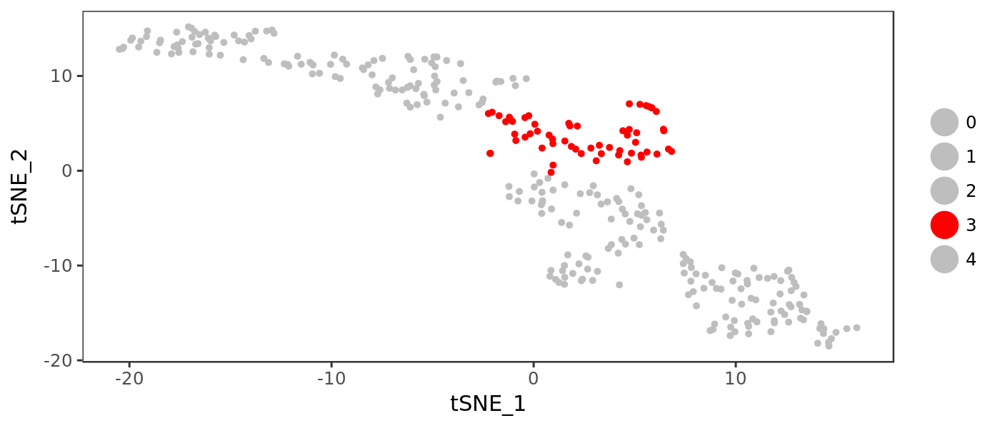

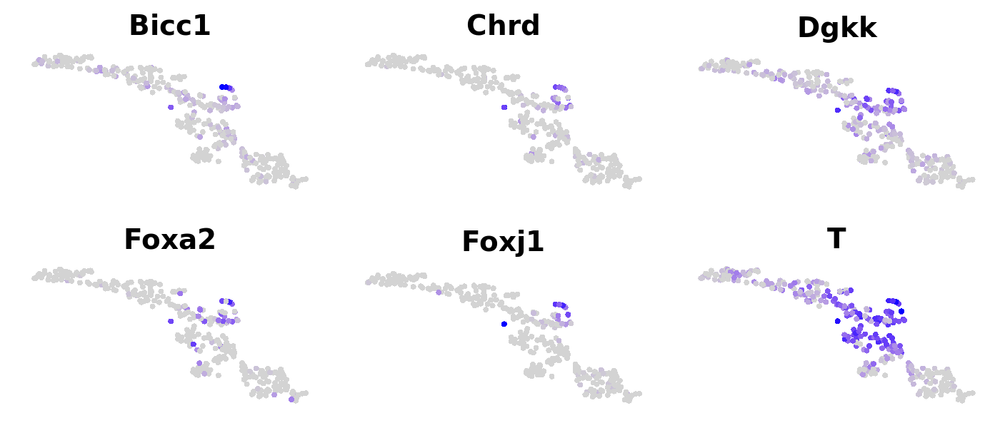

Cluster 4

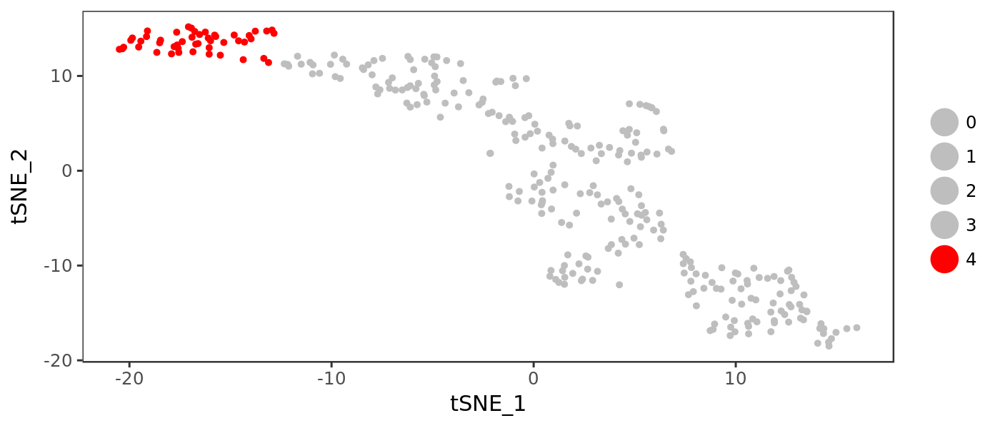

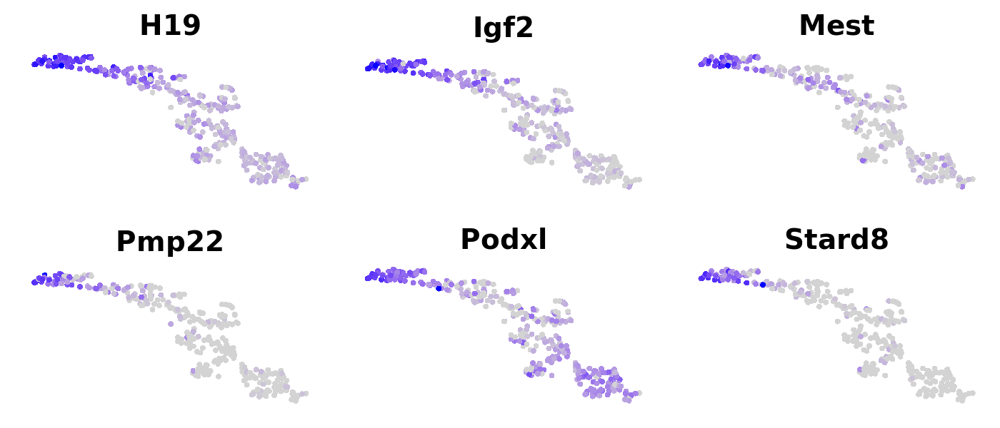

In [624]:
heatMapDimRange(2)
genexprDimRange(2)

#### Dim 1:3

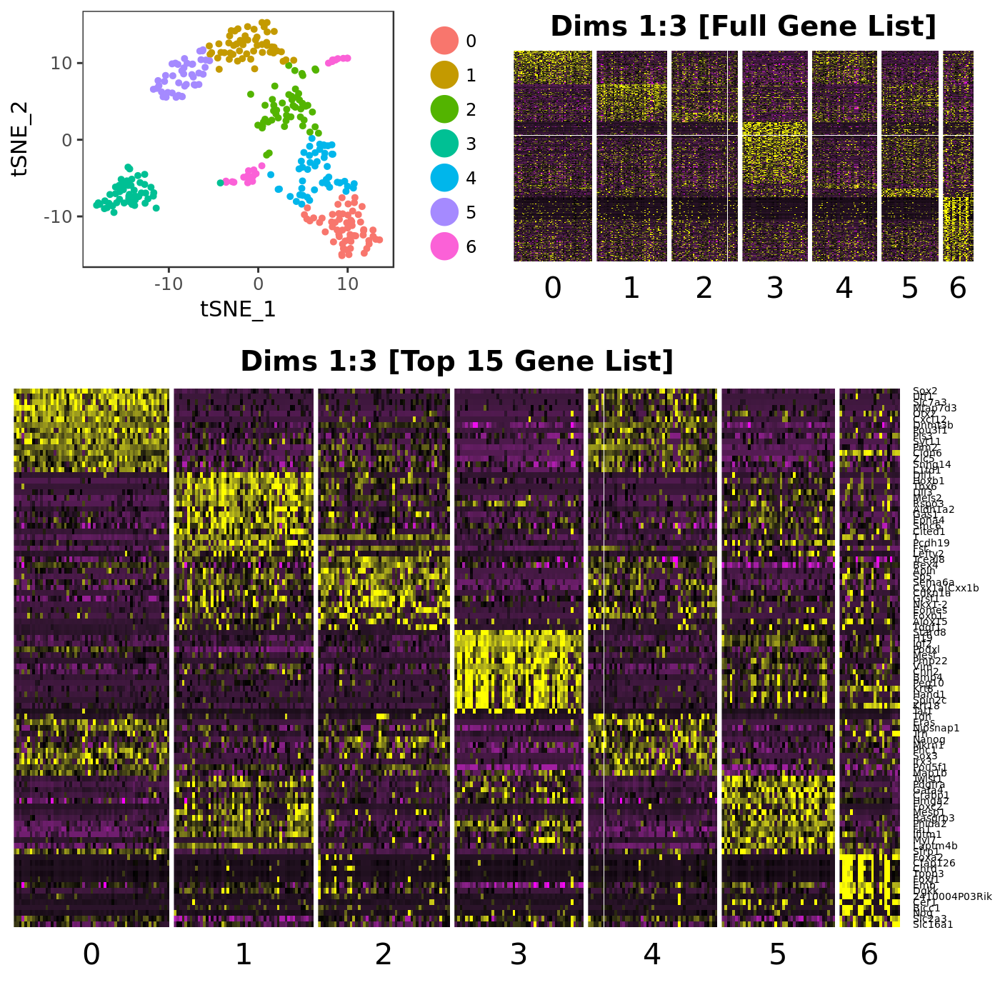

Cluster 0

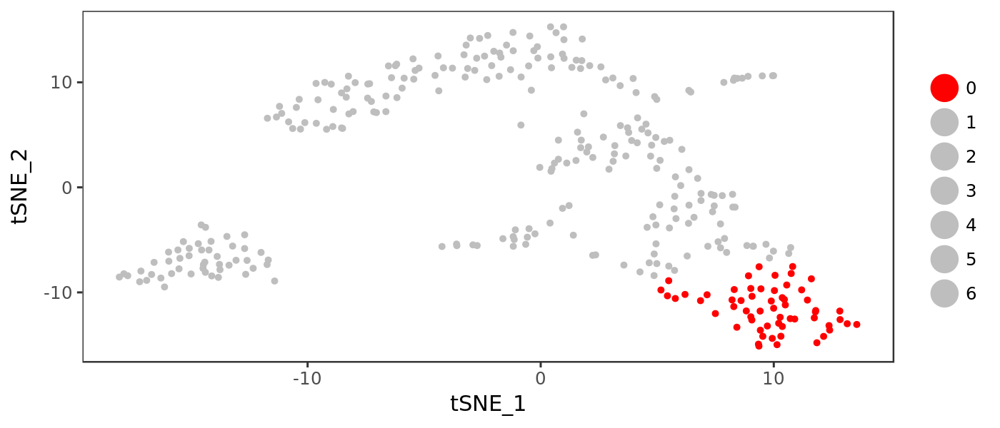

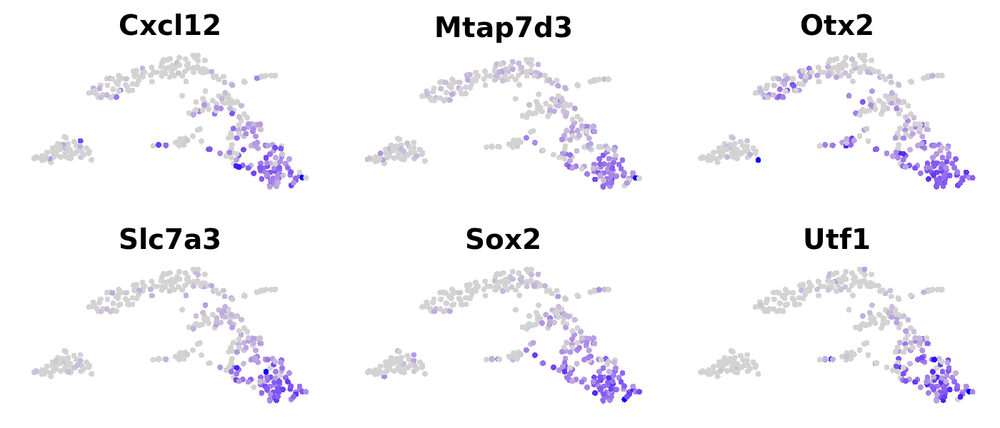

Cluster 1

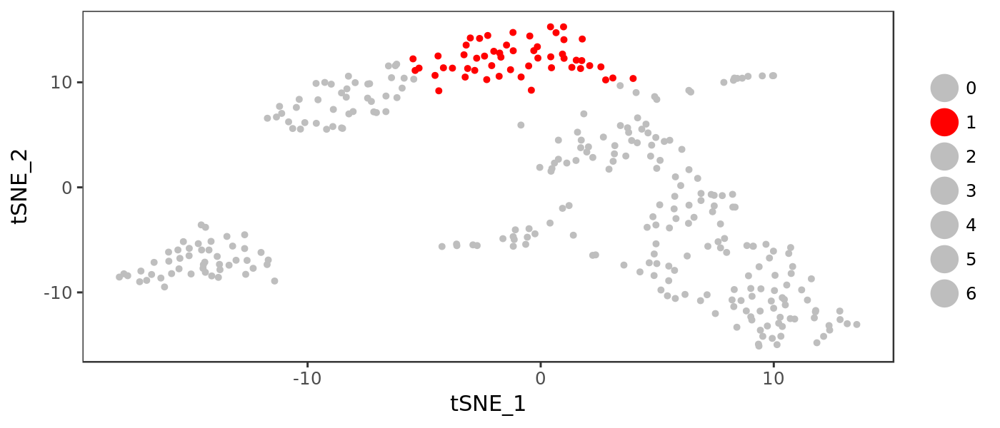

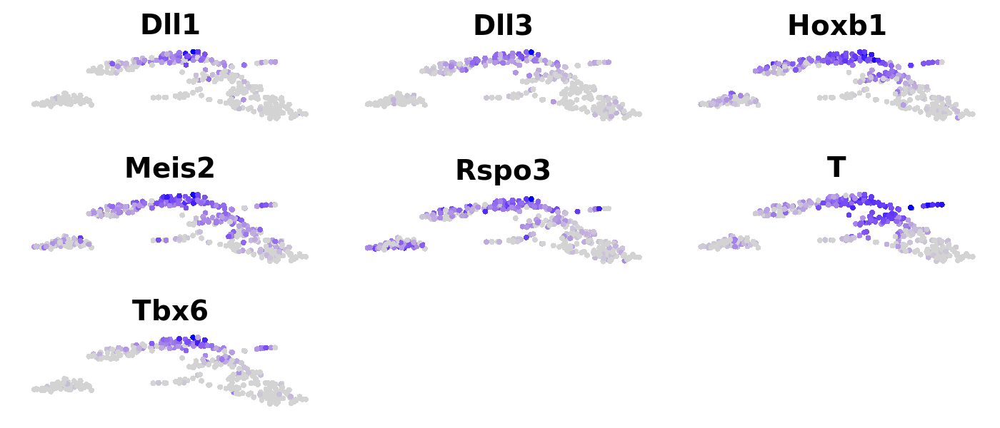

Cluster 2

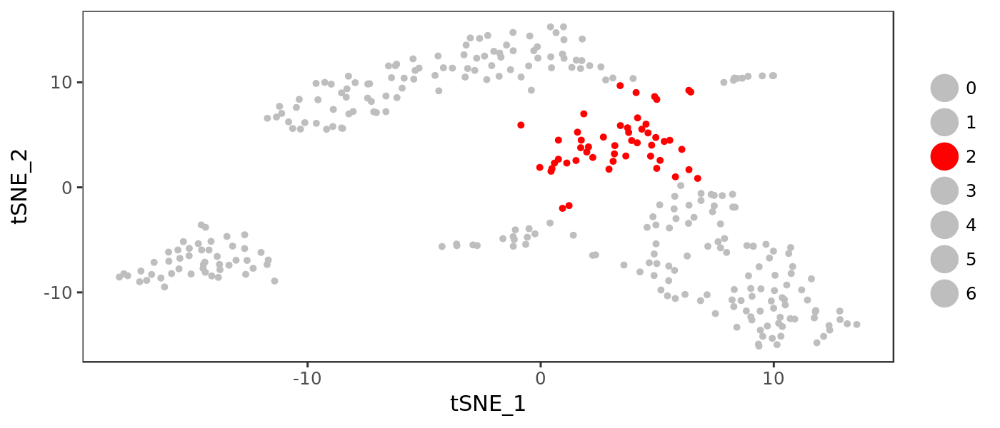

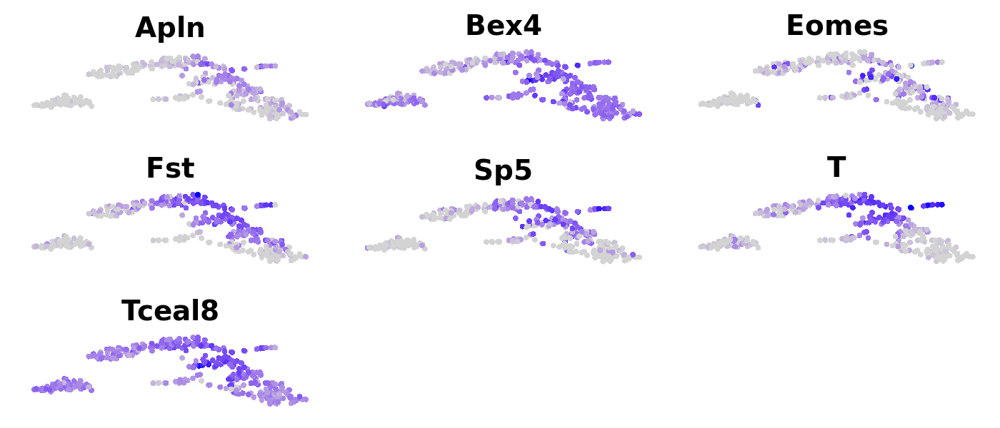

Cluster 3

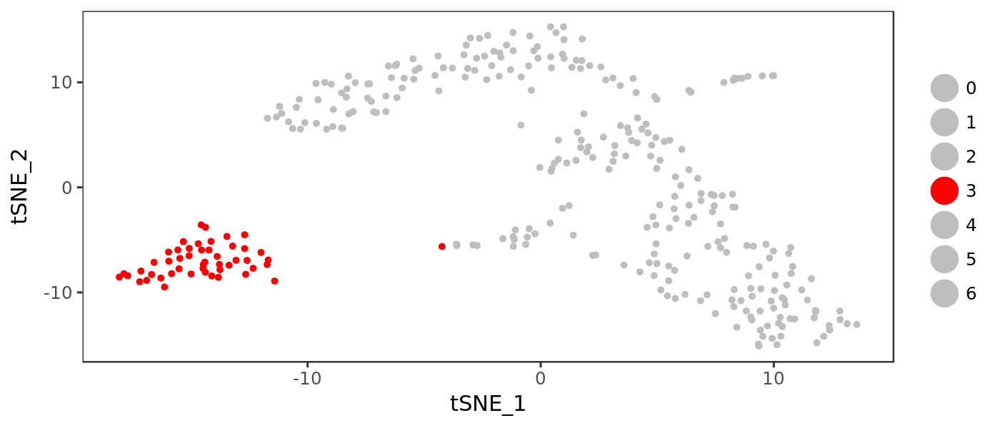

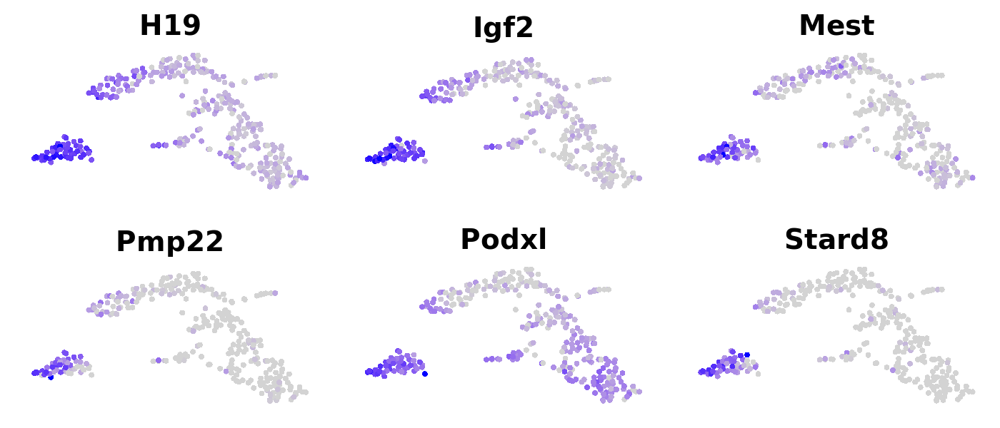

Cluster 4

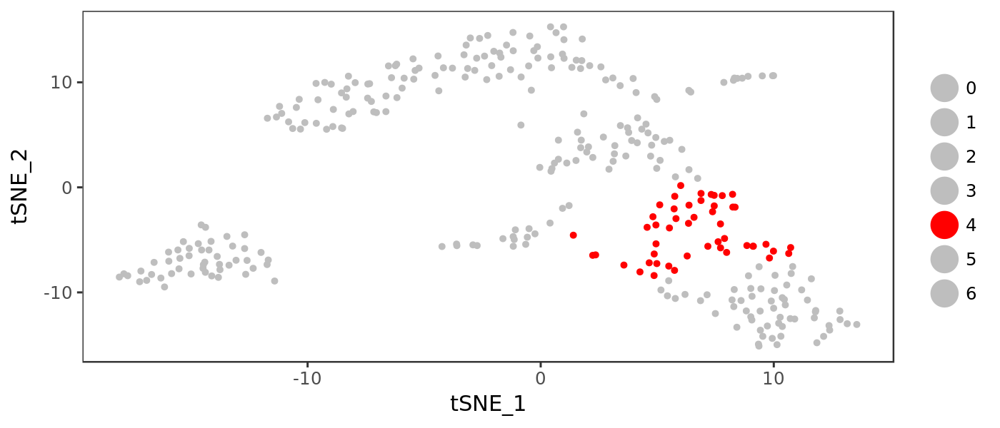

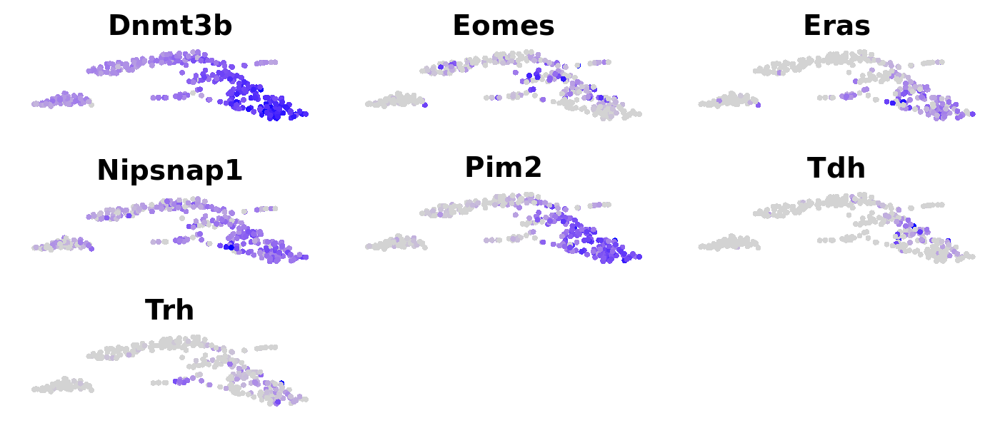

Cluster 5

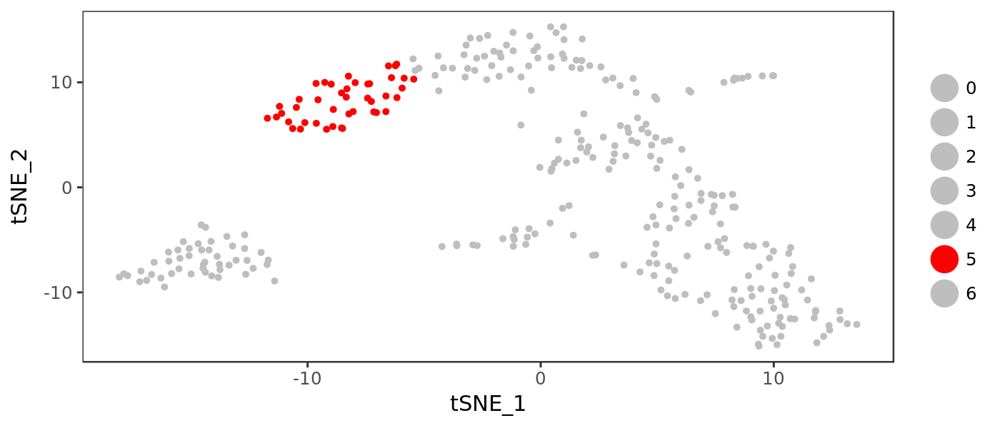

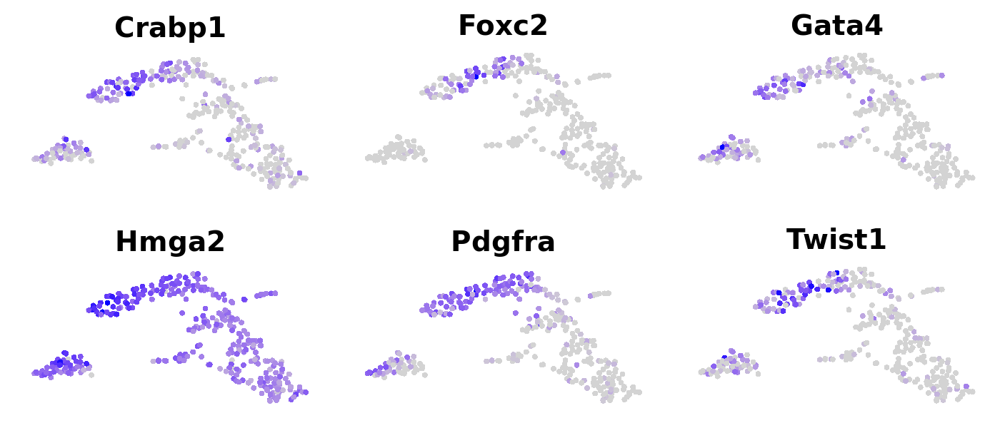

Cluster 6

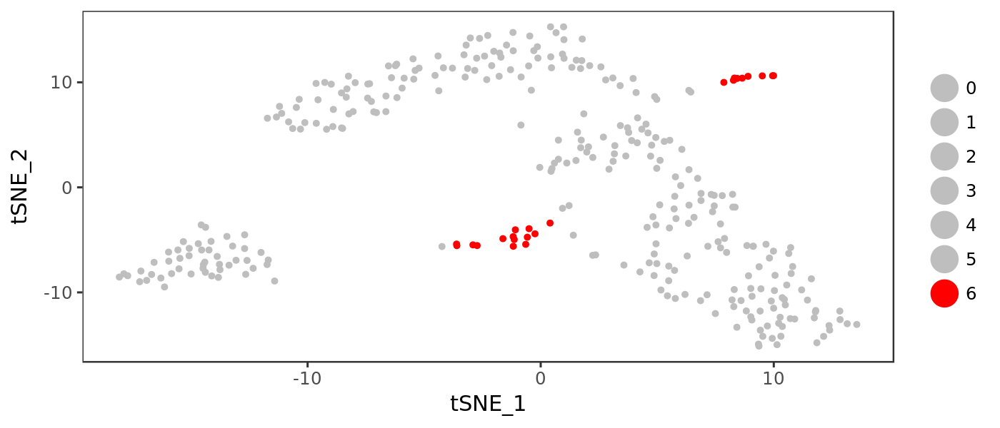

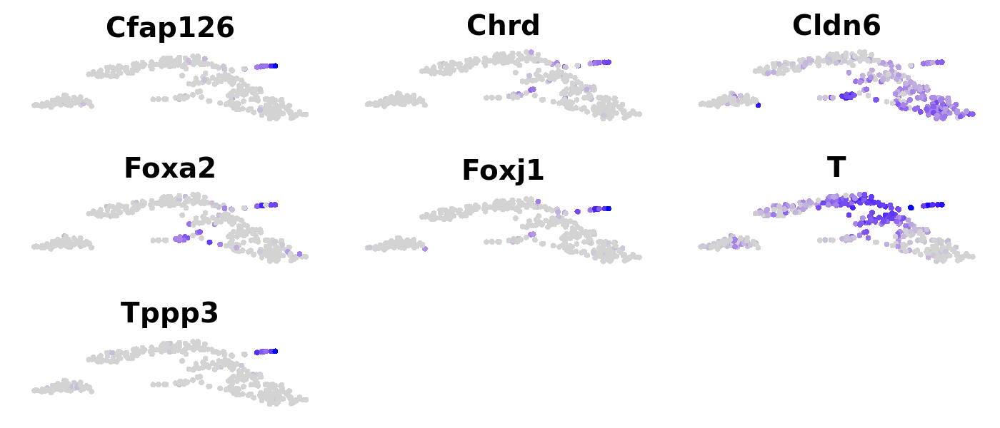

In [625]:
heatMapDimRange(3)
genexprDimRange(3)

#### Dim1:4

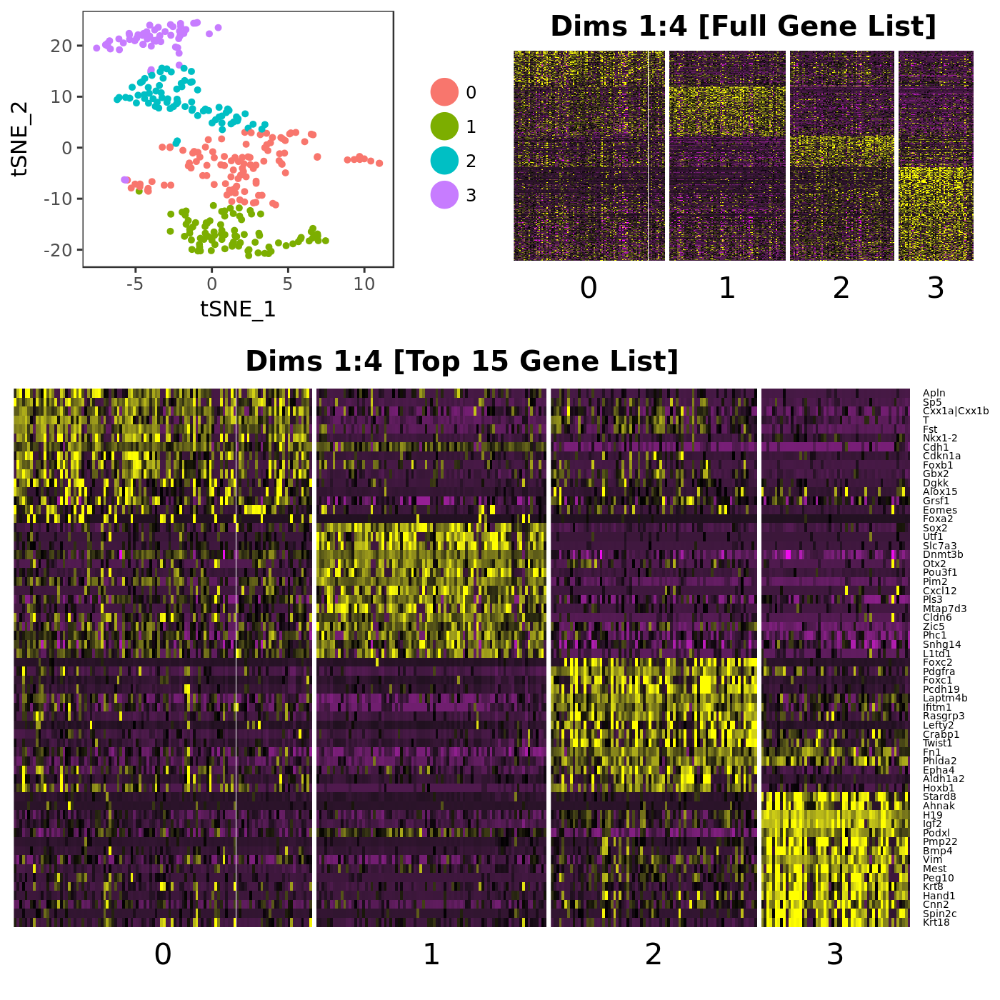

Cluster 0

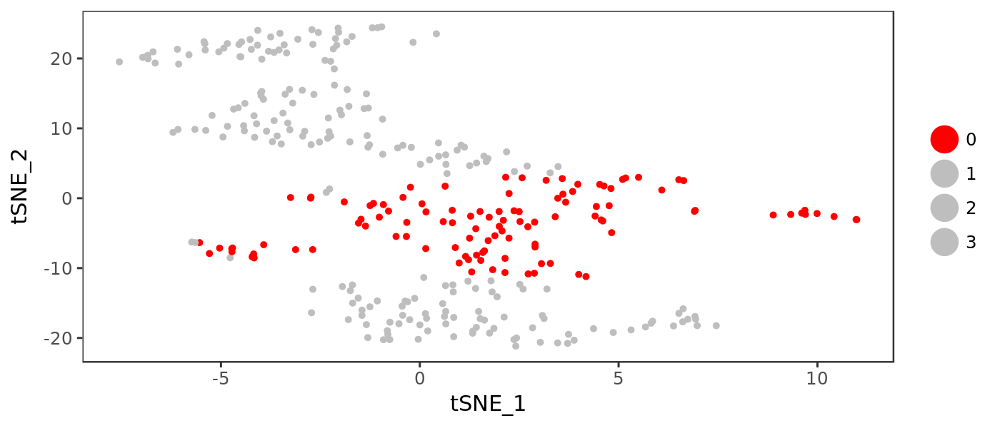

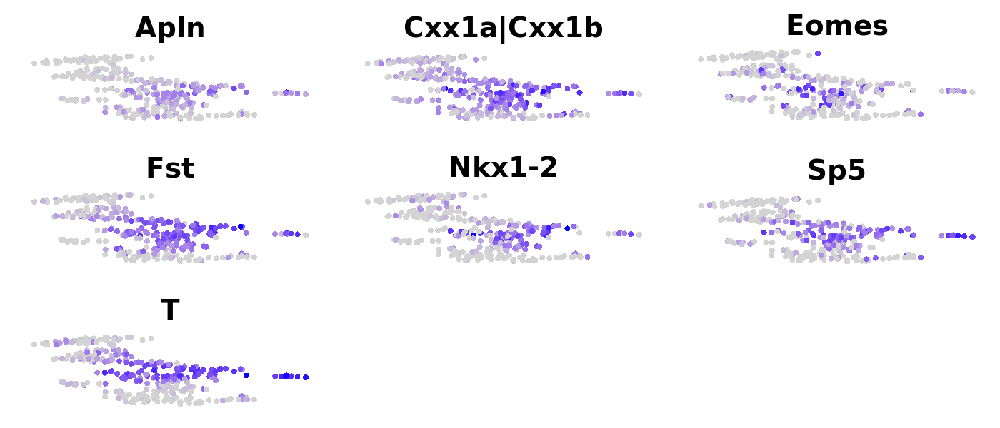

Cluster 1

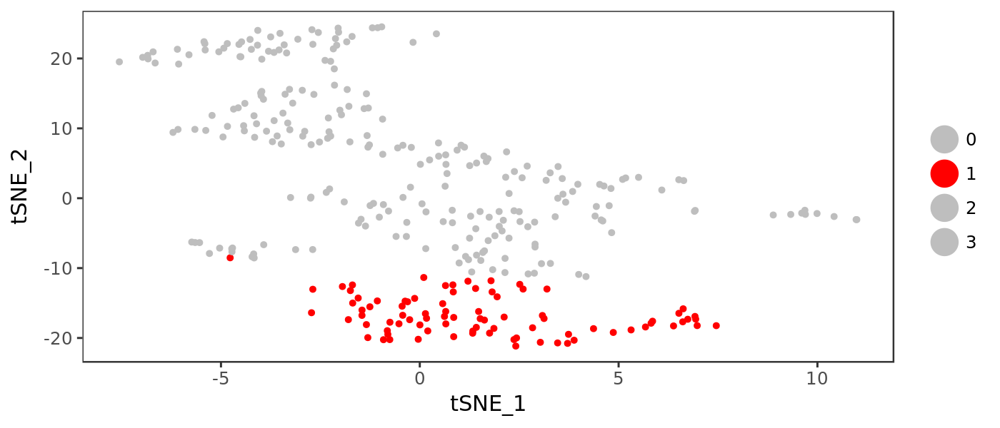

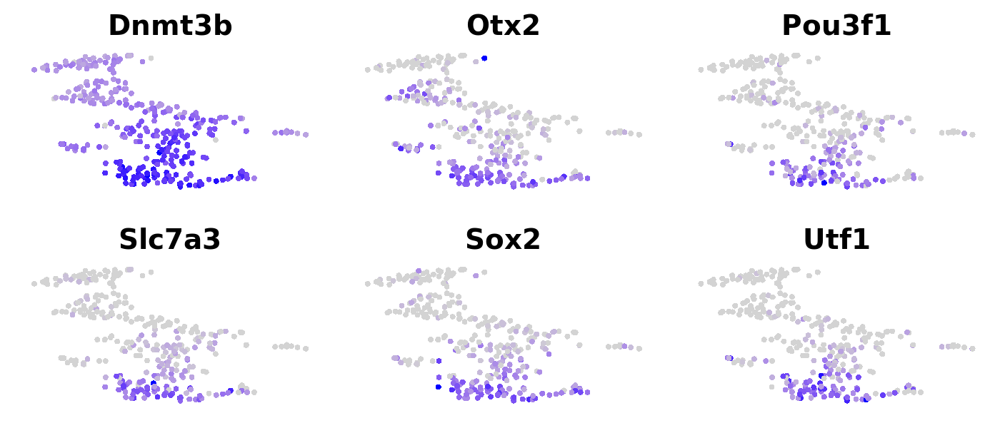

Cluster 2

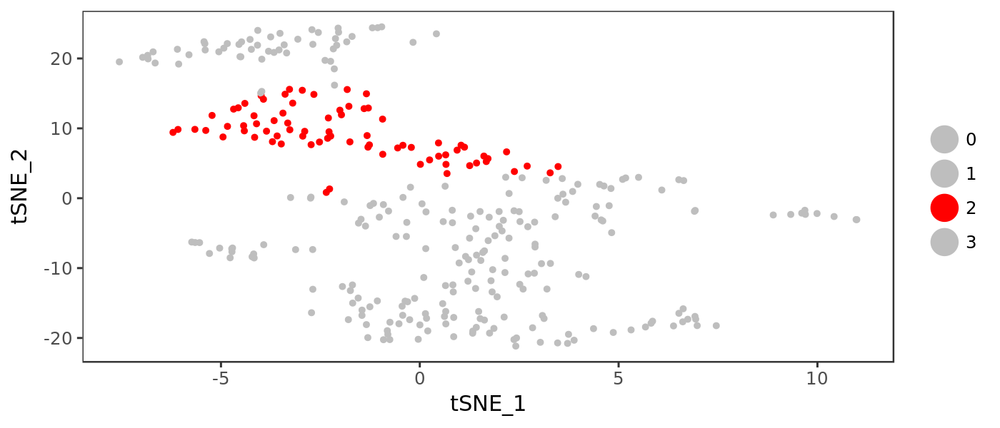

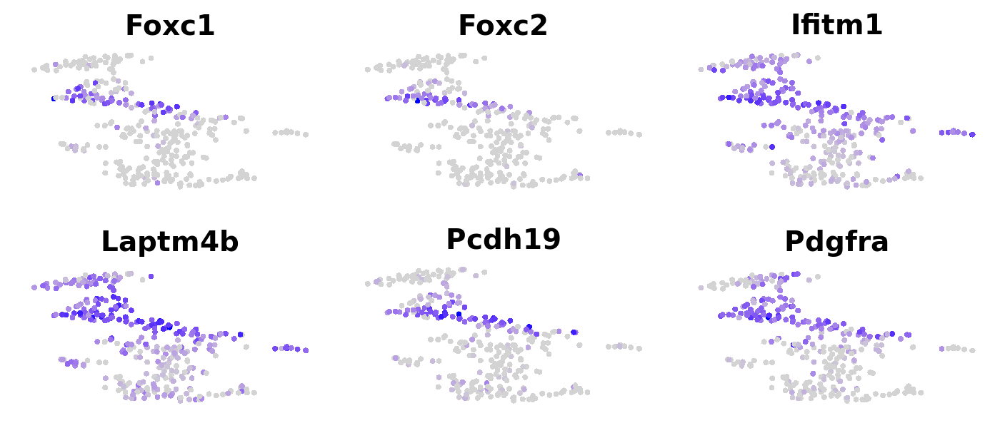

Cluster 3

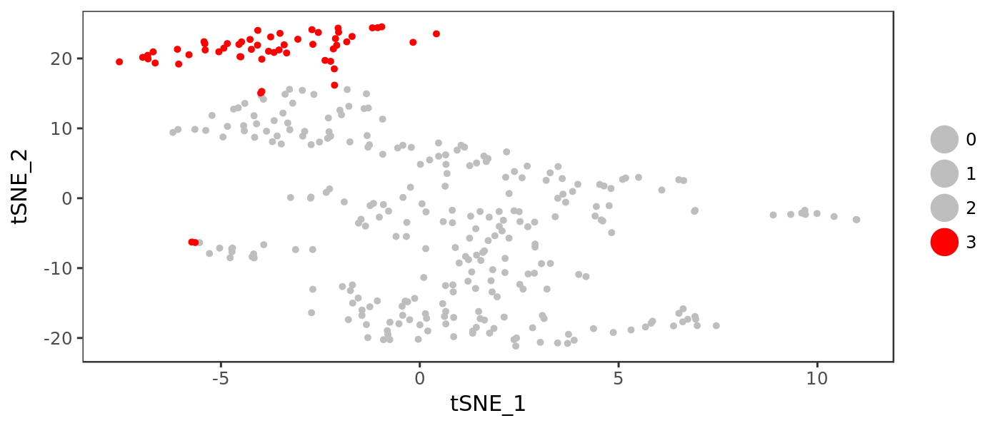

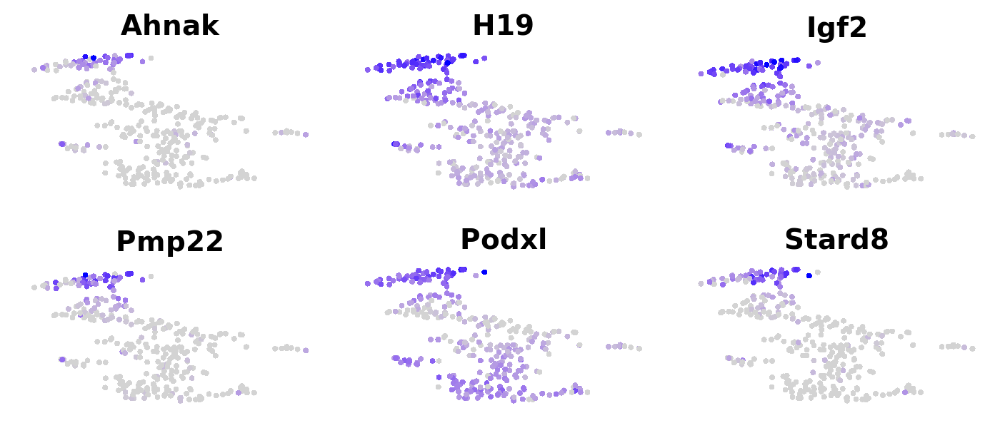

In [626]:
heatMapDimRange(4)
genexprDimRange(4)

#### Dim1:5

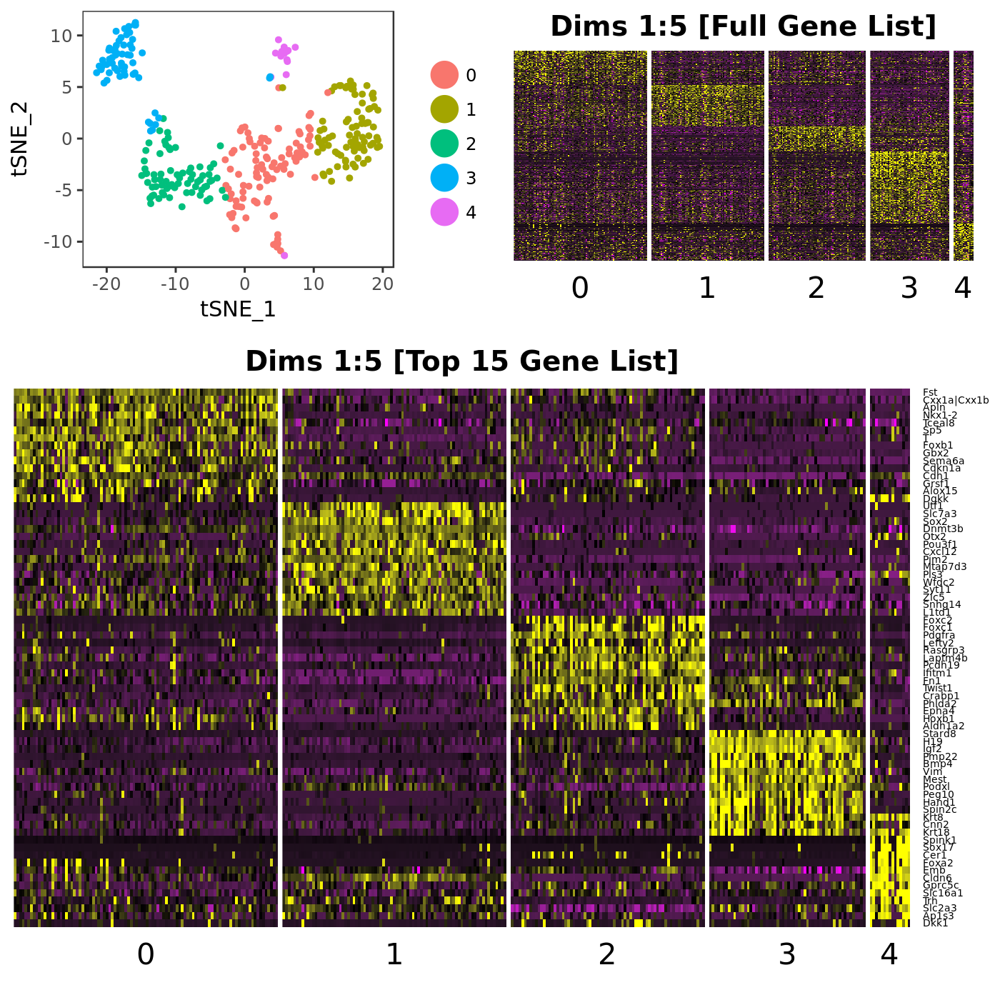

Cluster 0

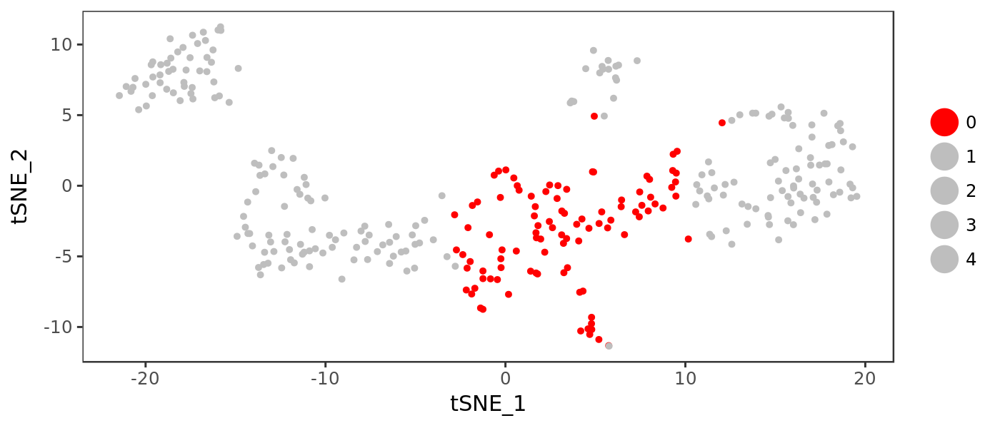

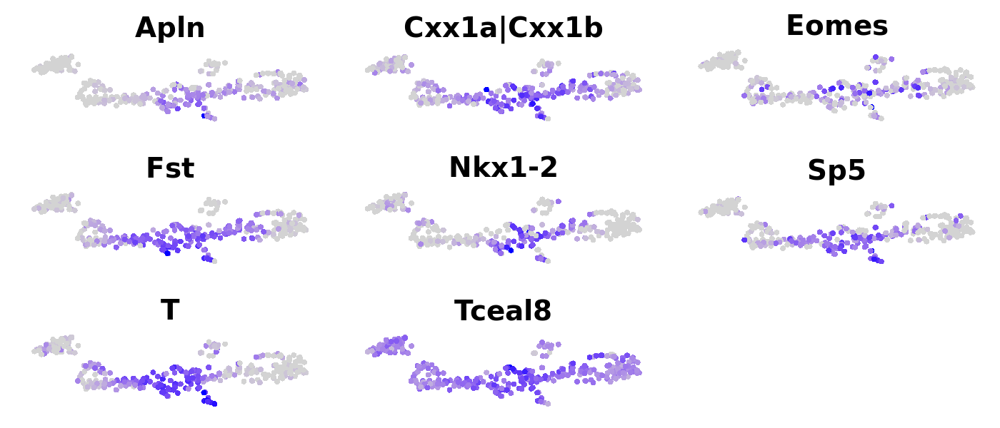

Cluster 1

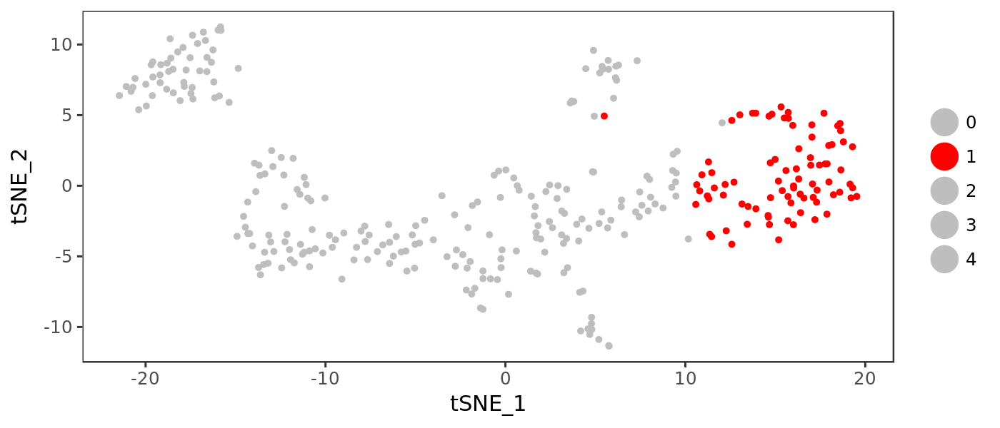

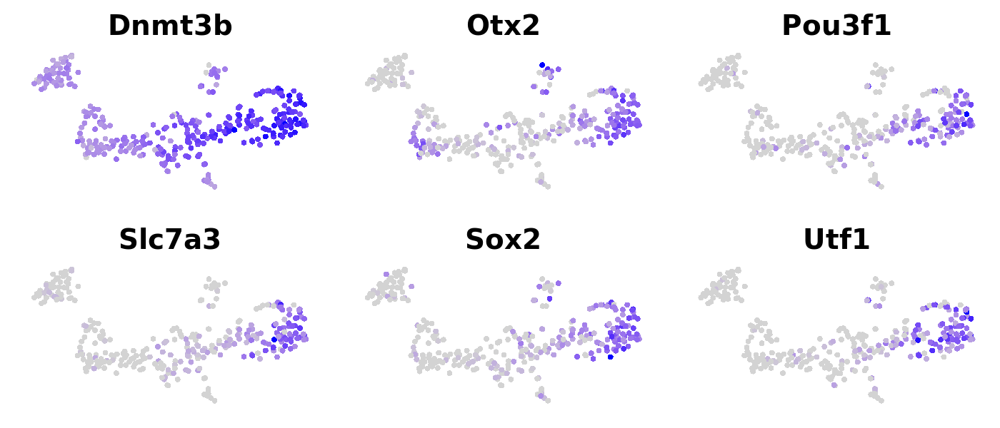

Cluster 2

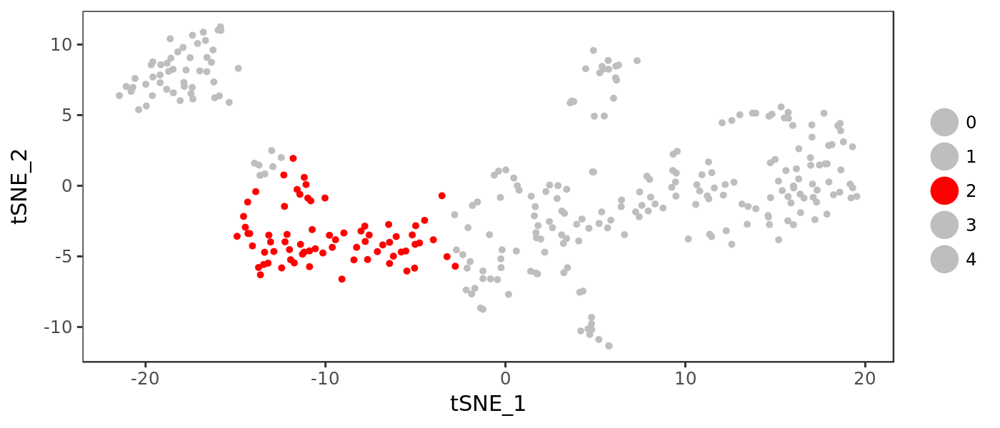

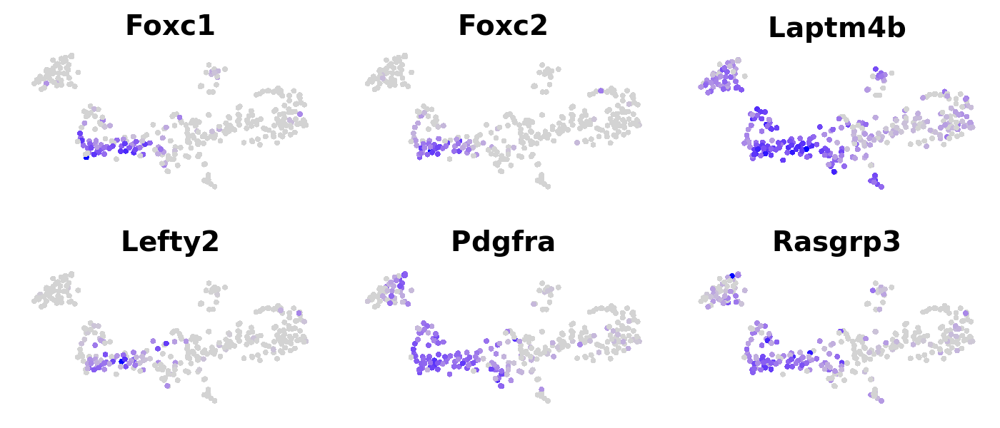

Cluster 3

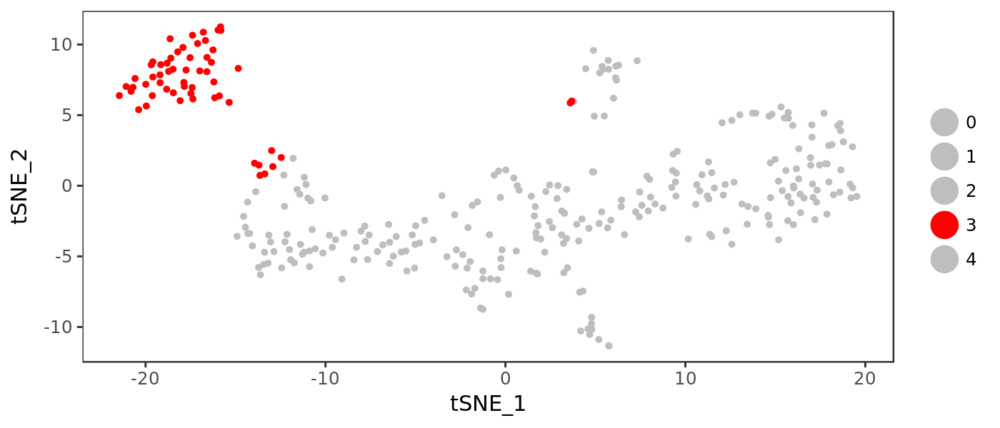

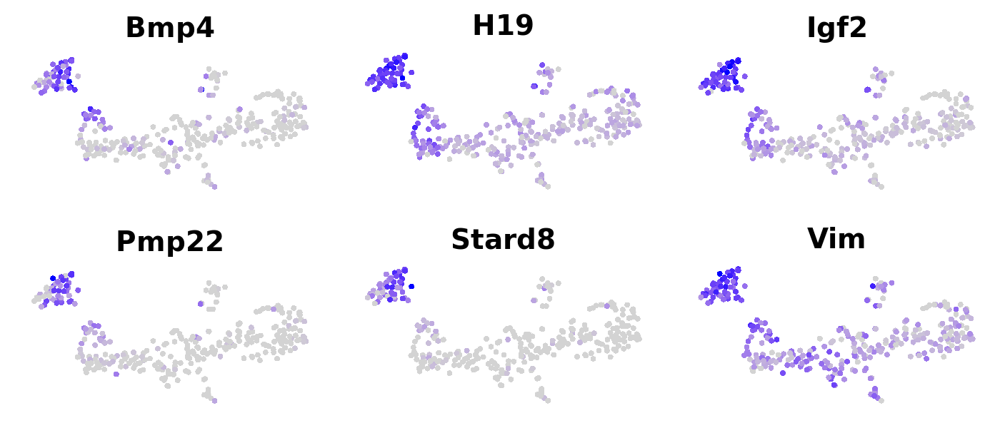

Cluster 4

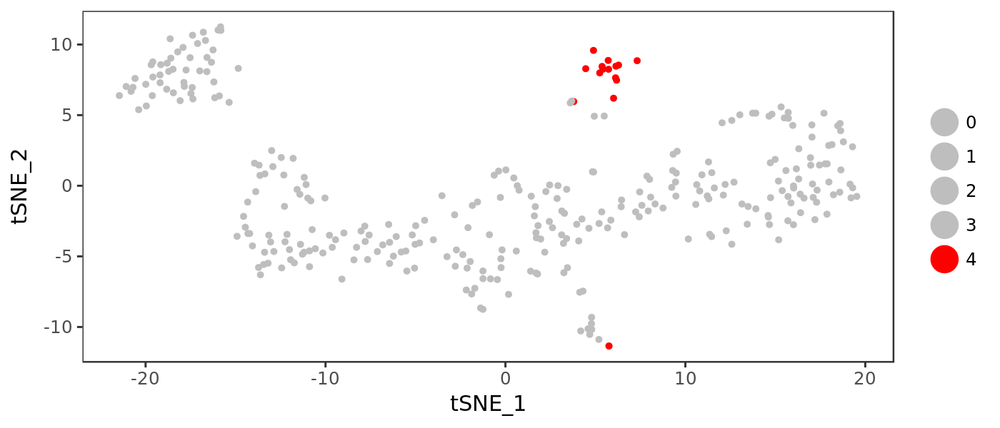

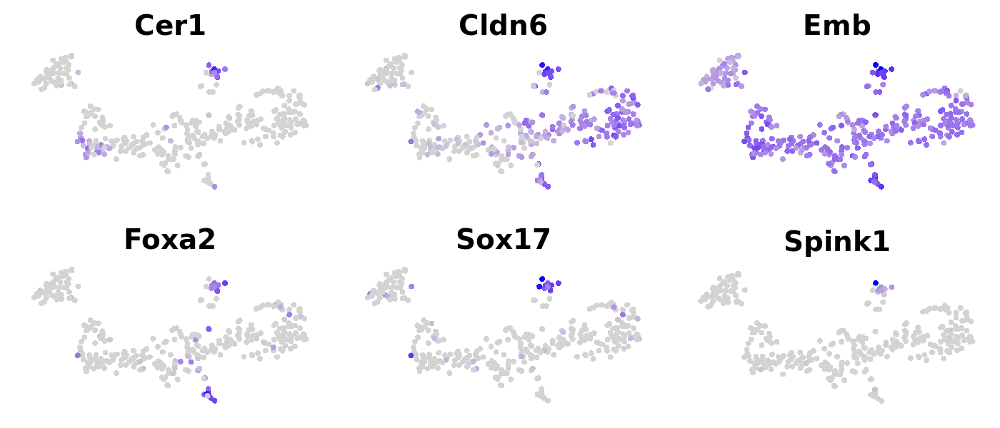

In [627]:
heatMapDimRange(5)
genexprDimRange(5)

#### Dim1:6

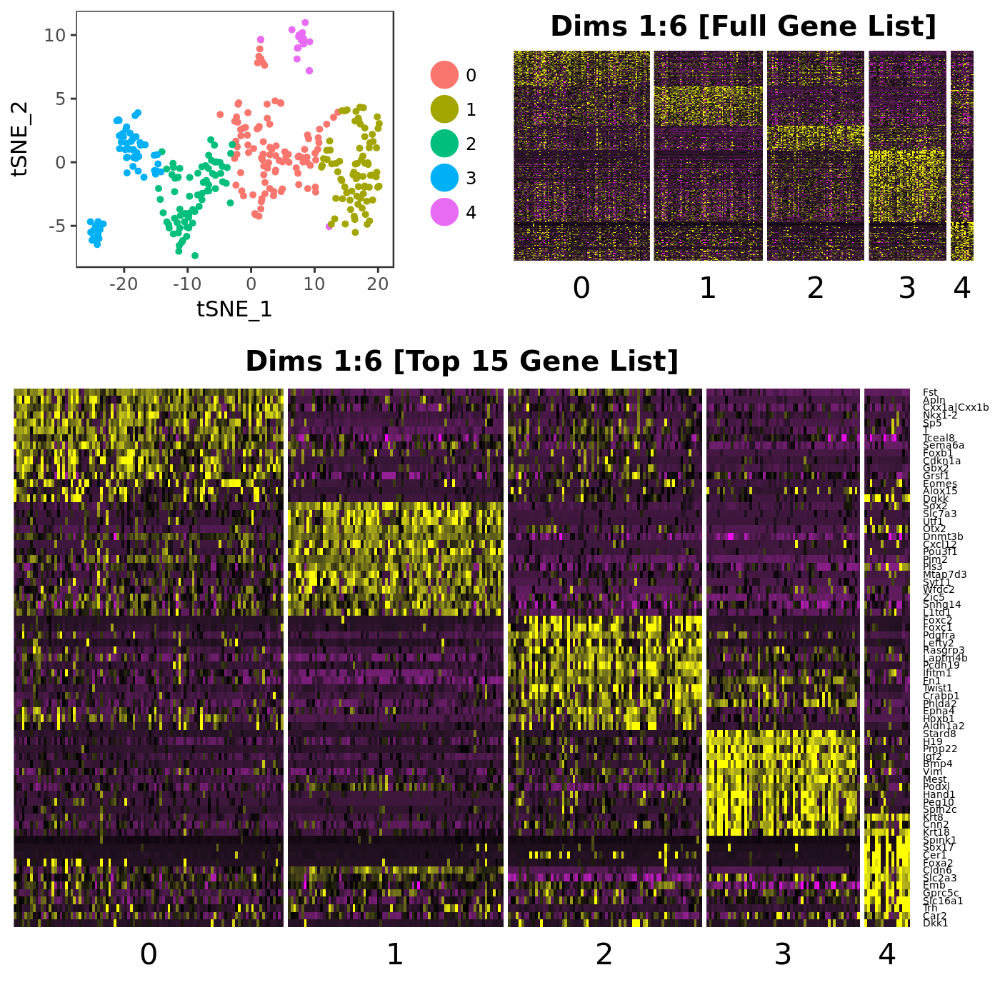

Cluster 0

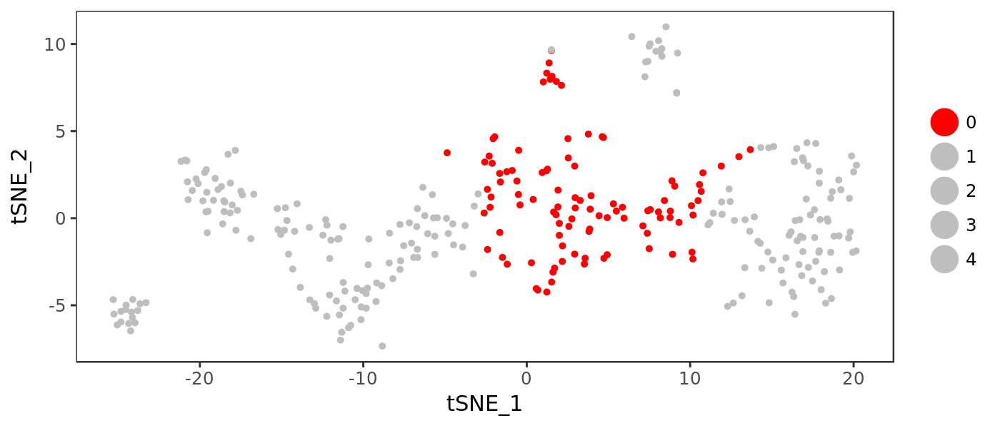

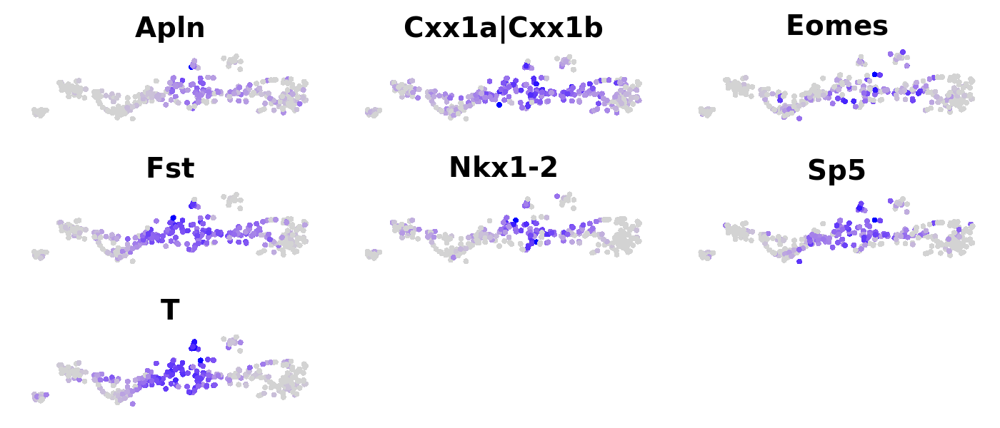

Cluster 1

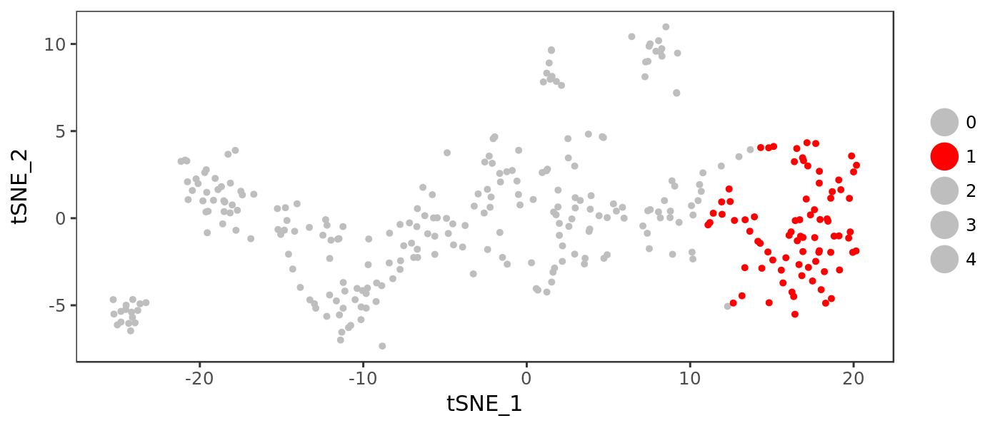

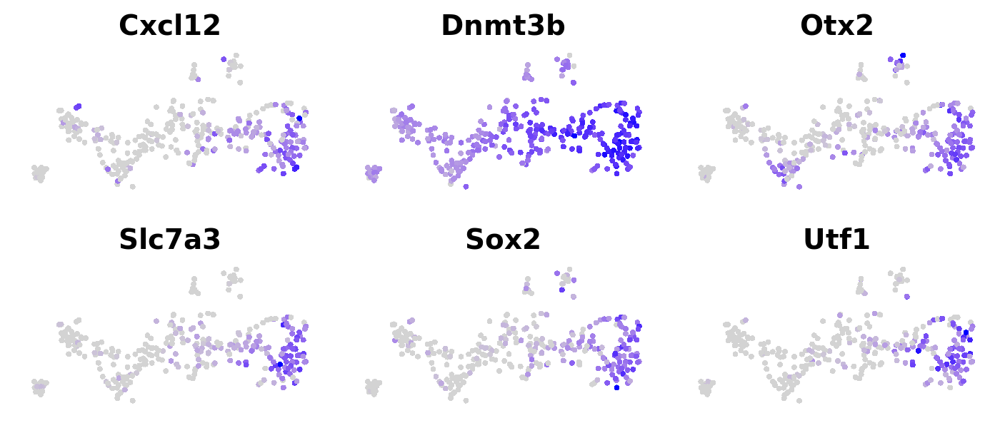

Cluster 2

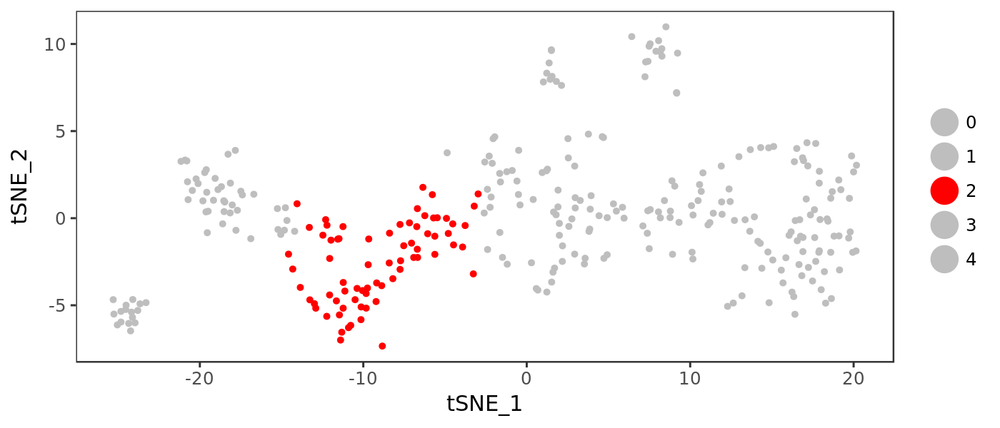

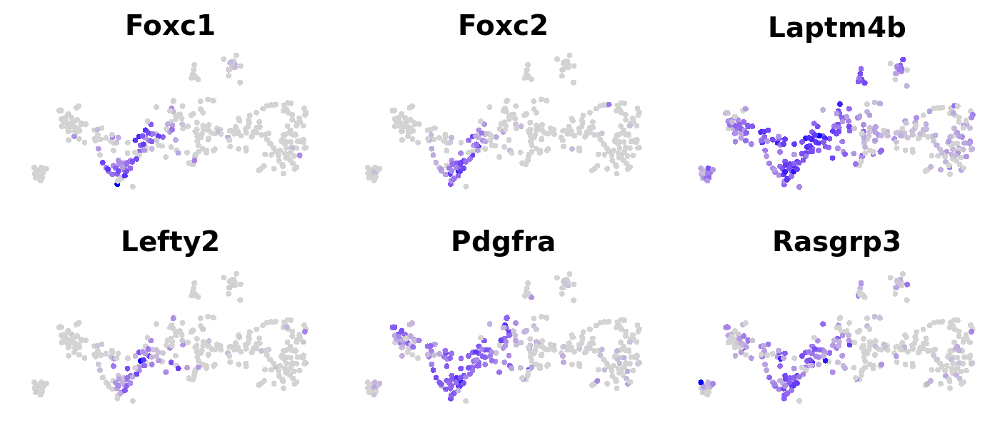

Cluster 3

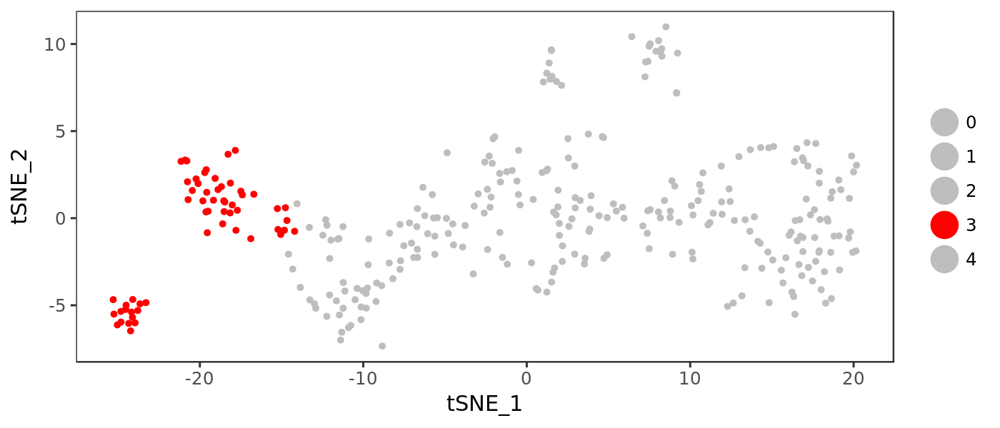

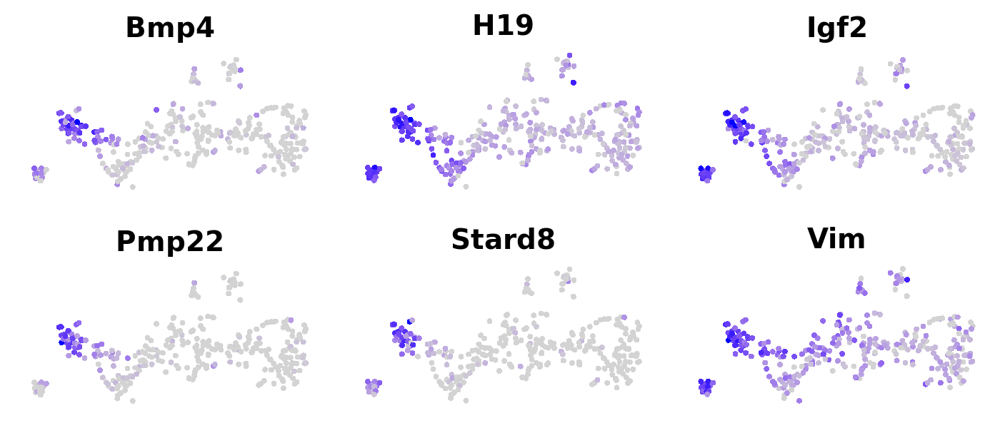

Cluster 4

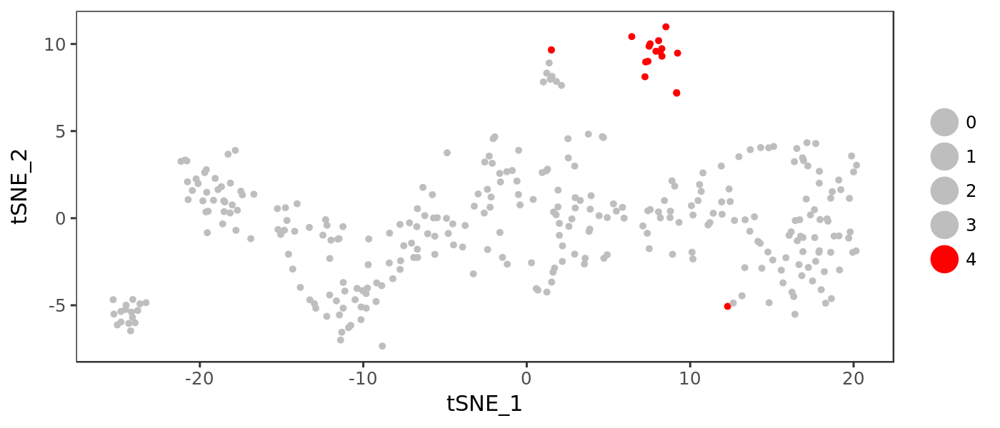

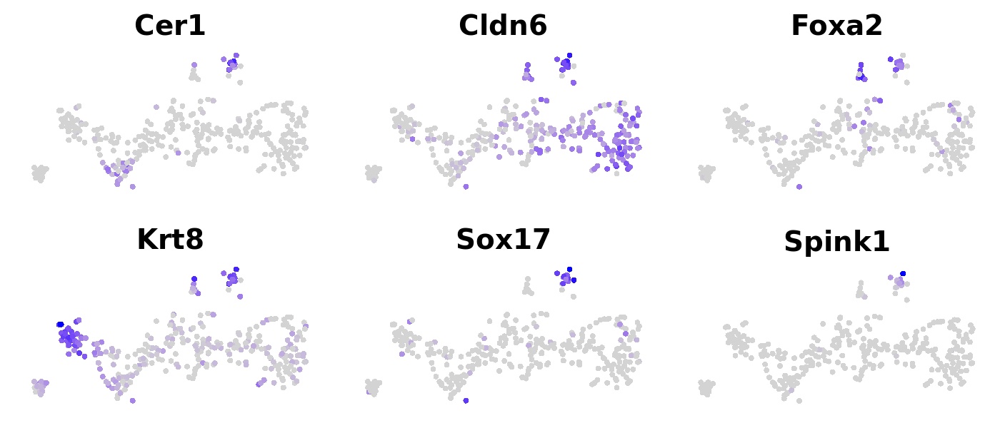

In [628]:
heatMapDimRange(6)
genexprDimRange(6)

#### Summary

 * In Dim1:2 we see good seperation of very weakly-bound clusters, as evidenced by the hazy heatmap which seem to only really show a decent seperation of the 0th and 4th cluster. T appears to exist in equal strength in both



In [630]:
#genexprDimRange(7)

ERROR: Error in tsnes_dim[[dimm]]: subscript out of bounds


Dim1:2

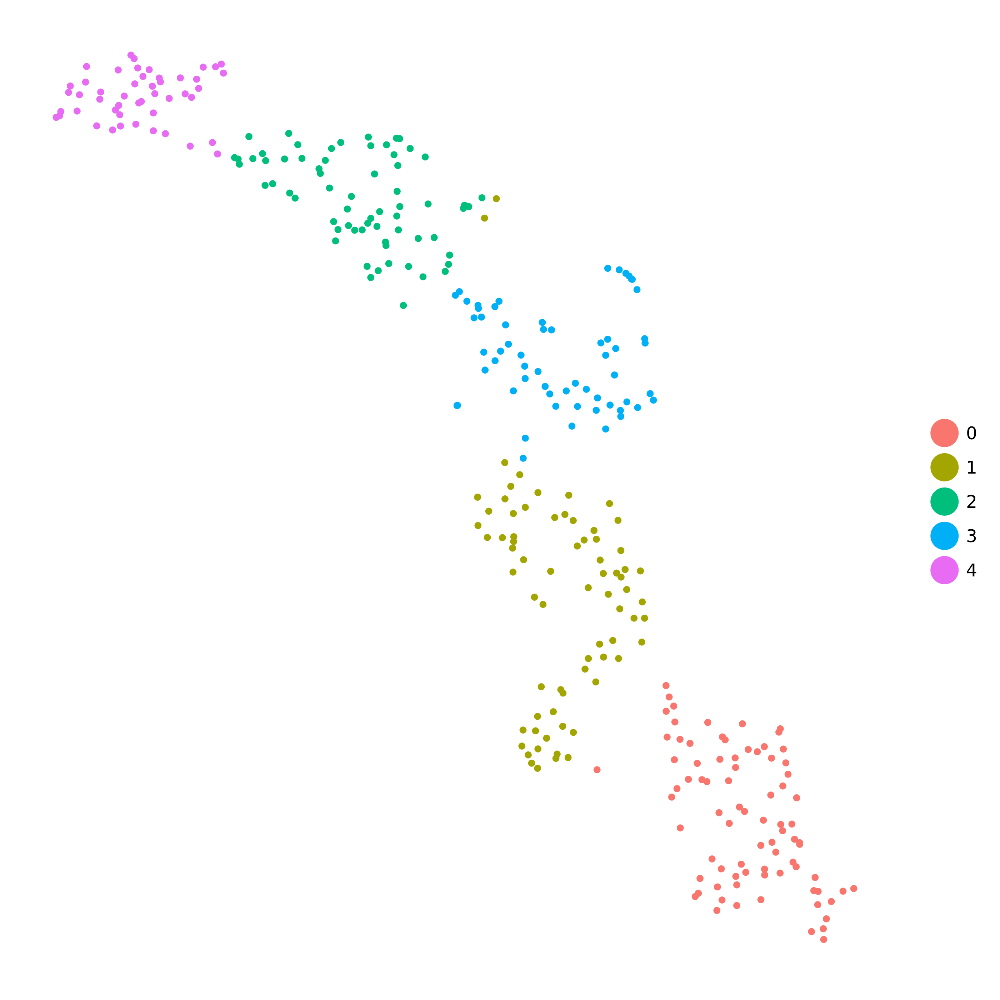

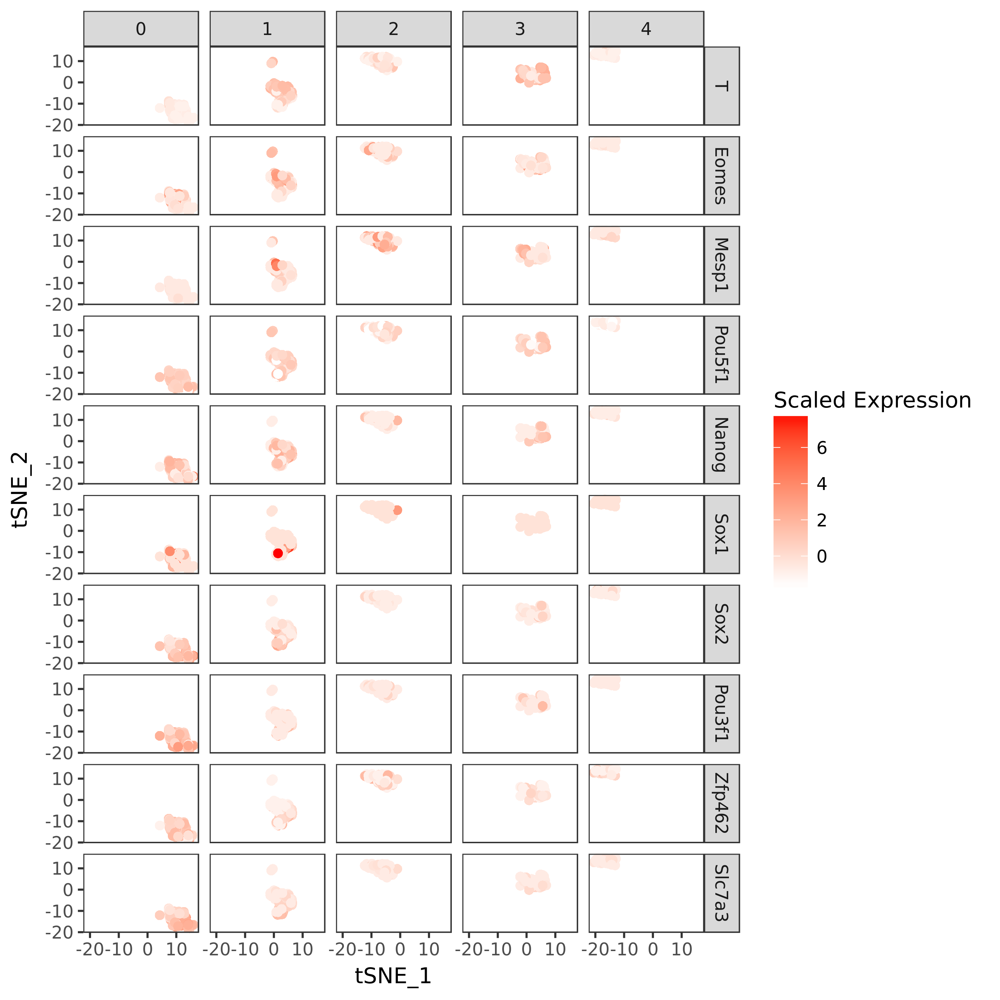

Dim1:3

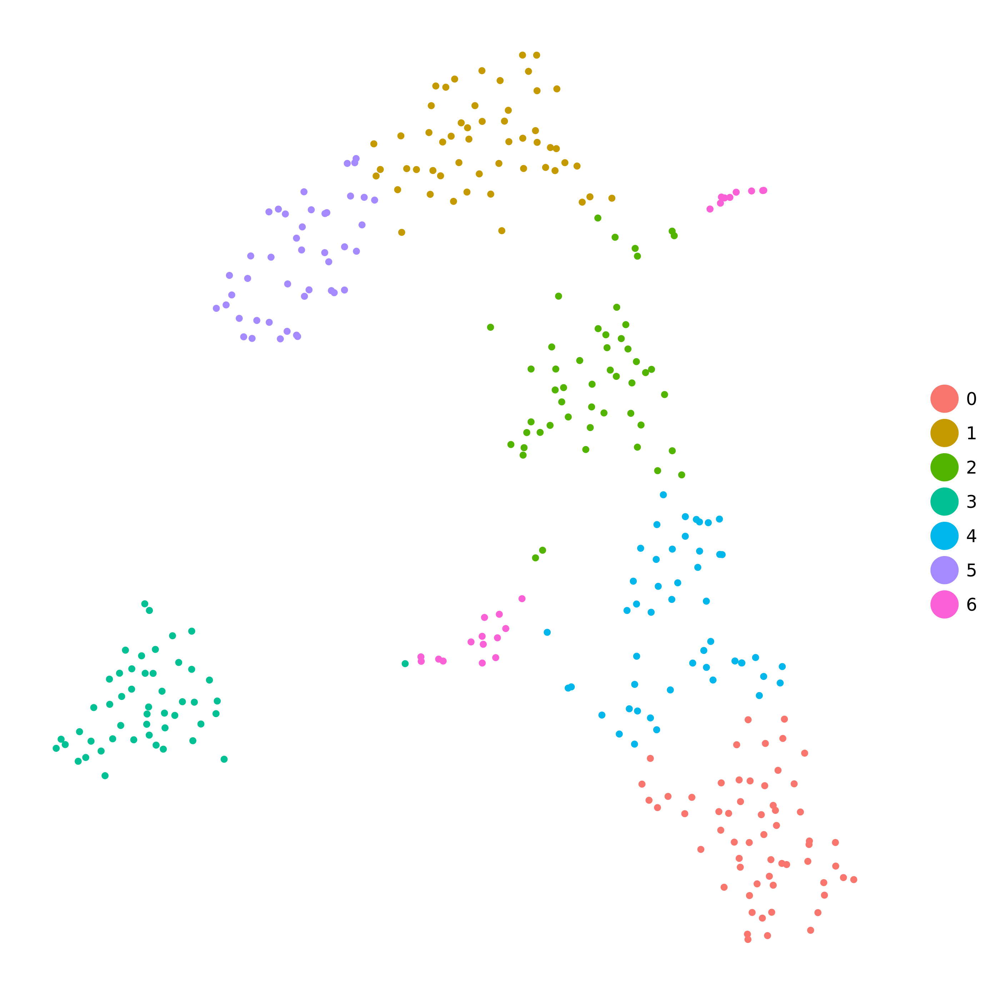

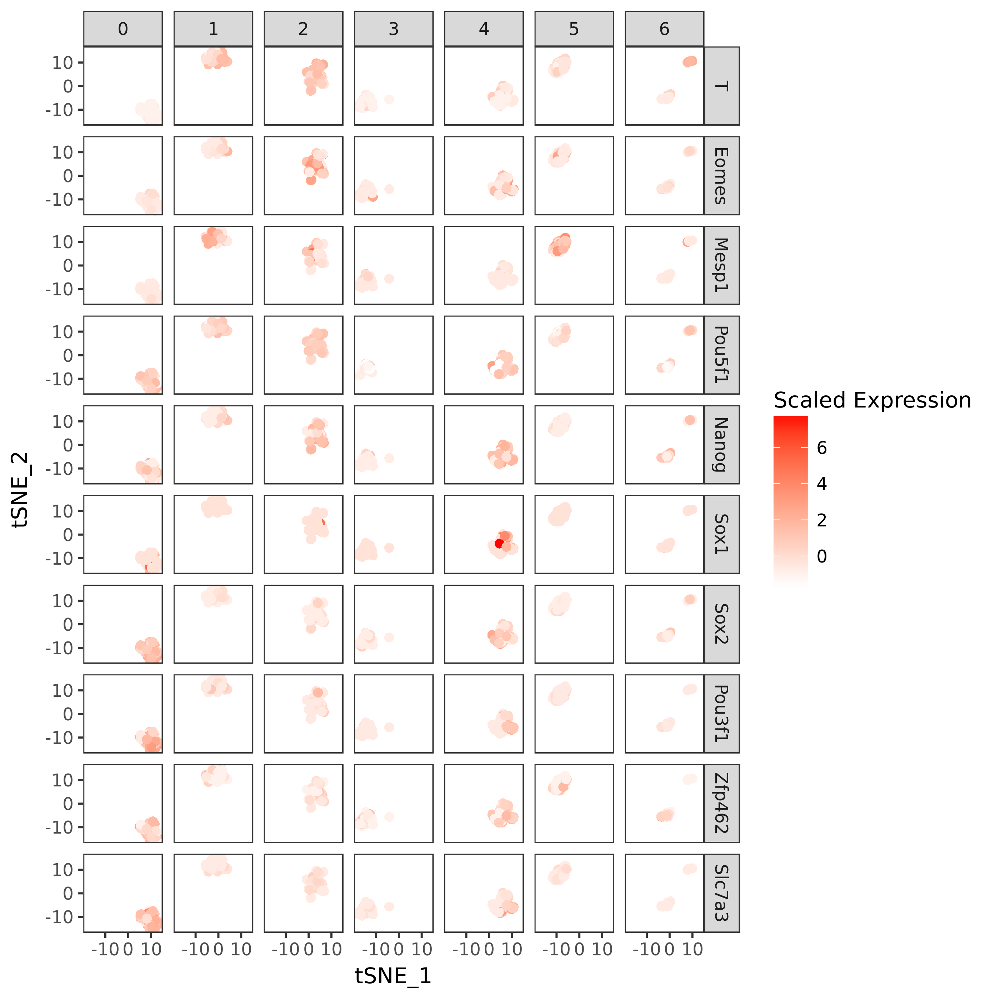

Dim1:4

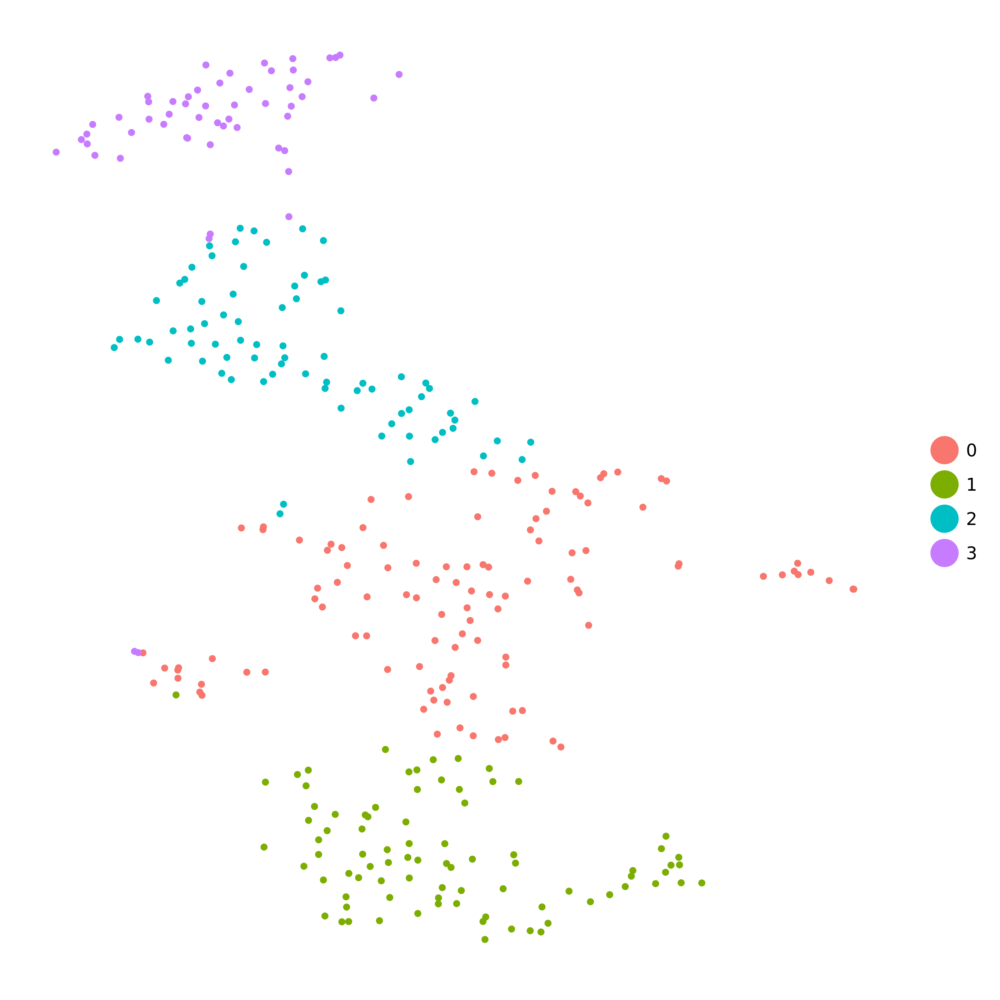

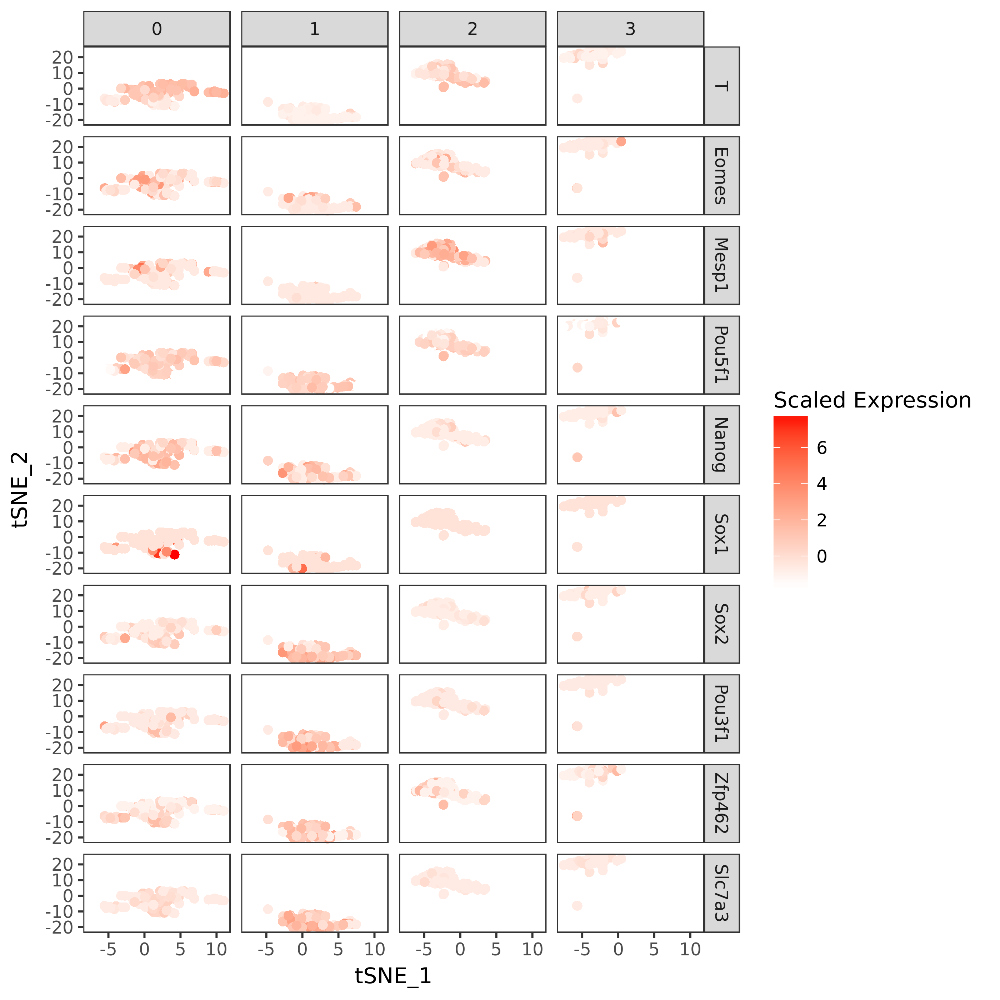

Dim1:5

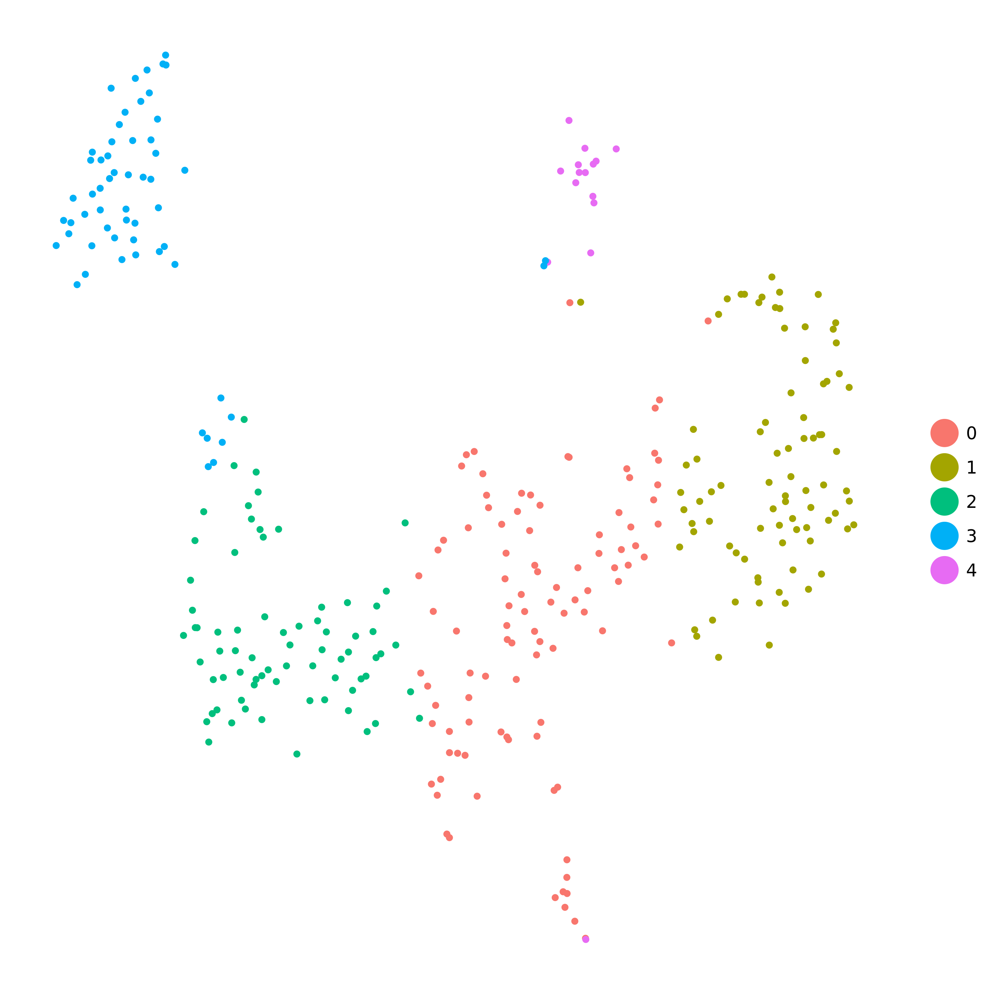

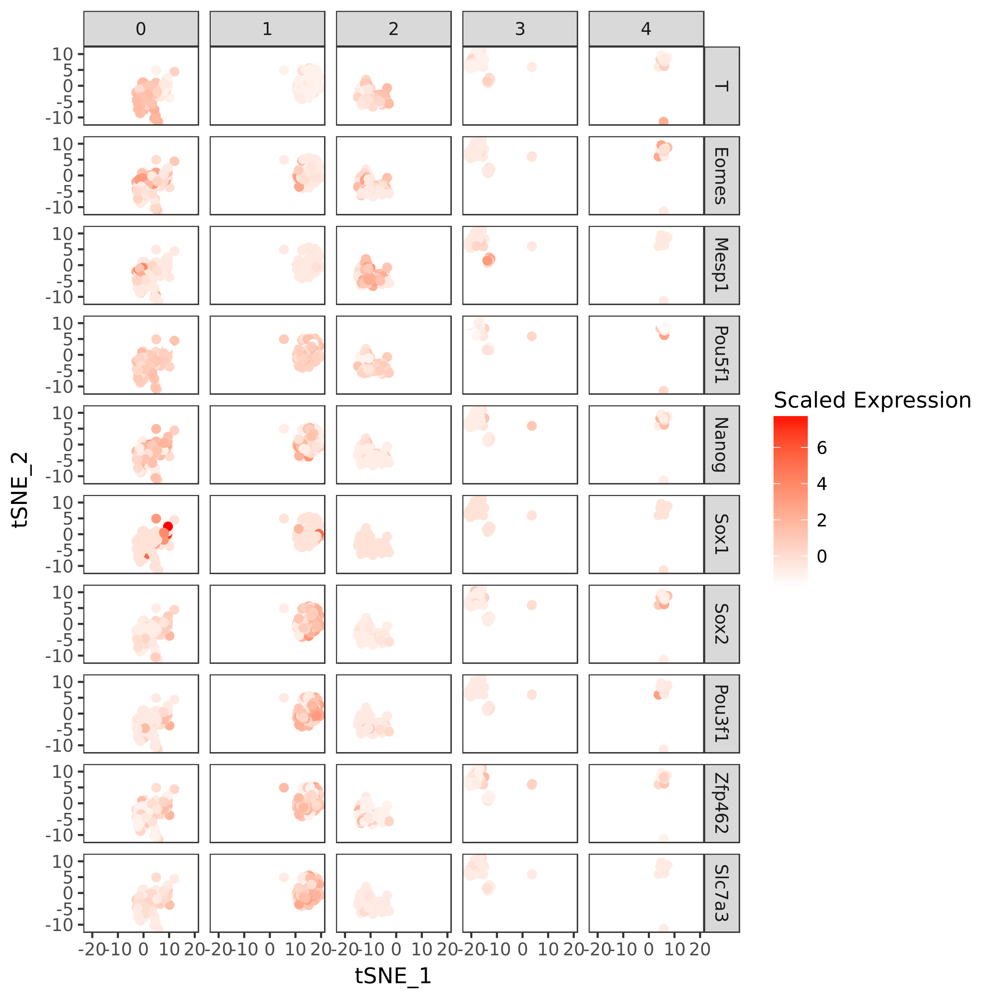

Dim1:6

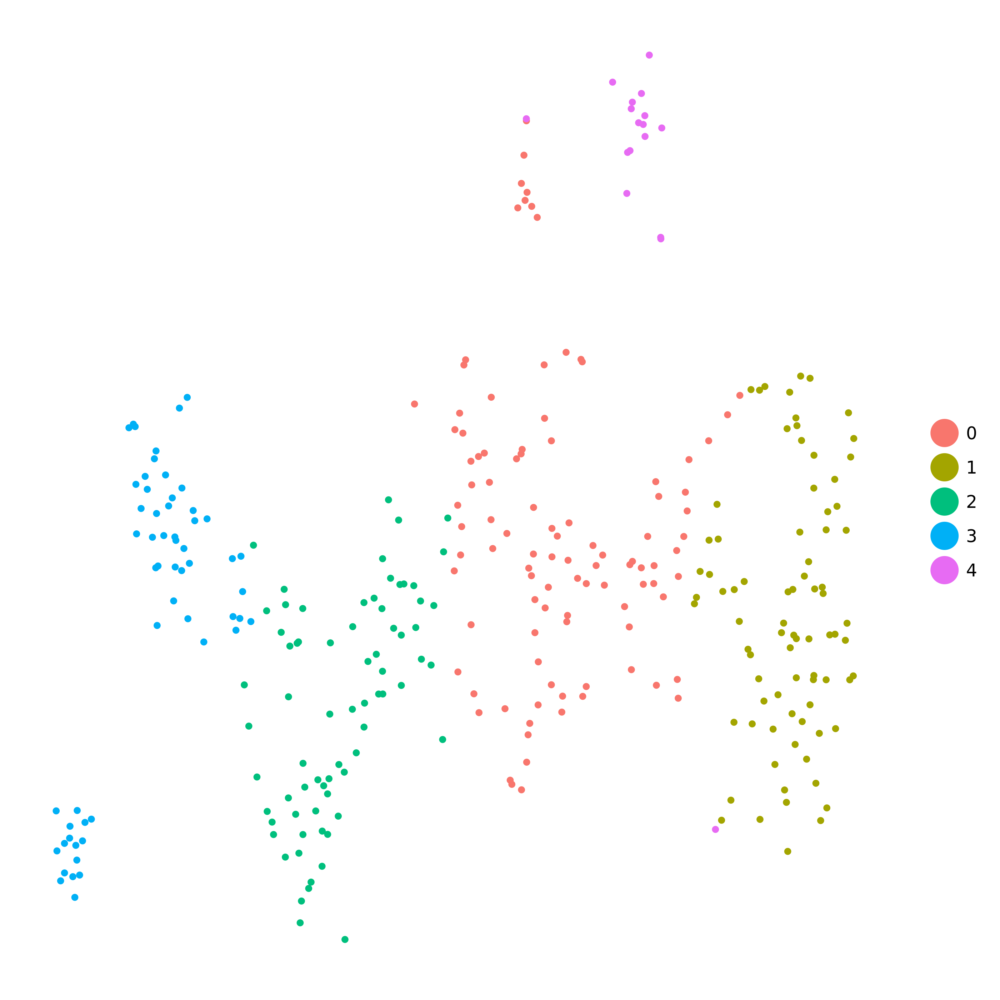

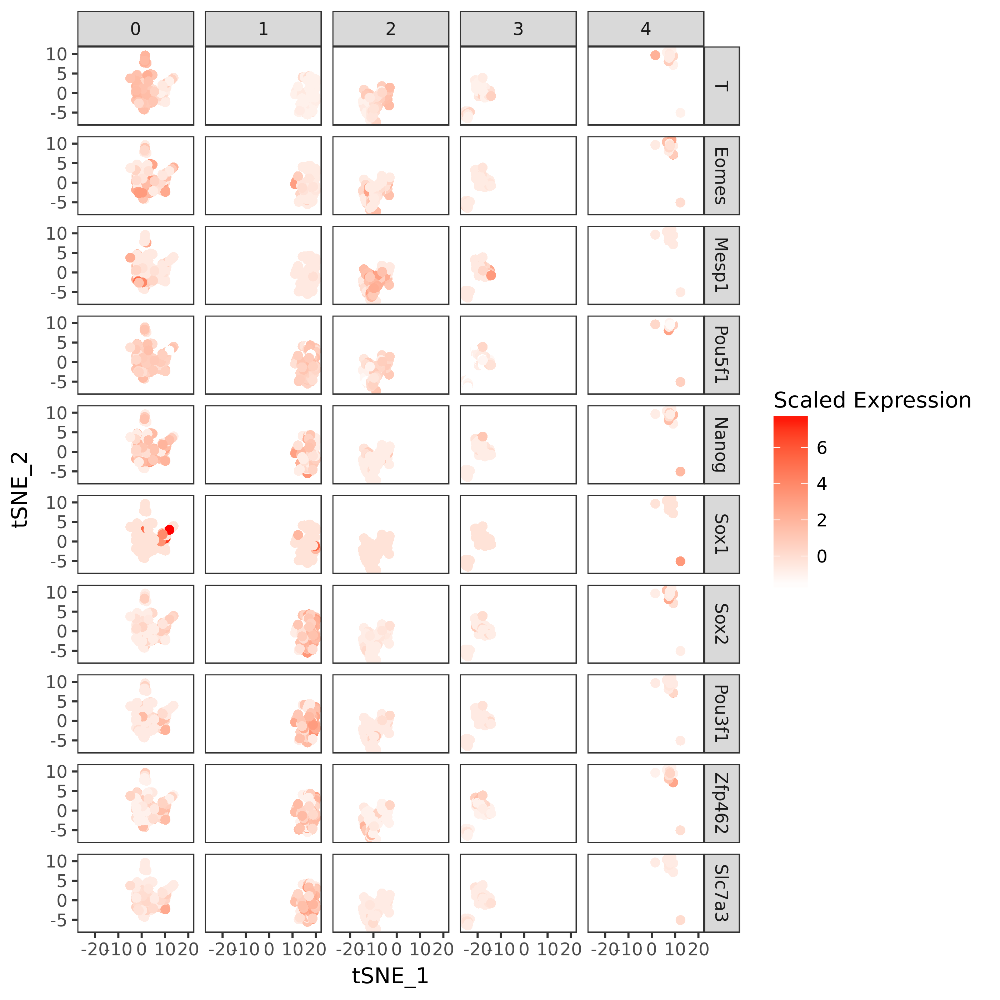

In [705]:

# Let's look at T vs Eomes and where they overlap
gene_list <- c("T", "Eomes", "Mesp1", "Pou5f1", "Nanog", "Sox1", "Sox2", "Pou3f1", "Zfp462", "Slc7a3")

options(repr.plot.height=7)

#for (r in sort(unique(seu@ident))){}
for (r in 2:6){
    seu <- tsnes_dim[[r]]
    tsn <- TSNEPlot(object = seu, do.plot=F, do.return=T, no.axes=T, no.legend = F)
    
    grid.arrange(tsn, layout_matrix = rbind(c(1,1),c(1,1)))

    cat(paste("Dim1:", r, sep=""))
       
    FeatureHeatmap(
        seu,
        gene_list,
        cols.use = c("white", "red"),
    )
}

## Gene ontologies in each cluster

Let's look for gene ontologies assosciated with each cluster.

 * Find top 10 most contributing genes for each cluster.
 * Find ontologies for each gene, and build frequency table
 * Filter table for any features that do not appear more than X times.

In [265]:


mar_10 <- marker_list[[dimm]] %>% group_by(cluster) %>% top_n(15, avg_logFC)
genes_of_interest <- mar_10[,c("gene","cluster")]

In [267]:
# Now we will perform gene labelling to see if we have any mitochondrial genes or other 
## NOTE: If you want to skip pulling data straight from the internet you can skip to the next part and just load K from disk
suppressWarnings(require(biomaRt))
# Annotate the data before adding SC experiment

mart <- useMart(biomart = "ENSEMBL_MART_ENSEMBL", 
                dataset = "mmusculus_gene_ensembl")

k <- getBM(
    filters = "mgi_symbol",
    attributes = c(
            "mgi_symbol",
#            "external_transcript_name",     # Transcript-specific name
#            "gene_biotype",                 # Gene biotype
#            "transcript_biotype",           # Trans type
            "description",                  # Gene description
#            "band",                         # Karyotype band
#            "refseq_mrna",
#            "go_id",                        # Go Term accession (cellular domains)
#            "go_linkage_type",              # Go Term evidence code
            "name_1006",                    # Go Term name
#            "definition_1006",              # Go Term definition
            "namespace_1003"                # Go domain                  
    ),
    values = unique(genes_of_interest$gene),
    mart = mart
)

ERROR: Error in listMarts(host = host, path = path, port = port, includeHosts = TRUE, : Unexpected format to the list of available marts.
Please check the following URL manually, and try ?listMarts for advice.
http://www.ensembl.org:80/biomart/martservice?type=registry&requestid=biomaRt


In [102]:
kk <- unique(k[,c("mgi_symbol","name_1006")])
kk_nest <- kk %>% nest(name_1006)

In [104]:
# Now merge
ass <- merge(genes_of_interest, kk_nest, by.x = "gene", by.y = "mgi_symbol")

In [105]:
## Ontologies for each Gene
head(ass)

gene,cluster,data
Ap1s3,4,"intracellular protein transport , vesicle-mediated transport , membrane coat , protein transport , membrane , Golgi apparatus , molecular_function , cytoplasmic vesicle membrane , cytoplasmic vesicle , intracellular membrane-bounded organelle, clathrin-coated pit , protein targeting"
Apln,0,"hormone activity , signal transduction , apelin receptor binding , regulation of receptor activity , extracellular space , multicellular organism development , extracellular region , G-protein coupled receptor signaling pathway , receptor binding , angiogenesis , gastrulation , G-protein coupled receptor binding , positive regulation of heart contraction , apelin receptor signaling pathway , coronary vasculature development , negative regulation of blood pressure , regulation of the force of heart contraction , feeding behavior , positive regulation of cell proliferation , negative regulation of gene expression , positive regulation of heat generation , negative regulation of fibroblast growth factor receptor signaling pathway , positive regulation of phosphorylation , drinking behavior , regulation of respiratory gaseous exchange , negative regulation of vasoconstriction , regulation of body fluid levels , positive regulation of corticotropin secretion , positive regulation of corticotropin-releasing hormone secretion , positive regulation of blood vessel diameter , positive regulation of pri-miRNA transcription from RNA polymerase II promoter, positive regulation of G-protein coupled receptor internalization , negative regulation of vascular smooth muscle cell proliferation , positive regulation of vascular endothelial cell proliferation , perinuclear region of cytoplasm , signaling"
Cdh1,0,"plasma membrane , membrane , calcium ion binding , homophilic cell adhesion via plasma membrane adhesion molecules, cell adhesion , integral component of membrane , beta-catenin binding , ankyrin binding , GTPase activating protein binding , identical protein binding , gamma-catenin binding , cadherin binding , cell adhesion molecule binding , synapse assembly , response to toxic substance , response to organic substance , pituitary gland development , negative regulation of cell-cell adhesion , neuron projection development , adherens junction organization , response to drug , positive regulation of transcription factor import into nucleus, positive regulation of transcription, DNA-templated , cellular response to lithium ion , cellular response to indole-3-methanol , protein localization to plasma membrane , cell-cell adhesion , cytoplasm , trans-Golgi network , cell-cell adherens junction , cytoplasmic side of plasma membrane , actin cytoskeleton , lateral plasma membrane , catenin complex , flotillin complex , lamellipodium , cell junction , cortical actin cytoskeleton , apical junction complex , perinuclear region of cytoplasm ,"


In [247]:
# Find unique and defining (>2 occurences) of genes within clusters 

findCommonFeaturesInCluster <- function(clust_num, filt = 2){
    # Perform intersection of all data/ontologies within the same cluster
    ccc <- unlist(ass[ass$cluster == clust_num,]$data)
    ccc <- ccc[!grepl("^$", ccc)]
    names(ccc) <- NULL
    tab <- table(ccc)
    if(length(tab)==0){
        return(NULL)
    }
    tab <- cbind(clust_num, data.frame(tab[tab > filt]))
    colnames(tab) <- c("Cluster", "Feature", "Freq")
    tab <- tab[order(-tab$Freq, tab$Feature),]
    rownames(tab) <- NULL
    return(tab)    
}


In [264]:
genes_of_interest

gene,cluster
Fst,0
Cxx1a|Cxx1b,0
Apln,0
Nkx1-2,0
Tceal8,0
Sp5,0
T,0
Foxb1,0
Gbx2,0
Sema6a,0


In [268]:
filt_thresh <- 4
running_table <- NULL

for (cl in sort(unique(seu@ident))){
    running_table <- rbind(running_table,
           findCommonFeaturesInCluster(cl,filt_thresh)
    )
}



In [269]:
# Most defining features in each cluster.
running_table

Cluster,Feature,Freq
0,nucleus,7
0,protein binding,6
0,"regulation of transcription, DNA-templated",6
0,cytoplasm,5
0,DNA binding,5
0,sequence-specific DNA binding,5
0,"transcription, DNA-templated",5
1,cytoplasm,6
1,protein binding,6
1,nucleus,5
